# Pred2Town with XAI

Paper: Black Box Model Explanations and the Human Interpretability Expectations - An Analysis in the Context of Homicide Prediction



Generate files?


In [1]:
do_download_files = True #when change to True, run all notebook!
run_grid_search = False

## Install dependences

In [2]:
!pip install ConeXi

  Preparing metadata (setup.py) ... done
  Created wheel for ConeXi: filename=ConeXi-1.2.9-py3-none-any.whl size=2043 sha256=56f296af6fccdab9efb02e8addc865bb52d19ea9d0c4462c419221dba841edbb
  Stored in directory: /root/.cache/pip/wheels/bd/dc/28/bbbe0e371ac2b5907d1d0728e56f2e7a9c1101d7a61afdbe81
Successfully built ConeXi


In [3]:
from combineranks import ConeXi as combine

In [ ]:
!pip install --upgrade --upgrade-strategy only-if-needed scikit-learn==0.22
#!pip install --upgrade -U scikit-learn==0.22
#!pip install --upgrade -U scikit-learn==1.0.2
!pip install lofo-importance
#!pip install git+https://github.com/oracle/Skater.git #online usa-se este
!pip install -U skater==1.0.2
!pip install info_gain
!pip install shap
!pip install eli5
!pip install dalex
!pip install py-ciu==0.1.0.2
#!pip install pip CIU-Py
!pip install plotly
!pip install adjustText
!pip install scikit_posthocs

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 11.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for scikit-learn
  Running setup.py clean for scikit-learn
Failed to build scikit-learn
ERROR: Could not build wheels for scikit-learn, which is required to install pyproject.toml-based projects
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.0/253.0 kB 10.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.6/123.6 kB 15.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.

In [4]:
!pip install scipy
!pip install venn
!pip install scikit_posthocs

import numpy as np
import pandas as pd
import io
import regex
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import scikit_posthocs as sp
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import numpy as np
import statistics
import os
import gc
import math
import matplotlib.cm as cm
import csv
import io

from scipy import stats
from copy import deepcopy
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from scipy.stats import friedmanchisquare
from scipy.stats import spearmanr
from sklearn.metrics import silhouette_samples, silhouette_score
from google.colab import files
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from matplotlib import cm
from matplotlib.colors import ListedColormap
from tqdm import tqdm
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn import preprocessing
from matplotlib.pyplot import subplots
from venn import venn
from matplotlib_venn import venn2, venn2_circles


  Preparing metadata (setup.py) ... done
  Created wheel for venn: filename=venn-0.1.3-py3-none-any.whl size=19702 sha256=b5e635d09a109d32b77a00d0cb31dae36124baee539b3e6a0301b526ef94bc65
  Stored in directory: /root/.cache/pip/wheels/b8/2a/b1/a1ff9ba87eb919daed348de8c17b00024dfef34b35e7002e6c
Successfully built venn


In [5]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install scikit-learn==0.23.2
!pip install lofo-importance
!pip install git+https://github.com/oracle/Skater.git
!pip install shap
!pip install eli5
!pip install py-ciu

import eli5
import shap
import dalex as dx
from ciu import determine_ciu
from lofo import LOFOImportance, FLOFOImportance, Dataset
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from eli5.sklearn import PermutationImportance

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 29.3 MB/s eta 0:00:00


In [ ]:
from google.colab import files

## Util

In [ ]:


class Util():


  def plotBumpChart(df_features_rank_copy, fold):
    def retornRankPositions(df, myFeature, columns):
      rank = []
      for i,c in enumerate(columns):
        for ii in range(len(df['att_original_names'])):
          if df[columns[i]][ii] == myFeature:
            rank.append(ii)

      if len(rank) != len(columns):
        print('Problem in:'+myFeature)
        print(rank)
      return rank

    df = df_features_rank_copy.copy()
    for i in df.index:
      for c in df.columns:
        df.at[i,c] = df.at[i,c].replace('quant_','')
        df.at[i,c] = df.at[i,c].replace('_crb','')
        df.at[i,c] = df.at[i,c].replace('_num','')
    q = len(df['att_original_names'])
    m = 'rf'
    method_list = ['lofo_'+m,
                   'ci_'+m,
                   'dalex_'+m,
                   'skater_'+m,
                   'eli5_'+m,
                   'shap_'+m]

    list_features = []

    for i in range(q):
      list_features.append({
          'Name': [df['shap_'+m][i] for ii in range(len(method_list))],
          'Method' : method_list,
          'Rank' : retornRankPositions(df,df['shap_'+m][i],method_list)
      })
    fig, ax = plt.subplots()
    plt.rcParams["figure.figsize"] = (7,8)

    colors = ['#1f77b4',
              '#ff7f0e',
              '#ec96aa',
              '#aec7e8',
              '#ffbb78',
              '#2ca02c',
              '#98df8a',
              '#ff9896',
              '#9467bd',
              '#c5b0d5',
              '#9cb4b7',
              '#c49c94',
              '#e377c2',
              '#f7b6d2',
              '#7f7f7f',
              '#c7c7c7',
              '#bcbd22',
              '#dbdb8d',
              '#17becf',
              '#9edae5',
              '#1f77b4',
              '#ff7f0e',
              '#ec96aa',
              '#aec7e8',
              '#ffbb78',
              '#2ca02c',
              '#98df8a',
              '#ff9896',
              '#9467bd',
              '#c5b0d5',
              '#9cb4b7',
              '#c49c94',
              '#e377c2',
              '#f7b6d2',
              '#7f7f7f',
              '#c7c7c7',
              '#bcbd22',
              '#dbdb8d',
              '#17becf',
              '#9edae5']

    i = 0
    for element in list_features:
      ax.plot(element["Method"],
              element["Rank"],
              ".-",                       # format of marker / format of line
              markerfacecolor="white",
              color=colors[i])
      i += 1

    plt.gca().invert_yaxis()
    plt.yticks(np.arange(0, q, 1))
    plt.ylabel('Rank position')



    i = 0
    for element in list_features:
      k = len(element["Rank"]) -1

      line = 0
      if element['Name'][0] == 'ameaca' or element['Name'][0] == 'lesao_corporal' or element['Name'][0] == 'roubo':
        line = 4
      else:
        line = 0.3
      ax.plot(element["Method"],
              element["Rank"],
              ".-", # format of marker / format of line
              markerfacecolor="white",
              linewidth=line, color=colors[i])

      ax.annotate("   "+element["Name"][0],
                  xy=('shap_'+m, element["Rank"][k]),
                  xytext=('shap_'+m,element["Rank"][k]),
                  va="center")
      i = 1 + i

    #plt.gca().invert_yaxis()
    plt.yticks(np.arange(0, q, 1))


    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.savefig('bumpChart_fold'+str(fold)+'.png')

  def plotResumeAllPairs(dt, t):
    df_boxplot = pd.DataFrame(dt)

    cols = []
    if t == 'HxH':
      cols = ['EI: human 1 vs. EI: human 2',
              'EI: human 1 vs. EI: human 3',
              'EI: human 1 vs. EI: human 4',
              'EI: human 1 vs. EI: human 5',
              'EI: human 1 vs. EI: human 6',
              'EI: human 2 vs. EI: human 3',
              'EI: human 2 vs. EI: human 4',
              'EI: human 2 vs. EI: human 5',
              'EI: human 2 vs. EI: human 6',
              'EI: human 3 vs. EI: human 4',
              'EI: human 3 vs. EI: human 5',
              'EI: human 3 vs. EI: human 6',
              'EI: human 4 vs. EI: human 5',
              'EI: human 4 vs. EI: human 6',
              'EI: human 5 vs. EI: human 6']

    elif t == 'HxAI':
      cols = ['EM: shap vs. EI: human 1',
              'EM: shap vs. EI: human 2',
              'EM: shap vs. EI: human 3',
              'EM: shap vs. EI: human 4',
              'EM: shap vs. EI: human 5',
              'EM: shap vs. EI: human 6',
              'EM: eli5 vs. EI: human 1',
              'EM: eli5 vs. EI: human 2',
              'EM: eli5 vs. EI: human 3',
              'EM: eli5 vs. EI: human 4',
              'EM: eli5 vs. EI: human 5',
              'EM: eli5 vs. EI: human 6',
              'EM: dalex vs. EI: human 1',
              'EM: dalex vs. EI: human 2',
              'EM: dalex vs. EI: human 3',
              'EM: dalex vs. EI: human 4',
              'EM: dalex vs. EI: human 5',
              'EM: dalex vs. EI: human 6',
              'EM: ci vs. EI: human 1',
              'EM: ci vs. EI: human 2',
              'EM: ci vs. EI: human 3',
              'EM: ci vs. EI: human 4',
              'EM: ci vs. EI: human 5',
              'EM: ci vs. EI: human 6',
              'EM: lofo vs. EI: human 1',
              'EM: lofo vs. EI: human 2',
              'EM: lofo vs. EI: human 3',
              'EM: lofo vs. EI: human 4',
              'EM: lofo vs. EI: human 5',
              'EM: lofo vs. EI: human 6',
              'EM: skater vs. EI: human 1',
              'EM: skater vs. EI: human 2',
              'EM: skater vs. EI: human 3',
              'EM: skater vs. EI: human 4',
              'EM: skater vs. EI: human 5',
              'EM: skater vs. EI: human 6']

    elif t == 'AIxAI':
      cols = ['EM: shap vs. EM: eli5',
              'EM: shap vs. EM: dalex',
              'EM: shap vs. EM: ci',
              'EM: shap vs. EM: skater',
              'EM: shap vs. EM: lofo',
              'EM: eli5 vs. EM: dalex',
              'EM: eli5 vs. EM: ci',
              'EM: eli5 vs. EM: skater',
              'EM: eli5 vs. EM: lofo',
              'EM: dalex vs. EM: ci',
              'EM: dalex vs. EM: skater',
              'EM: dalex vs. EM: lofo',
              'EM: ci vs. EM: skater',
              'EM: ci vs. EM: lofo',
              'EM: skater vs. EM: lofo']

    df_boxplot = df_boxplot[cols]



    #Sort collumns
    list_medians = []
    for i in range(len(df_boxplot.columns)):
      list_medians.append(statistics.median(df_boxplot.iloc[:,i].values))

    serie_medians = pd.Series(list_medians)

    serie_medians = serie_medians.sort_values()

    ys, names, xs, lc = [],[],[],[]
    val_h_vs_h, val_h_vs_ai, val_ai_vs_ai = [],[],[]
    for i, col in enumerate(df_boxplot.columns[serie_medians.index]):

        ys.append(df_boxplot[col].values)

        p1 = regex.compile('EI: human \d* vs. EI: human \d*')
        m1 = p1.match(col)

        if m1:
          lc.append('red')
          val_h_vs_h.append(float(df_boxplot[col].values[0]))
        else:
          p2 = regex.compile('human')
          m2 = p2.findall(col)
          if m2:
            lc.append('blue')
            val_h_vs_ai.append(float(df_boxplot[col].values[0]))
          else:
              lc.append('green')
              val_ai_vs_ai.append(float(df_boxplot[col].values[0]))

        names.append(col)
        xs.append(i)




    fig = plt.figure(figsize=(int(len(xs)/3)-1,4))


    model_name = 'RF'
    plt.title("Comparison of all features ranks - Algorithm "+ model_name)

    if t == 'AIxAI':
      val = statistics.mean(val_ai_vs_ai)
      plt.axhline(val, c='g',linestyle='--',alpha=0.8)
      plt.text(0.1,val+0.4,'Mean of EM vs. EM:'+str(round(val,2)),c='g')

    if t == 'HxAI':
      val = statistics.mean(val_h_vs_ai)
      plt.axhline(val, c='b',linestyle='--',alpha=0.8)
      plt.text(0.1,val+0.4,'Mean of EM vs. EI:'+str(round(val,2)),c='b')

    if t == 'HxH':
      val = statistics.mean(val_h_vs_h)
      plt.axhline(val, c='r',linestyle='--',alpha=0.8)
      plt.text(0.1,val+0.4,'Mean of EI vs. EI:'+str(round(val,2)),c='r')


    plt.xlabel('Comparison of rank pairs')
    plt.ylabel('Spearman Correlation')

    plt.scatter(names,ys,s=50,c=lc)

    plt.yticks(np.arange(-1.1,1.1,0.1))

    plt.xticks(rotation=90)
    plt.grid(True,c='gainsboro')

  def ajust_df_rank_and_copy(df_feature_rank):
    df_features_rank_copy = df_feature_rank.copy()
    features = df_features_rank_copy['att_original_names']
    #df_features_rank_copy = df_features_rank_copy.drop(columns='att_original_names')
    df_features_rank_copy = df_features_rank_copy.drop(columns='info_gain_ent')
    df_features_rank_copy
    return df_features_rank_copy

  def saveFigs(df_models_info,fold):
    if do_download_files == True:
      name_fig = "fig_spearman_coeficients_matrix_fold"+str(fold)+"_rf.png"
      plt.savefig(name_fig)
      #files.download(name_fig)

    if do_download_files == True:
      name = 'df_models_info_fold'+str(fold)+'_.csv'
      df_models_info.to_csv(name)
      #files.download(name)


  def plotFeatureImportance(model_rf):
    plt.figure(figsize=(20,20))
    features_importances = pd.Series(model_rf.feature_importances_)
    features_names = pd.Series(x_features_names)
    features_importances = features_importances.sort_values()
    plt.barh(features_names[features_importances.index],features_importances)

  def plotVenn(df_feature_rank,fold):
    figure,top_axs = subplots(ncols=1, nrows=1, figsize=(3,3))

    titlesize=12
    labelsize=10
    datasetfontsize=10

    num = 10
    set1 = set(list(df_feature_rank['human_1'][:num])+
              list(df_feature_rank['human_2'][:num])+
              list(df_feature_rank['human_3'][:num])+
              list(df_feature_rank['human_4'][:num])+
              list(df_feature_rank['human_5'][:num])+
              list(df_feature_rank['human_6'][:num]))

    #shap_rf	eli5_rf	dalex_rf	ci_rf	skater_rf	lofo_rf
    set2 = set(list(df_feature_rank['shap_rf'][:num])+
              list(df_feature_rank['eli5_rf'][:num])+
              list(df_feature_rank['dalex_rf'][:num])+
              list(df_feature_rank['ci_rf'][:num])+
              list(df_feature_rank['skater_rf'][:num])+
              list(df_feature_rank['lofo_rf'][:num]))

    sete =  {'AEH':set1,
              'AMXAI':set2}

    v = venn(sete,cmap="plasma",fontsize=labelsize,legend_loc="lower right",ax=top_axs)
    v.set_title('Random Forest',fontsize=titlesize)

    plt.savefig('venn_fold'+str(fold)+'.png')


  def plotVenns(df_feature_rank,fold):
    for i in range(1,11):
      subplots(ncols=1, nrows=1, figsize=(14,14))
      num = i
      A = set(list(df_feature_rank['human_1'][:num])+
                list(df_feature_rank['human_2'][:num])+
                list(df_feature_rank['human_3'][:num])+
                list(df_feature_rank['human_4'][:num])+
                list(df_feature_rank['human_5'][:num])+
                list(df_feature_rank['human_6'][:num]))
      B = set(list(df_feature_rank['shap_rf'][:num])+
                list(df_feature_rank['eli5_rf'][:num])+
                list(df_feature_rank['dalex_rf'][:num])+
                list(df_feature_rank['ci_rf'][:num])+
                list(df_feature_rank['skater_rf'][:num])+
                list(df_feature_rank['lofo_rf'][:num]))


      v = venn2([A,B], ('Explaination by Humans', 'Explaination by AI'))

      ppp=v.get_label_by_id('100').set_text('\n'.join(A-B))
      v.get_label_by_id('110').set_text('\n'.join(A&B))
      v.get_label_by_id('010').set_text('\n'.join(B-A))

      v.get_patch_by_id('100').set_color('blue')
      v.get_patch_by_id('110').set_color('gray')
      v.get_patch_by_id('010').set_color('yellow')
      plt.title(str(i)+' features compared')
      plt.show()
      print("")
      print("")
      print("")
      plt.savefig('venns_i_'+str(i)+'_fold'+str(fold)+'_.png')

  def train_test_split_by_stratified_k_fold(fold_selected, X, Y,skf):
    #skf.get_n_splits(X, Y)
    #print(skf)
    for i, (train_index, test_index) in enumerate(skf.split(X, Y)):
        if i == fold_selected:
          print(f"Fold selected {i}:")
          #print(f"  Train: index={train_index}")
          #print(f"  Test:  index={test_index}")
          return X.iloc[train_index], X.iloc[test_index], Y.iloc[train_index], Y.iloc[test_index] #X_train, X_test, y_train, y_test

  def returnParamByGridSearchPosition(search,position):
    results_df = pd.DataFrame(search.cv_results_)
    results_df = results_df.sort_values(by=["rank_test_score"])
    results_df = results_df.set_index(
        results_df["params"].apply(lambda x: "_".join(str(val) for val in x.values()))
    ).rename_axis("kernel")
    result = results_df[["params", "rank_test_score", "mean_test_score", "std_test_score"]]
    result = result.reset_index()
    print('Model by rank position: '+str(position))
    print(result.iloc[position])
    print()
    return result.at[position,'params']

  def intersection(v1, v2):
    v3 = [value for value in v1 if value in v2]
    return v3

  def repareSizeNew(v1, v2):
    sv1 = Util.intersection(v1,v2)
    sv2 = Util.intersection(v2,v1)
    return sv1, sv2


  def repareSize(v1, v2):
    len1 = len(v1)
    len2 = len(v2)
    vBig = []
    vSma = []
    if len1 > len2:
      vBig = v1
      vSma = v2
    if len1 < len2:
      vBig = v2
      vSma = v1

    i = 0
    vBigCopy = vBig.copy()
    while len(vBig) > len(vSma):
      element = vBigCopy[i]
      if not element in vSma: # elemento do vetor maior nao existe no vetor menor
        vBig.remove(element)
      i+=1

    if len1 > len2:
      return vBig, vSma
    if len1 < len2:
      return vSma, vBig

    return v1, v2



  def is_int(n):
    isInteger = False
    for i in range(len(n)):
      if isinstance(n[i],float):
        return False
    return True

## XAI tools

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Thu Feb  4 14:32:39 2021

@author: Jose Ribeiro
"""

class ExplainableTools():
  def explainRankByLofo(model,X,Y,names_x_attributes):
    df = X.copy()
    df['class'] = Y.to_list()
    dataset = Dataset(df=df, target="class", features=names_x_attributes)
    fi = LOFOImportance(dataset, scoring='roc_auc', model=model,cv=3)
    #fi = FLOFOImportance(validation_df=df, target='class', features=names_x_attributes,scoring="roc_auc",trained_model=model)
    importances = fi.get_importance()
    importances = importances.sort_values(by=['importance_mean','feature'],ascending=False) #fix problem of equals values of explaination
    return importances['feature'].to_list()

  def explainRankByEli5(model, names_x_attributes):

      rank = eli5.explain_weights_df(model,  feature_names = names_x_attributes, top=None)
      rank = rank.sort_values(by=['weight','feature'],ascending=False) #fix problem of equals values of explaination
      return rank['feature'].to_list()


  def explainRankByKernelShap(model,x_features_names, X,is_gradient=False): # shap.sample(data, K) or shap.kmeans(data, K)
    np.random.seed(0)
    explainer = shap.KernelExplainer(model.predict_proba, X[:],nsamples=len(x_features_names))
    shap_values = explainer.shap_values(X[:])
    if is_gradient == False:
        vals= np.abs(shap_values).sum(1)
    else:
        vals= np.abs([shap_values]).sum(1) #correction []
    temp_df = pd.DataFrame(list(zip(x_features_names, sum(vals))), columns=['feat_name','shap_value'])
    temp_df = temp_df.sort_values(by=['shap_value','feat_name'], ascending=False) #fix problem of equals values of explaination
    return list(temp_df['feat_name'])


  def explainRankByTreeShap(model, x_features_names, X, is_gradient=False):
      np.random.seed(0)
      shap_values = shap.TreeExplainer(model).shap_values(X)
      if is_gradient == False:
        vals= np.abs(shap_values).mean(0)
      else:
        vals= np.abs([shap_values]).mean(0) #correction []
      temp_df = pd.DataFrame(list(zip(x_features_names, sum(vals))), columns=['feat_name','shap_value'])
      temp_df = temp_df.sort_values(by=['shap_value','feat_name'], ascending=False) #fix problem of equals values of explaination

      return temp_df['feat_name'].to_list()

  def explainRankByCiu(model, x_test, feature_names,context_dic,rank):

    def _makeRankByCu(ciu):
      df_cu = pd.DataFrame(list(ciu.cu.items()), columns=['attribute', 'cu'])
      df_cu = df_cu.sort_values(by='cu', ascending=False)
      #ciu.plot_cu()
      return df_cu['attribute'].to_list()

    def _makeRankByCi(ciu):
      df_ci = pd.DataFrame(list(ciu.ci.items()), columns=['attribute', 'ci'])
      df_ci = df_ci.sort_values(by=['ci','attribute'], ascending=False) #fix problem of equals values of explaination
      return df_ci['attribute'].to_list()

    case = x_test.values[0]
    example_prediction = model.predict([x_test.values[0]])
    example_prediction_probs = model.predict_proba([x_test.values[0]])
    prediction_index = list(example_prediction_probs[0]).index(max(example_prediction_probs[0]))




    ciu = determine_ciu(
        x_test.iloc[[1]],
        model.predict_proba,
        X.to_dict('list'),
        samples = 1000,
        prediction_index = 1)

    if rank == 'ci':
      result = _makeRankByCi(ciu)
    else:
      if rank == 'cu':
        result = _makeRankByCu(ciu)
      else:
        result = {}

    #ciu
    return result

  def explainRankByAlibi(model_path,X_train): # -- deprecated
    model = tf.keras.models.load_model(model_path)
    ig  = IntegratedGradients(model, layer=None, method="gausslegendre",
                          n_steps=50, internal_batch_size=100)
    explanation = ig.explain(X_train, baselines=None, target=None)
    attributions = explanation.attributions
    return attributions

  def explainRankSkater(model, X, x_features_names):
    interpreter = Interpretation(X.to_numpy(), feature_names=x_features_names)
    model_new = InMemoryModel(model.predict_proba,examples=X.to_numpy())
    rank = interpreter.feature_importance.feature_importance(model_new,ascending=False, progressbar=False)
    rank = rank.to_frame(name='values')
    rank = rank.reset_index()
    rank = rank.rename(columns={'index':'variable','values':'values'})
    rank = rank.sort_values(by=['values','variable'],ascending=False) #fix problem of equals values of explaination
    return rank['variable'].to_list()

  def explainRankDalex(model, X_train, y_train):
    explainer = dx.Explainer(model, X_train, y_train,verbose=False)
    explanation = explainer.model_parts()
    rank = explanation.result
    rank = rank[rank.variable != '_baseline_']
    rank = rank[rank.variable != '_full_model_']
    rank = rank.sort_values(by=['dropout_loss','variable'],ascending=False) #fix problem of equals values of explaination
    return rank['variable'].tolist()

  #Calculando ganho de informacao


  def explainRankByInfoGain(X,Y, attribute_X_names):



    def InfoGain(data,attribute_X_name,target_name):
      """
      Calculate the information gain of a dataset. This function takes three parameters:
      1. data = The dataset for whose feature the IG should be calculated
      2. attribute_X_name = the name of the feature for which the information gain should be calculated
      3. target_name = the name of the target feature. The default for this example is "class"
      """

      def entropy(target_col):
        """
        Calculate the entropy of a dataset.
        The only parameter of this function is the target_col parameter which specifies the target column
        """
        elements,counts = np.unique(target_col,return_counts = True)
        entropy = np.sum([(-counts[i]/np.sum(counts))*np.log2(counts[i]/np.sum(counts)) for i in range(len(elements))])
        return entropy



      #Calculate the entropy of the total dataset
      total_entropy = entropy(data[target_name])

      ##Calculate the entropy of the dataset

      #Calculate the values and the corresponding counts for the split attribute
      vals,counts= np.unique(data[attribute_X_name],return_counts=True)

      #Calculate the weighted entropy
      Weighted_Entropy = np.sum([(counts[i]/np.sum(counts))*entropy(data.where(data[attribute_X_name]==vals[i]).dropna()[target_name]) for i in range(len(vals))])

      #Calculate the information gain
      result = total_entropy - Weighted_Entropy

      return result

    data = X.copy()
    target_name = 'class'
    data[target_name] = Y.to_list()

    rank = pd.Series([InfoGain(data,feature,target_name) for feature in attribute_X_names], index=attribute_X_names).sort_values(ascending=False)
    rank = rank.to_frame(name='values')
    rank = rank.reset_index()
    rank = rank.rename(columns={'index':'variable','values':'values'})
    rank = rank.sort_values(by=['values','variable'],ascending=False) #fix problem of equals values of explaination
    return rank['variable'].to_list()



## Preprocess

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Wed Feb  3 14:55:08 2021

@author: Jose Ribeiro
"""
class PreprocessDefault():

  def z_score(df):
    # copy the dataframe
    df_std = df.copy()
    # apply the z-score method
    for column in df_std.columns:
        df_std[column] = (df_std[column] - df_std[column].mean()) / df_std[column].std()

    return df_std

  def normalize(df):
    # copy the dataframe
    df_norm = df.copy()
    # apply min-max scaling
    for column in df_norm.columns:
        if(len(df_norm[column].unique()) > 1): #fix NaN generation
          df_norm[column] = (df_norm[column] - df_norm[column].min()) / (df_norm[column].max() - df_norm[column].min())
        else:
          df_norm[column] = 0
    return df_norm






## Analysis

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Wed Feb  3 16:02:02 2021

@author: Jose Ribeiro
"""

class AnalysisDefault():



  def calcAccuracyPrecisionRecallByModel(y_test,y_pred):
      ac = [accuracy_score(y_test, y_pred)]
      pr = [precision_score(y_test, y_pred)]
      re = [recall_score(y_test, y_pred)]

      d = {'Accuracy': ac,
              'Precision': pr,
              'Recall': re}
      dataframe_analisys = pd.DataFrame(data=d)
      print("")
      print(dataframe_analisys)
      print("")
      return ac, pr, re



  def calcCrossValidation(model, X_train, y_train, cv, plotGraph):
      hit_rates = cross_val_score(model, X_train, y_train, cv=cv)
      if plotGraph == True:
          sns.kdeplot(data=hit_rates,legend=True,bw_method=0.7)

      return hit_rates

  def plotComparationCrossValidation(hr_rf,hr_gb,hr_dt, file_name):
      dt_tmp = {
            'GB':hr_gb,
            'DT':hr_dt,
            'RF':hr_rf
            }
      dt_tmp = pd.DataFrame(dt_tmp)

      fig, ax = plt.subplots(figsize=(8,6))
      sns.kdeplot(data=dt_tmp,legend=True,bw_method=0.7)
      plt.savefig(file_name)
      plt.show()

  def plotFriedmanTest(hr_rf,hr_gb,hr_dt, file_name):
      a = [hr_rf.tolist(),hr_gb.tolist(), hr_dt.tolist()]

      print('Friedman Test')
      print(friedmanchisquare(*a))
      posthoc = sp.posthoc_nemenyi_friedman(list(map(list, zip(*a))))
      models_names = ['RF','GB', 'DT']
      ax = sns.heatmap(posthoc, vmin=0, vmax=1, xticklabels=models_names,yticklabels=models_names,cmap="Greens",linewidths=.5,annot=True)
      plt.savefig(file_name)
      plt.show()

  def plotFriedmanTestDataProperty(c0,c1,c2, file_name):
      a = [c0.tolist(),c1.tolist(), c2.tolist()]

      print('Friedman Test')
      print(friedmanchisquare(*a))
      posthoc = sp.posthoc_nemenyi_friedman(list(map(list, zip(*a))))
      models_names = ['c0','c1', 'c2']
      ax = sns.heatmap(posthoc, vmin=0, vmax=1, xticklabels=models_names,yticklabels=models_names,cmap="Greens",linewidths=.5,annot=True)
      plt.savefig(file_name)
      if do_download_files == True:
        files.download(file_name)
      plt.show()

  def calcJaccardScore(m, n):
    score = jaccard_score(m,n)
    return score

  def calcGoodmanKruskalGamma(m, n):
    """
    compute the Goodman and Kruskal gamma rank correlation coefficient;
    this statistic ignores ties is unsuitable when the number of ties in the
    data is high. it's also slow.

    >>> x = [2, 8, 5, 4, 2, 6, 1, 4, 5, 7, 4]
    >>> y = [3, 9, 4, 3, 1, 7, 2, 5, 6, 8, 3]
    >>> goodman_kruskal_gamma(x, y)
    0.9166666666666666
    """
    num = 0
    den = 0
    for (i, j) in permutations(range(len(m)), 2):
        m_dir = m[i] - m[j]
        n_dir = n[i] - n[j]
        sign = m_dir * n_dir
        if sign > 0:
            num += 1
            den += 1
        elif sign < 0:
            num -= 1
            den += 1
    return num / float(den)


  def calcKendallCoef(d1,d2):
    coef, p = stats.kendalltau(d1, d2)
    return coef, p

  def calcSpearmanCoef(d1,d2):
    coef, p = spearmanr(d1, d2)
    return coef, p

  def calcSpearmanCoefWithDel(d1,d2):
    d1_copy = d1.copy()
    d2_copy = d2.copy()
    count1 = 0
    count2 = 0

    for i in range(len(d1_copy)):
      flag = False
      for ii in range(len(d2_copy)):
        if d1_copy[i] == d2_copy[ii]:
          flag = True
      if flag == False:
        d1_copy[i] = 'X'
        count1 += 1

    for i in range(len(d2_copy)):
      flag = False
      for ii in range(len(d1_copy)):
        if d2_copy[i] == d1_copy[ii]:
          flag = True
      if flag == False:
        d2_copy[i] = 'X'
        count2 += 1

    print(d1_copy)
    print()
    print(d2_copy)

    for i in range(count1):
      d1_copy.remove('X')
    for i in range(count2):
      d2_copy.remove('X')


    print(d1_copy)
    print()
    print(d2_copy)
    coef, p = spearmanr(d1_copy, d2_copy)
    return coef

  def calcCountEqual(d1,d2):
    equals = 0
    for i in range(len(d1)):
      if d1[i] == d2[i]:
        equals = equals + 1
    return equals

  def calcCountCommon(d1,d2):
    #Conta variaveis em comum entre as listas
    common = 0
    for i in range(len(d1)):
      for ii in range(len(d2)):
        if d1[i] == d2[ii]:
          common = common + 1
    return common



  #InformationGain
  ###################



  ###################

  ###################


  def calcInfoGain(data,split_attribute_name,target_name="class"):
      """
      Calculate the information gain of a dataset. This function takes three parameters:
      1. data = The dataset for whose feature the IG should be calculated
      2. split_attribute_name = the name of the feature for which the information gain should be calculated
      3. target_name = the name of the target feature. The default for this example is "class"
      """
      def _entropy(target_col):
        """
        Calculate the entropy of a dataset.
        The only parameter of this function is the target_col parameter which specifies the target column
        """
        elements,counts = np.unique(target_col,return_counts = True)
        entropy = np.sum([(-counts[i]/np.sum(counts))*np.log2(counts[i]/np.sum(counts)) for i in range(len(elements))])
        return entropy


      #Calculate the entropy of the total dataset
      total_entropy = _entropy(data[target_name])

      ##Calculate the entropy of the dataset

      #Calculate the values and the corresponding counts for the split attribute
      vals,counts= np.unique(data[split_attribute_name],return_counts=True)

      #Calculate the weighted entropy
      Weighted_Entropy = np.sum([(counts[i]/np.sum(counts))*_entropy(data.where(data[split_attribute_name]==vals[i]).dropna()[target_name]) for i in range(len(vals))])

      #Calculate the information gain
      Information_Gain = total_entropy - Weighted_Entropy
      return Information_Gain



## Data loading and preparation

In [ ]:
dataset_name = 'pred2town'
file_dataset_name = 'Pred2Town_Pre-processed_by_Orange_binary_class_with_metadata_clean.csv'
name_target_class = 'Class'
uploaded1 = files.upload()
df = pd.read_csv(io.BytesIO(uploaded1[file_dataset_name]),index_col=0, encoding="UTF-8", sep=",")

Saving Pred2Town_Pre-processed_by_Orange_binary_class_with_metadata_clean.csv to Pred2Town_Pre-processed_by_Orange_binary_class_with_metadata_clean.csv


In [ ]:
np.random.seed(42)
# Set target value and others features.
y_feature_name = name_target_class

Y = (df[y_feature_name].astype(int))

x_features_names = list(df.head(0))
x_features_names.remove(name_target_class)
X =  df[x_features_names]
df_pred2town_origin = df.copy()

In [ ]:
df

,mes_num_crb,quant_lesao_corporal_crb,quant_ameaca_crb,quant_roubo_crb,quant_injuria_crb,quant_furto_crb,quant_lesao_no_transito_crb,quant_dano_no_transito_crb,quant_difamacao_crb,quant_homicidio_crb,...,quant_receptacao_crb,quant_estupro_crb,quant_desaparecimento_de_pessoa_crb,quant_tentativa_de_homicidio_crb,quant_poluicao_sonora_crb,quant_outras_fraudes_crb,quant_desobediencia_crb,quant_desacato_crb,quant_perturbacoes_da_tranquilidade_crb,Class
0,1.0,0.000000,0.048193,0.002433,0.00000,0.020619,0.000000,0.000000,0.000000,0.071429,...,0.166667,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000,0
1,1.0,0.081633,0.084337,0.124088,0.03125,0.036082,0.233333,0.000000,0.000000,0.071429,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000,1
2,1.0,0.000000,0.132530,0.063260,0.03125,0.018041,0.066667,0.027027,0.000000,0.000000,...,0.000000,0.0,0.2,0.0,0.000000,0.0,0.166667,0.0,0.125,1
3,1.0,0.183673,0.168675,0.141119,0.06250,0.126289,0.100000,0.027027,0.000000,0.000000,...,0.000000,0.0,0.4,0.0,0.000000,0.0,0.166667,0.4,0.125,0
4,1.0,0.040816,0.012048,0.017032,0.00000,0.038660,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.2,0.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2648,12.0,0.306122,0.289157,0.141119,0.15625,0.118557,0.100000,0.060811,0.166667,0.071429,...,0.000000,0.0,0.2,0.2,0.000000,0.0,0.000000,0.0,0.000,0
2649,12.0,0.183673,0.277108,0.192214,0.28125,0.381443,0.366667,0.506757,0.222222,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.166667,0.0,0.000,0
2650,12.0,0.040816,0.012048,0.043796,0.00000,0.015464,0.000000,0.047297,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000,0
2652,12.0,0.040816,0.060241,0.075426,0.06250,0.090206,0.066667,0.243243,0.166667,0.071429,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000,0


## Calculate ranks

In [ ]:
def calcRanks(X_train, X_test, y_train, y_test, X, Y, fold):

  apply_smote = False



  #This dataset will be complete (with values) only in final of notebook
  dt = {'dataset_name':[],
          'model_name':[],
          'model_params':[],
          'accuracy':[],
          'precision':[],
          'recall':[],
          'correct_true':[],
          'correct_false':[]}
  df_models_info = pd.DataFrame(dt)

  dt = {'dataset_name':[],
          'model_name':[],
          'xai_vs_xai':[],
          'correlation':[]}
  df_resume_boxplot = pd.DataFrame(dt)



  #if run_train_test_model_* is False the upload of model is required
  run_train_test_model_rf = True

  crossvalidation = 4

  cv_grid_search = crossvalidation

  save_split_train_test_data = True


  df_models_info.loc[0,'dataset_name'] = str(dataset_name)



  dt = {'att_original_names':[],
        'shap_rf':[],
        'eli5_rf':[],
        'dalex_rf':[],
        'ci_rf':[],
        'skater_rf':[],
        'lofo_rf':[],
        'human_1':[],
        'human_2':[],
        'human_3':[],}

  df_feature_rank = pd.DataFrame(dt)
  attribute_names = X.columns.to_list()
  df_feature_rank['att_original_names'] = attribute_names


  #normalize data by min-max
  X = PreprocessDefault.normalize(X)

  #print("pos processado")
  print(X.head(n=100))

  #create context dictionary (necessary to CIU)
  context_dic = {}
  for k in range(len(attribute_names)):
    context_dic[attribute_names[k]] = [min(X[attribute_names[k]]), max(X[attribute_names[k]]), Util.is_int(X[attribute_names[k]])]


  if save_split_train_test_data == True:
      name_dataset = dataset_name

      if do_download_files == True:
        X_train.to_csv("X_train_"+name_dataset+"_fold"+str(fold)+".csv")
        #files.download("X_train_"+name_dataset+".csv")

        X_test.to_csv("X_test_"+name_dataset+"_fold"+str(fold)+".csv")
        #files.download("X_test_"+name_dataset+".csv")

        y_train.to_csv("y_train_"+name_dataset+"_fold"+str(fold)+".csv")
        #files.download("y_train_"+name_dataset+".csv")

        y_test.to_csv("y_test_"+name_dataset+"_fold"+str(fold)+".csv")
        #files.download("y_test_"+name_dataset+".csv")


  #execution of model RF

  file_name = 'model_rf_'+dataset_name+'_fold'+str(fold)+'.sav'

  df_models_info.loc[1,'model_name'] = 'RF'

  if run_train_test_model_rf == True:

    if run_grid_search == True:
      param_grid = {
          'max_depth': [1, 6, 12, 24],
          'bootstrap': [True, False],
          'n_estimators': [100, 200, 300, 400],
          'min_samples_leaf': [1, 10, 20, 40, 50],
          'ccp_alpha': [0.0, 0.2, 0.4],
          'criterion': ['gini', 'entropy'],
          'max_features': ['sqrt', 'log2']
      }


      # Create a based model
      model_rf = RandomForestClassifier()
      # Instantiate the grid search model
      #https://scikit-learn.org/stable/auto_examples/model_selection/plot_cv_indices.html#sphx-glr-auto-examples-model-selection-plot-cv-indices-py
      grid_search = GridSearchCV(estimator = model_rf,
                                param_grid = param_grid,
                                cv = StratifiedKFold(cv_grid_search),
                                n_jobs = 3,
                                verbose = 2,
                                scoring = 'roc_auc')


      # Fit the grid search to the data
      grid_search.fit(X_train, y_train)

      grid_search.best_params_

      #param = Util.returnParamByGridSearchPosition(grid_search,0) # best
      model_rf = grid_search.best_params_
      #model_rf.fit(X_train,y_train)
    else:
      #params selected by gridsearch
      model_rf = RandomForestClassifier(bootstrap=False, criterion='entropy', max_depth=12, max_features='sqrt', n_estimators=200)
      model_rf.fit(X_train, y_train)


    #save model
    pickle.dump(model_rf, open(file_name, 'wb'))
    #if do_download_files == True:
      #files.download(file_name)
  else:
    model_rf = pickle.load(open(file_name, 'rb'))

  y_pred_rf=model_rf.predict(X_test)

  df_models_info.loc[1,'model_params'] = str(model_rf.get_params())

  #analysis precision, accuracy and recall
  ac, pr, re = AnalysisDefault.calcAccuracyPrecisionRecallByModel(y_test,y_pred_rf)

  df_models_info.loc[1,'accuracy'] = ac
  df_models_info.loc[1,'precision'] = pr
  df_models_info.loc[1,'recall'] = re

  #deepcopys
  model_rf_shap = deepcopy(model_rf)
  model_rf_eli5 = deepcopy(model_rf)
  model_rf_dalex = deepcopy(model_rf)
  model_rf_ciu = deepcopy(model_rf)
  model_rf_skater = deepcopy(model_rf)
  model_rf_lofo = deepcopy(model_rf)

  #statistical analysis
  hit_rates = AnalysisDefault.calcCrossValidation(model_rf,X_train, y_train, crossvalidation, False)
  hit_rates_rf = hit_rates


  #explanation by tree shap
  print('Explanation by shap....')
  df_feature_rank['shap_rf'] = ExplainableTools.explainRankByTreeShap(model_rf_shap, attribute_names, X_test)


  #explanation by eli5
  print('Explanation by eli5....')
  df_feature_rank['eli5_rf'] = ExplainableTools.explainRankByEli5(model_rf_eli5,attribute_names)


  #explanation by dalex
  print('Explanation by dalex....')
  df_feature_rank['dalex_rf'] = ExplainableTools.explainRankDalex(model_rf_dalex,X_test, y_test)

  #explanation by ci
  print('Explanation by ci....')
  df_feature_rank['ci_rf'] = ExplainableTools.explainRankByCiu(model_rf_ciu, X_test, attribute_names, context_dic,rank='ci')

  #explanation by skater
  print('Explanation by skater....')
  df_feature_rank['skater_rf'] = ExplainableTools.explainRankSkater(model_rf_skater, X_test, attribute_names)

  #explanation by lofo
  print('Explanation by lofo....')
  df_feature_rank['lofo_rf'] = ExplainableTools.explainRankByLofo(model_rf_lofo, X_test, y_test, attribute_names)

  #explanation by human_1
  print('Explanation by Human 1....')
  df_feature_rank['human_1'] = ["mes_num_crb","quant_homicidio_crb","quant_tentativa_de_homicidio_crb",
                                "quant_roubo_crb","quant_roubo_de_veiculo_crb","quant_desaparecimento_de_pessoa_crb",
                                "quant_ameaca_crb","quant_conflitos_vicinais_crb","quant_estupro_crb",
                                "quant_agressao_fisica_crb","quant_abandono_do_lar_crb",
                                "quant_apropriacao_indebita_crb","quant_calunia_crb",
                                "quant_conflitos_conjugais_crb","quant_conflitos_familiares_crb",
                                "quant_dano_civil_crb","quant_dano_crb","quant_dano_no_transito_crb",
                                "quant_desacato_crb","quant_desobediencia_crb","quant_difamacao_crb",
                                "quant_estelionato_crb","quant_estupro_de_vulneravel_crb","quant_fuga_do_lar_crb",
                                "quant_furto_crb","quant_injuria_crb","quant_lesao_corporal_crb","quant_lesao_no_transito_crb",
                                "quant_outras_fraudes_crb","quant_outros_fatos_atipicos_crb","quant_perturbacoes_da_tranquilidade_crb",
                                "quant_poluicao_sonora_crb","quant_receptacao_crb","quant_trafico_de_drogas_crb","quant_vias_de_fato_crb"]

  #explanation by human_2
  print('Explanation by Human 2....')
  df_feature_rank['human_2'] = ["quant_homicidio_crb","quant_tentativa_de_homicidio_crb","quant_roubo_crb","quant_roubo_de_veiculo_crb",
                                "quant_estupro_crb","quant_estupro_de_vulneravel_crb","quant_trafico_de_drogas_crb","quant_lesao_corporal_crb",
                                "quant_agressao_fisica_crb","quant_ameaca_crb","quant_abandono_do_lar_crb","quant_apropriacao_indebita_crb",
                                "quant_calunia_crb","quant_conflitos_conjugais_crb","quant_conflitos_familiares_crb","quant_conflitos_vicinais_crb",
                                "quant_dano_civil_crb","quant_dano_crb","quant_dano_no_transito_crb","quant_desobediencia_crb",
                                "quant_difamacao_crb","quant_estelionato_crb","quant_fuga_do_lar_crb","quant_desaparecimento_de_pessoa_crb",
                                "quant_furto_crb","quant_injuria_crb","quant_lesao_no_transito_crb",
                                "quant_desacato_crb","mes_num_crb","quant_outras_fraudes_crb","quant_outros_fatos_atipicos_crb",
                                "quant_perturbacoes_da_tranquilidade_crb","quant_poluicao_sonora_crb",
                                "quant_receptacao_crb","quant_vias_de_fato_crb"]


  #explanation by human_3
  print('Explanation by Human 3....')
  df_feature_rank['human_3'] = ["quant_conflitos_conjugais_crb","quant_conflitos_familiares_crb","quant_lesao_corporal_crb",
                                "quant_estupro_crb","quant_estupro_de_vulneravel_crb","quant_tentativa_de_homicidio_crb",
                                "quant_homicidio_crb","quant_roubo_crb","quant_roubo_de_veiculo_crb","quant_trafico_de_drogas_crb",
                                "quant_abandono_do_lar_crb","quant_agressao_fisica_crb","quant_ameaca_crb","quant_apropriacao_indebita_crb",
                                "quant_calunia_crb","quant_conflitos_vicinais_crb","quant_dano_civil_crb","quant_dano_crb",
                                "quant_dano_no_transito_crb","quant_desacato_crb","quant_desaparecimento_de_pessoa_crb",
                                "quant_desobediencia_crb","quant_difamacao_crb","quant_estelionato_crb","quant_fuga_do_lar_crb",
                                "quant_furto_crb","quant_injuria_crb","quant_lesao_no_transito_crb","mes_num_crb","quant_outras_fraudes_crb",
                                "quant_outros_fatos_atipicos_crb","quant_perturbacoes_da_tranquilidade_crb","quant_poluicao_sonora_crb",
                                "quant_receptacao_crb","quant_vias_de_fato_crb"]

  #explanation by human_4
  print('Explanation by Human 4....')
  df_feature_rank['human_4'] = ["quant_ameaca_crb","quant_vias_de_fato_crb","quant_agressao_fisica_crb","quant_lesao_corporal_crb",
                                "quant_conflitos_familiares_crb","quant_conflitos_vicinais_crb","quant_conflitos_conjugais_crb",
                                "quant_trafico_de_drogas_crb","quant_tentativa_de_homicidio_crb","quant_homicidio_crb",
                                "quant_abandono_do_lar_crb","quant_apropriacao_indebita_crb","quant_calunia_crb","quant_dano_civil_crb",
                                "quant_dano_crb","quant_dano_no_transito_crb","quant_desacato_crb","quant_desaparecimento_de_pessoa_crb",
                                "quant_desobediencia_crb","quant_difamacao_crb","quant_estelionato_crb","quant_estupro_crb",
                                "quant_estupro_de_vulneravel_crb","quant_furto_crb","quant_fuga_do_lar_crb","quant_injuria_crb",
                                "quant_lesao_no_transito_crb","mes_num_crb","quant_outras_fraudes_crb","quant_outros_fatos_atipicos_crb",
                                "quant_perturbacoes_da_tranquilidade_crb","quant_poluicao_sonora_crb","quant_receptacao_crb","quant_roubo_crb",
                                "quant_roubo_de_veiculo_crb"]

  #explanation by human_5
  print('Explanation by Human 5....')
  df_feature_rank['human_5'] = ["quant_homicidio_crb","quant_tentativa_de_homicidio_crb","quant_trafico_de_drogas_crb","quant_roubo_crb",
                                "quant_conflitos_vicinais_crb","quant_lesao_corporal_crb","quant_ameaca_crb","quant_estupro_crb",
                                "quant_estupro_de_vulneravel_crb","quant_desaparecimento_de_pessoa_crb","quant_perturbacoes_da_tranquilidade_crb",
                                "quant_agressao_fisica_crb","mes_num_crb","quant_outros_fatos_atipicos_crb","quant_furto_crb",
                                "quant_roubo_de_veiculo_crb","quant_vias_de_fato_crb","quant_dano_no_transito_crb","quant_calunia_crb",
                                "quant_injuria_crb","quant_difamacao_crb","quant_poluicao_sonora_crb","quant_estelionato_crb",
                                "quant_receptacao_crb","quant_lesao_no_transito_crb","quant_conflitos_conjugais_crb","quant_apropriacao_indebita_crb",
                                "quant_outras_fraudes_crb","quant_conflitos_familiares_crb","quant_dano_crb","quant_dano_civil_crb",
                                "quant_desacato_crb","quant_desobediencia_crb","quant_fuga_do_lar_crb","quant_abandono_do_lar_crb"]

  #explanation by human_6
  print('Explanation by Human 6....')
  df_feature_rank['human_6'] = ["quant_estupro_crb","quant_trafico_de_drogas_crb","quant_roubo_crb","quant_desaparecimento_de_pessoa_crb",
                                "quant_ameaca_crb","quant_agressao_fisica_crb","quant_vias_de_fato_crb","quant_lesao_corporal_crb",
                                "quant_tentativa_de_homicidio_crb","quant_homicidio_crb","quant_abandono_do_lar_crb","quant_apropriacao_indebita_crb",
                                "quant_calunia_crb","quant_conflitos_conjugais_crb","quant_conflitos_familiares_crb","quant_conflitos_vicinais_crb",
                                "quant_dano_civil_crb","quant_dano_crb","quant_dano_no_transito_crb","quant_desacato_crb","quant_desobediencia_crb",
                                "quant_difamacao_crb","quant_estelionato_crb","quant_estupro_de_vulneravel_crb","quant_fuga_do_lar_crb",
                                "quant_furto_crb","quant_injuria_crb","quant_lesao_no_transito_crb","mes_num_crb","quant_outras_fraudes_crb",
                                "quant_outros_fatos_atipicos_crb","quant_perturbacoes_da_tranquilidade_crb","quant_poluicao_sonora_crb",
                                "quant_receptacao_crb","quant_roubo_de_veiculo_crb"]
  return df_feature_rank, model_rf, df_models_info



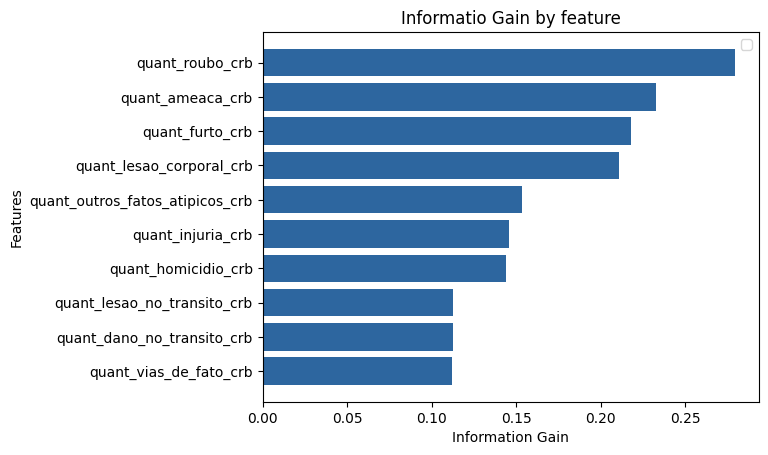

In [ ]:

information_gain = pd.Series([AnalysisDefault.calcInfoGain(df_pred2town_origin,feature,y_feature_name) for feature in x_features_names], index=x_features_names).sort_values(ascending=False)

#df_feature_rank['info_gain_ent'] = information_gain.index[:]

quant = 10

sns.barplot(x=information_gain[:quant], y=information_gain.index[:quant], color = (0.1, 0.4, 0.7, 0.6)) #Criando bar plot
plt.xlabel('Information Gain')
plt.ylabel('Features')
plt.title("Informatio Gain by feature")
plt.legend()
plt.autoscale(enable=True, axis='both', tight=None)
plt.show()

## Main function

In [ ]:
plt.rcParams["figure.dpi"] = 100

In [ ]:
def main_analysis_by_top(top_n_features_compare):
  #spearman correlation rf

  #rf
  lt_rf_shap_vs_shap = []
  lt_rf_shap_vs_eli5 = []
  lt_rf_shap_vs_dalex = []
  lt_rf_shap_vs_ci = []
  lt_rf_shap_vs_skater = []
  lt_rf_shap_vs_lofo = []
  lt_rf_shap_vs_human_1 = []
  lt_rf_shap_vs_human_2 = []
  lt_rf_shap_vs_human_3 = []
  lt_rf_shap_vs_human_4 = []
  lt_rf_shap_vs_human_5 = []
  lt_rf_shap_vs_human_6 = []

  lt_rf_eli5_vs_eli5 = []
  lt_rf_eli5_vs_dalex = []
  lt_rf_eli5_vs_ci = []
  lt_rf_eli5_vs_skater = []
  lt_rf_eli5_vs_lofo = []
  lt_rf_eli5_vs_human_1 = []
  lt_rf_eli5_vs_human_2 = []
  lt_rf_eli5_vs_human_3 = []
  lt_rf_eli5_vs_human_4 = []
  lt_rf_eli5_vs_human_5 = []
  lt_rf_eli5_vs_human_6 = []

  lt_rf_dalex_vs_dalex = []
  lt_rf_dalex_vs_ci = []
  lt_rf_dalex_vs_skater = []
  lt_rf_dalex_vs_lofo = []
  lt_rf_dalex_vs_human_1 = []
  lt_rf_dalex_vs_human_2 = []
  lt_rf_dalex_vs_human_3 = []
  lt_rf_dalex_vs_human_4 = []
  lt_rf_dalex_vs_human_5 = []
  lt_rf_dalex_vs_human_6 = []

  lt_rf_ci_vs_ci = []
  lt_rf_ci_vs_skater = []
  lt_rf_ci_vs_lofo = []
  lt_rf_ci_vs_human_1 = []
  lt_rf_ci_vs_human_2 = []
  lt_rf_ci_vs_human_3 = []
  lt_rf_ci_vs_human_4 = []
  lt_rf_ci_vs_human_5 = []
  lt_rf_ci_vs_human_6 = []

  lt_rf_skater_vs_skater = []
  lt_rf_skater_vs_lofo = []
  lt_rf_skater_vs_human_1 = []
  lt_rf_skater_vs_human_2 = []
  lt_rf_skater_vs_human_3 = []
  lt_rf_skater_vs_human_4 = []
  lt_rf_skater_vs_human_5 = []
  lt_rf_skater_vs_human_6 = []

  lt_rf_lofo_vs_lofo = []
  lt_rf_lofo_vs_human_1 = []
  lt_rf_lofo_vs_human_2 = []
  lt_rf_lofo_vs_human_3 = []
  lt_rf_lofo_vs_human_4 = []
  lt_rf_lofo_vs_human_5 = []
  lt_rf_lofo_vs_human_6 = []

  lt_rf_human_1_vs_human_1 = []
  lt_rf_human_1_vs_human_2 = []
  lt_rf_human_1_vs_human_3 = []
  lt_rf_human_1_vs_human_4 = []
  lt_rf_human_1_vs_human_5 = []
  lt_rf_human_1_vs_human_6 = []

  lt_rf_human_2_vs_human_2 = []
  lt_rf_human_2_vs_human_3 = []
  lt_rf_human_2_vs_human_4 = []
  lt_rf_human_2_vs_human_5 = []
  lt_rf_human_2_vs_human_6 = []

  lt_rf_human_3_vs_human_3 = []
  lt_rf_human_3_vs_human_4 = []
  lt_rf_human_3_vs_human_5 = []
  lt_rf_human_3_vs_human_6 = []

  lt_rf_human_4_vs_human_4 = []
  lt_rf_human_4_vs_human_5 = []
  lt_rf_human_4_vs_human_6 = []

  lt_rf_human_5_vs_human_5 = []
  lt_rf_human_5_vs_human_6 = []

  lt_rf_human_6_vs_human_6 = []


  dt = {'tool':['shap_rf','eli5_rf','dalex_rf','ci_rf','skater_rf','lofo_rf','human_1','human_2','human_3','human_4','human_5','human_6'],
        'shap_rf':[0,0,0,0,0,0,0,0,0,0,0,0],
        'eli5_rf':[0,0,0,0,0,0,0,0,0,0,0,0],
        'dalex_rf':[0,0,0,0,0,0,0,0,0,0,0,0],
        'ci_rf':[0,0,0,0,0,0,0,0,0,0,0,0],
        'skater_rf':[0,0,0,0,0,0,0,0,0,0,0,0],
        'lofo_rf':[0,0,0,0,0,0,0,0,0,0,0,0],
        'human_1':[0,0,0,0,0,0,0,0,0,0,0,0],
        'human_2':[0,0,0,0,0,0,0,0,0,0,0,0],
        'human_3':[0,0,0,0,0,0,0,0,0,0,0,0],
        'human_4':[0,0,0,0,0,0,0,0,0,0,0,0],
        'human_5':[0,0,0,0,0,0,0,0,0,0,0,0],
        'human_6':[0,0,0,0,0,0,0,0,0,0,0,0]
        }

  df_spearman_correlations_rf = pd.DataFrame(dt)
  df_spearman_correlations_rf = df_spearman_correlations_rf.set_index('tool')

  df_spearman_p_rf = pd.DataFrame(dt)
  df_spearman_p_rf = df_spearman_p_rf.set_index('tool')


  for i1, d1 in enumerate(df_spearman_correlations_rf.columns.to_list()):
    for i2, d2 in enumerate(df_spearman_correlations_rf.columns.to_list()):

        r1 = []
        r2 = []
        if d1.find('human') != -1:
          r1 = list(df_feature_rank[d1][:top_n_features_compare])
        if d2.find('human') != -1:
          r2 = list(df_feature_rank[d2][:top_n_features_compare])

        if d1.find('human') == -1:
          r1 = list(df_feature_rank[d1][:])
        if d2.find('human') == -1:
          r2 = list(df_feature_rank[d2][:])

        if d1.find('human') and d2.find('human'):
          r1 = Util.intersection(r1,r2)
          r2 = Util.intersection(r2,r1)


        r1, r2 = Util.repareSizeNew(r1, r2)

        #print('Comparando... ', str(d1),' e ', str(d2))
        #print('Tamanho: ',len(r1))
        #print('Tamanho: ',len(r2))


        df_spearman_correlations_rf.at[d1,d2], df_spearman_p_rf.at[d1,d2] =  AnalysisDefault.calcSpearmanCoef(r1, r2)

        if d1.find('shap') != -1 and d2.find('shap') != -1:
          lt_rf_shap_vs_shap.append(df_spearman_correlations_rf.loc[d1,d2])
        else:
          if d1.find('shap') != -1 and d2.find('eli5') != -1:
            lt_rf_shap_vs_eli5.append(df_spearman_correlations_rf.loc[d1,d2])
          else:
            if d1.find('shap') != -1 and d2.find('dalex') != -1:
              lt_rf_shap_vs_dalex.append(df_spearman_correlations_rf.loc[d1,d2])
            else:
              if d1.find('shap') != -1 and d2.find('ci') != -1:
                lt_rf_shap_vs_ci.append(df_spearman_correlations_rf.loc[d1,d2])
              else:
                if d1.find('shap') != -1 and d2.find('skater') != -1:
                  lt_rf_shap_vs_skater.append(df_spearman_correlations_rf.loc[d1,d2])
                else:
                  if d1.find('shap') != -1 and d2.find('lofo') != -1:
                    lt_rf_shap_vs_lofo.append(df_spearman_correlations_rf.loc[d1,d2])
                  else:
                    if d1.find('shap') != -1 and d2.find('human_1') != -1:
                      lt_rf_shap_vs_human_1.append(df_spearman_correlations_rf.loc[d1,d2])
                    else:
                      if d1.find('shap') != -1 and d2.find('human_2') != -1:
                        lt_rf_shap_vs_human_2.append(df_spearman_correlations_rf.loc[d1,d2])
                      else:
                        if d1.find('shap') != -1 and d2.find('human_3') != -1:
                          lt_rf_shap_vs_human_3.append(df_spearman_correlations_rf.loc[d1,d2])
                        else:
                          if d1.find('shap') != -1 and d2.find('human_4') != -1:
                            lt_rf_shap_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                          else:
                            if d1.find('shap') != -1 and d2.find('human_5') != -1:
                              lt_rf_shap_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                            else:
                              if d1.find('shap') != -1 and d2.find('human_6') != -1:
                                lt_rf_shap_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                              else:
                                if d1.find('eli5') != -1 and d2.find('eli5') != -1:
                                  lt_rf_eli5_vs_eli5.append(df_spearman_correlations_rf.loc[d1,d2])
                                else:
                                  if d1.find('eli5') != -1 and d2.find('dalex') != -1:
                                    lt_rf_eli5_vs_dalex.append(df_spearman_correlations_rf.loc[d1,d2])
                                  else:
                                    if d1.find('eli5') != -1 and d2.find('ci') != -1:
                                      lt_rf_eli5_vs_ci.append(df_spearman_correlations_rf.loc[d1,d2])
                                    else:
                                      if d1.find('eli5') != -1 and d2.find('skater') != -1:
                                        lt_rf_eli5_vs_skater.append(df_spearman_correlations_rf.loc[d1,d2])
                                      else:
                                        if d1.find('eli5') != -1 and d2.find('lofo') != -1:
                                          lt_rf_eli5_vs_lofo.append(df_spearman_correlations_rf.loc[d1,d2])
                                        else:
                                          if d1.find('eli5') != -1 and d2.find('human_1') != -1:
                                            lt_rf_eli5_vs_human_1.append(df_spearman_correlations_rf.loc[d1,d2])
                                          else:
                                            if d1.find('eli5') != -1 and d2.find('human_2') != -1:
                                              lt_rf_eli5_vs_human_2.append(df_spearman_correlations_rf.loc[d1,d2])
                                            else:
                                              if d1.find('eli5') != -1 and d2.find('human_3') != -1:
                                                lt_rf_eli5_vs_human_3.append(df_spearman_correlations_rf.loc[d1,d2])
                                              else:
                                                if d1.find('eli5') != -1 and d2.find('human_4') != -1:
                                                  lt_rf_eli5_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                                                else:
                                                  if d1.find('eli5') != -1 and d2.find('human_5') != -1:
                                                    lt_rf_eli5_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                  else:
                                                    if d1.find('eli5') != -1 and d2.find('human_6') != -1:
                                                      lt_rf_eli5_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                    else:
                                                      if d1.find('dalex') != -1 and d2.find('dalex') != -1:
                                                        lt_rf_dalex_vs_dalex.append(df_spearman_correlations_rf.loc[d1,d2])
                                                      else:
                                                        if d1.find('dalex') != -1 and d2.find('ci') != -1:
                                                          lt_rf_dalex_vs_ci.append(df_spearman_correlations_rf.loc[d1,d2])
                                                        else:
                                                          if d1.find('dalex') != -1 and d2.find('skater') != -1:
                                                            lt_rf_dalex_vs_skater.append(df_spearman_correlations_rf.loc[d1,d2])
                                                          else:
                                                            if d1.find('dalex') != -1 and d2.find('lofo') != -1:
                                                              lt_rf_dalex_vs_lofo.append(df_spearman_correlations_rf.loc[d1,d2])
                                                            else:
                                                              if d1.find('dalex') != -1 and d2.find('human_1') != -1:
                                                                lt_rf_dalex_vs_human_1.append(df_spearman_correlations_rf.loc[d1,d2])
                                                              else:
                                                                if d1.find('dalex') != -1 and d2.find('human_2') != -1:
                                                                  lt_rf_dalex_vs_human_2.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                else:
                                                                  if d1.find('dalex') != -1 and d2.find('human_3') != -1:
                                                                    lt_rf_dalex_vs_human_3.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                  else:
                                                                    if d1.find('dalex') != -1 and d2.find('human_4') != -1:
                                                                      lt_rf_dalex_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                    else:
                                                                      if d1.find('dalex') != -1 and d2.find('human_5') != -1:
                                                                        lt_rf_dalex_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                      else:
                                                                        if d1.find('dalex') != -1 and d2.find('human_6') != -1:
                                                                          lt_rf_dalex_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                        else:
                                                                          if d1.find('ci') != -1 and d2.find('ci') != -1:
                                                                            lt_rf_ci_vs_ci.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                          else:
                                                                            if d1.find('ci') != -1 and d2.find('skater') != -1:
                                                                              lt_rf_ci_vs_skater.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                            else:
                                                                              if d1.find('ci') != -1 and d2.find('lofo') != -1:
                                                                                lt_rf_ci_vs_lofo.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                              else:
                                                                                if d1.find('ci') != -1 and d2.find('human_1') != -1:
                                                                                  lt_rf_ci_vs_human_1.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                else:
                                                                                  if d1.find('ci') != -1 and d2.find('human_2') != -1:
                                                                                    lt_rf_ci_vs_human_2.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                  else:
                                                                                    if d1.find('ci') != -1 and d2.find('human_3') != -1:
                                                                                      lt_rf_ci_vs_human_3.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                    else:
                                                                                      if d1.find('ci') != -1 and d2.find('human_4') != -1:
                                                                                        lt_rf_ci_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                      else:
                                                                                        if d1.find('ci') != -1 and d2.find('human_5') != -1:
                                                                                          lt_rf_ci_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                        else:
                                                                                          if d1.find('ci') != -1 and d2.find('human_6') != -1:
                                                                                            lt_rf_ci_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                          else:
                                                                                            if d1.find('skater') != -1 and d2.find('skater') != -1:
                                                                                              lt_rf_skater_vs_skater.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                            else:
                                                                                              if d1.find('skater') != -1 and d2.find('lofo') != -1:
                                                                                                lt_rf_skater_vs_lofo.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                              else:
                                                                                                if d1.find('skater') != -1 and d2.find('human_1') != -1:
                                                                                                  lt_rf_skater_vs_human_1.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                else:
                                                                                                  if d1.find('skater') != -1 and d2.find('human_2') != -1:
                                                                                                    lt_rf_skater_vs_human_2.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                  else:
                                                                                                    if d1.find('skater') != -1 and d2.find('human_3') != -1:
                                                                                                      lt_rf_skater_vs_human_3.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                    else:
                                                                                                      if d1.find('skater') != -1 and d2.find('human_4') != -1:
                                                                                                        lt_rf_skater_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                      else:
                                                                                                        if d1.find('skater') != -1 and d2.find('human_5') != -1:
                                                                                                          lt_rf_skater_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                        else:
                                                                                                          if d1.find('skater') != -1 and d2.find('human_6') != -1:
                                                                                                            lt_rf_skater_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                          else:
                                                                                                            if d1.find('lofo') != -1 and d2.find('lofo') != -1:
                                                                                                              lt_rf_lofo_vs_lofo.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                            else:
                                                                                                              if d1.find('lofo') != -1 and d2.find('human_1') != -1:
                                                                                                                lt_rf_lofo_vs_human_1.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                              else:
                                                                                                                if d1.find('lofo') != -1 and d2.find('human_2') != -1:
                                                                                                                  lt_rf_lofo_vs_human_2.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                else:
                                                                                                                  if d1.find('lofo') != -1 and d2.find('human_3') != -1:
                                                                                                                    lt_rf_lofo_vs_human_3.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                  else:
                                                                                                                    if d1.find('lofo') != -1 and d2.find('human_4') != -1:
                                                                                                                      lt_rf_lofo_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                    else:
                                                                                                                      if d1.find('lofo') != -1 and d2.find('human_5') != -1:
                                                                                                                        lt_rf_lofo_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                      else:
                                                                                                                        if d1.find('lofo') != -1 and d2.find('human_6') != -1:
                                                                                                                          lt_rf_lofo_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                        else:
                                                                                                                          if d1.find('human_1') != -1 and d2.find('human_1') != -1:
                                                                                                                            lt_rf_human_1_vs_human_1.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                          else:
                                                                                                                            if d1.find('human_1') != -1 and d2.find('human_2') != -1:
                                                                                                                              lt_rf_human_1_vs_human_2.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                            else:
                                                                                                                              if d1.find('human_1') != -1 and d2.find('human_3') != -1:
                                                                                                                                lt_rf_human_1_vs_human_3.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                              else:
                                                                                                                                if d1.find('human_1') != -1 and d2.find('human_4') != -1:
                                                                                                                                  lt_rf_human_1_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                else:
                                                                                                                                  if d1.find('human_1') != -1 and d2.find('human_5') != -1:
                                                                                                                                    lt_rf_human_1_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                  else:
                                                                                                                                    if d1.find('human_1') != -1 and d2.find('human_6') != -1:
                                                                                                                                      lt_rf_human_1_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                    else:
                                                                                                                                      if d1.find('human_2') != -1 and d2.find('human_2') != -1:
                                                                                                                                        lt_rf_human_2_vs_human_2.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                      else:
                                                                                                                                        if d1.find('human_2') != -1 and d2.find('human_3') != -1:
                                                                                                                                          lt_rf_human_2_vs_human_3.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                        else:
                                                                                                                                          if d1.find('human_2') != -1 and d2.find('human_4') != -1:
                                                                                                                                            lt_rf_human_2_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                          else:
                                                                                                                                            if d1.find('human_2') != -1 and d2.find('human_5') != -1:
                                                                                                                                              lt_rf_human_2_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                            else:
                                                                                                                                              if d1.find('human_2') != -1 and d2.find('human_6') != -1:
                                                                                                                                                lt_rf_human_2_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                              else:
                                                                                                                                                if d1.find('human_3') != -1 and d2.find('human_3') != -1:
                                                                                                                                                  lt_rf_human_3_vs_human_3.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                                else:
                                                                                                                                                  if d1.find('human_3') != -1 and d2.find('human_4') != -1:
                                                                                                                                                    lt_rf_human_3_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                                  else:
                                                                                                                                                    if d1.find('human_3') != -1 and d2.find('human_5') != -1:
                                                                                                                                                      lt_rf_human_3_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                                    else:
                                                                                                                                                      if d1.find('human_3') != -1 and d2.find('human_6') != -1:
                                                                                                                                                        lt_rf_human_3_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                                      else:
                                                                                                                                                        if d1.find('human_4') != -1 and d2.find('human_4') != -1:
                                                                                                                                                          lt_rf_human_4_vs_human_4.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                                        else:
                                                                                                                                                          if d1.find('human_4') != -1 and d2.find('human_5') != -1:
                                                                                                                                                            lt_rf_human_4_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                                          else:
                                                                                                                                                            if d1.find('human_4') != -1 and d2.find('human_6') != -1:
                                                                                                                                                              lt_rf_human_4_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                                            else:
                                                                                                                                                              if d1.find('human_5') != -1 and d2.find('human_5') != -1:
                                                                                                                                                                lt_rf_human_5_vs_human_5.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                                              else:
                                                                                                                                                                  if d1.find('human_5') != -1 and d2.find('human_6') != -1:
                                                                                                                                                                    lt_rf_human_5_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])
                                                                                                                                                                  else:
                                                                                                                                                                      if d1.find('human_6') != -1 and d2.find('human_6') != -1:
                                                                                                                                                                        lt_rf_human_6_vs_human_6.append(df_spearman_correlations_rf.loc[d1,d2])



  #plot only diagonal values
  corr =  df_spearman_correlations_rf.corr()
  mask = np.triu(np.ones_like(corr, dtype=bool))

  df_spearman_correlations_rf = df_spearman_correlations_rf.reset_index()
  minSp = -1
  maxSp = 1
  plt.figure(figsize=(7,5))
  sns.heatmap(df_spearman_correlations_rf.drop(columns='tool').values,mask=mask,
              xticklabels=df_spearman_correlations_rf['tool'].values,
              yticklabels=df_spearman_correlations_rf['tool'].values,
              vmin=minSp, vmax=maxSp,cmap="Greens",
              linewidths=.5,annot=True,fmt='.1f')

  plt.show()
  plt.figure(figsize=(7,5))
  minSp = 0
  maxSp = 0.1
  df_spearman_p_rf = df_spearman_p_rf.reset_index()
  sns.heatmap(df_spearman_p_rf.drop(columns='tool').values,mask=mask,
              xticklabels=df_spearman_p_rf['tool'].values,
              yticklabels=df_spearman_p_rf['tool'].values,
              vmin=minSp, vmax=maxSp,cmap="Reds_r",
              linewidths=.5,annot=True,fmt='.2f')
  plt.show()

  data_1 = lt_rf_shap_vs_shap
  data_2 = lt_rf_shap_vs_eli5
  data_3 = lt_rf_shap_vs_dalex
  data_4 = lt_rf_shap_vs_ci
  data_5 = lt_rf_shap_vs_skater
  data_6 = lt_rf_shap_vs_lofo
  data_7 = lt_rf_shap_vs_human_1
  data_8 = lt_rf_shap_vs_human_2
  data_9 = lt_rf_shap_vs_human_3
  data_10 = lt_rf_shap_vs_human_4
  data_11 = lt_rf_shap_vs_human_5
  data_12 = lt_rf_shap_vs_human_6
  data_13 = lt_rf_eli5_vs_eli5
  data_14 = lt_rf_eli5_vs_dalex
  data_15 = lt_rf_eli5_vs_ci
  data_16 = lt_rf_eli5_vs_skater
  data_17 = lt_rf_eli5_vs_lofo
  data_18 = lt_rf_eli5_vs_human_1
  data_19 = lt_rf_eli5_vs_human_2
  data_20 = lt_rf_eli5_vs_human_3
  data_21 = lt_rf_eli5_vs_human_4
  data_22 = lt_rf_eli5_vs_human_5
  data_23 = lt_rf_eli5_vs_human_6
  data_24 = lt_rf_dalex_vs_dalex
  data_25 = lt_rf_dalex_vs_ci
  data_26 = lt_rf_dalex_vs_skater
  data_27 = lt_rf_dalex_vs_lofo
  data_28 = lt_rf_dalex_vs_human_1
  data_29 = lt_rf_dalex_vs_human_2
  data_30 = lt_rf_dalex_vs_human_3
  data_31 = lt_rf_dalex_vs_human_4
  data_32 = lt_rf_dalex_vs_human_5
  data_33 = lt_rf_dalex_vs_human_6
  data_34 = lt_rf_ci_vs_ci
  data_35 = lt_rf_ci_vs_skater
  data_36 = lt_rf_ci_vs_lofo
  data_37 = lt_rf_ci_vs_human_1
  data_38 = lt_rf_ci_vs_human_2
  data_39 = lt_rf_ci_vs_human_3
  data_40 = lt_rf_ci_vs_human_4
  data_41 = lt_rf_ci_vs_human_5
  data_42 = lt_rf_ci_vs_human_6
  data_43 = lt_rf_skater_vs_skater
  data_44 = lt_rf_skater_vs_lofo
  data_45 = lt_rf_skater_vs_human_1
  data_46 = lt_rf_skater_vs_human_2
  data_47 = lt_rf_skater_vs_human_3
  data_48 = lt_rf_skater_vs_human_4
  data_49 = lt_rf_skater_vs_human_5
  data_50 = lt_rf_skater_vs_human_6
  data_51 = lt_rf_lofo_vs_lofo
  data_52 = lt_rf_lofo_vs_human_1
  data_53 = lt_rf_lofo_vs_human_2
  data_54 = lt_rf_lofo_vs_human_3
  data_55 = lt_rf_lofo_vs_human_4
  data_56 = lt_rf_lofo_vs_human_5
  data_57 = lt_rf_lofo_vs_human_6
  data_58 = lt_rf_human_1_vs_human_1
  data_59 = lt_rf_human_1_vs_human_2
  data_60 = lt_rf_human_1_vs_human_3
  data_61 = lt_rf_human_1_vs_human_4
  data_62 = lt_rf_human_1_vs_human_5
  data_63 = lt_rf_human_1_vs_human_6
  data_64 = lt_rf_human_2_vs_human_2
  data_65 = lt_rf_human_2_vs_human_3
  data_66 = lt_rf_human_2_vs_human_4
  data_67 = lt_rf_human_2_vs_human_5
  data_68 = lt_rf_human_2_vs_human_6
  data_69 = lt_rf_human_3_vs_human_3
  data_70 = lt_rf_human_3_vs_human_4
  data_71 = lt_rf_human_3_vs_human_5
  data_72 = lt_rf_human_3_vs_human_6
  data_73 = lt_rf_human_4_vs_human_4
  data_74 = lt_rf_human_4_vs_human_5
  data_75 = lt_rf_human_4_vs_human_6
  data_76 = lt_rf_human_5_vs_human_5
  data_77 = lt_rf_human_5_vs_human_6
  data_78 = lt_rf_human_6_vs_human_6






  dt = {#'shap vs. shap': data_1[:],
        'EM: shap vs. EM: eli5': data_2[:],
        'EM: shap vs. EM: dalex': data_3[:],
        'EM: shap vs. EM: ci': data_4[:],
        'EM: shap vs. EM: skater': data_5[:],
        'EM: shap vs. EM: lofo': data_6[:],
        'EM: shap vs. EI: human 1': data_7[:],
        'EM: shap vs. EI: human 2': data_8[:],
        'EM: shap vs. EI: human 3': data_9[:],
        'EM: shap vs. EI: human 4': data_10[:],
        'EM: shap vs. EI: human 5': data_11[:],
        'EM: shap vs. EI: human 6': data_12[:],
        #'eli5 vs. eli5': data_13[:],
        'EM: eli5 vs. EM: dalex': data_14[:],
        'EM: eli5 vs. EM: ci': data_15[:],
        'EM: eli5 vs. EM: skater': data_16[:],
        'EM: eli5 vs. EM: lofo': data_17[:],
        'EM: eli5 vs. EI: human 1': data_18[:],
        'EM: eli5 vs. EI: human 2': data_19[:],
        'EM: eli5 vs. EI: human 3': data_20[:],
        'EM: eli5 vs. EI: human 4': data_21[:],
        'EM: eli5 vs. EI: human 5': data_22[:],
        'EM: eli5 vs. EI: human 6': data_23[:],
        #'dalex vs. dalex': data_24[:],
        'EM: dalex vs. EM: ci': data_25[:],
        'EM: dalex vs. EM: skater': data_26[:],
        'EM: dalex vs. EM: lofo': data_27[:],
        'EM: dalex vs. EI: human 1': data_28[:],
        'EM: dalex vs. EI: human 2': data_29[:],
        'EM: dalex vs. EI: human 3': data_30[:],
        'EM: dalex vs. EI: human 4': data_31[:],
        'EM: dalex vs. EI: human 5': data_32[:],
        'EM: dalex vs. EI: human 6': data_33[:],
        #'ci vs. ci': data_34[:],
        'EM: ci vs. EM: skater': data_35[:],
        'EM: ci vs. EM: lofo': data_36[:],
        'EM: ci vs. EI: human 1': data_37[:],
        'EM: ci vs. EI: human 2': data_38[:],
        'EM: ci vs. EI: human 3': data_39[:],
        'EM: ci vs. EI: human 4': data_40[:],
        'EM: ci vs. EI: human 5': data_41[:],
        'EM: ci vs. EI: human 6': data_42[:],
        #'skater vs. skater': data_43[:],
        'EM: skater vs. EM: lofo': data_44[:],
        'EM: skater vs. EI: human 1': data_45[:],
        'EM: skater vs. EI: human 2': data_46[:],
        'EM: skater vs. EI: human 3': data_47[:],
        'EM: skater vs. EI: human 4': data_48[:],
        'EM: skater vs. EI: human 5': data_49[:],
        'EM: skater vs. EI: human 6': data_50[:],
        #'lofo vs. lofo': data_51[:],
        'EM: lofo vs. EI: human 1': data_52[:],
        'EM: lofo vs. EI: human 2': data_53[:],
        'EM: lofo vs. EI: human 3': data_54[:],
        'EM: lofo vs. EI: human 4': data_55[:],
        'EM: lofo vs. EI: human 5': data_56[:],
        'EM: lofo vs. EI: human 6': data_57[:],
        #'human 1 vs. human 1': data_58[:],
        'EI: human 1 vs. EI: human 2': data_59[:],
        'EI: human 1 vs. EI: human 3': data_60[:],
        'EI: human 1 vs. EI: human 4': data_61[:],
        'EI: human 1 vs. EI: human 5': data_62[:],
        'EI: human 1 vs. EI: human 6': data_63[:],
        #'human 2 vs. human 2': data_64[:],
        'EI: human 2 vs. EI: human 3': data_65[:],
        'EI: human 2 vs. EI: human 4': data_66[:],
        'EI: human 2 vs. EI: human 5': data_67[:],
        'EI: human 2 vs. EI: human 6': data_68[:],
        #'human 3 vs. human 3': data_69[:],
        'EI: human 3 vs. EI: human 4': data_70[:],
        'EI: human 3 vs. EI: human 5': data_71[:],
        'EI: human 3 vs. EI: human 6': data_72[:],
        #'human 4 vs. human 4': data_73[:],
        'EI: human 4 vs. EI: human 5': data_74[:],
        'EI: human 4 vs. EI: human 6': data_75[:],
        #'human 5 vs. human 5': data_76[:],
        'EI: human 5 vs. EI: human 6': data_77[:]
        #'human 6 vs. human 6': data_78[:]
        }

  Util.plotResumeAllPairs(dt,'HxH')
  Util.plotResumeAllPairs(dt,'HxAI')
  Util.plotResumeAllPairs(dt,'AIxAI')






## Executions

In [ ]:
skf = StratifiedKFold(n_splits=7) # number of folds

### Fold 1

Fold selected 0:
     mes_num_crb  quant_lesao_corporal_crb  quant_ameaca_crb  quant_roubo_crb  \
0       0.000000                  0.000000          0.048193         0.002433   
1       0.000000                  0.081633          0.084337         0.124088   
2       0.000000                  0.000000          0.132530         0.063260   
3       0.000000                  0.183673          0.168675         0.141119   
4       0.000000                  0.040816          0.012048         0.017032   
..           ...                       ...               ...              ...   
133     0.090909                  0.122449          0.240964         0.197080   
134     0.090909                  0.102041          0.024096         0.099757   
135     0.090909                  0.367347          0.385542         0.635036   
136     0.090909                  0.163265          0.204819         0.484185   
137     0.090909                  0.000000          0.012048         0.002433   

     quant

  0%|          | 0/35 [00:00<?, ?it/s]

Explanation by Human 1....
Explanation by Human 2....
Explanation by Human 3....
Explanation by Human 4....
Explanation by Human 5....
Explanation by Human 6....


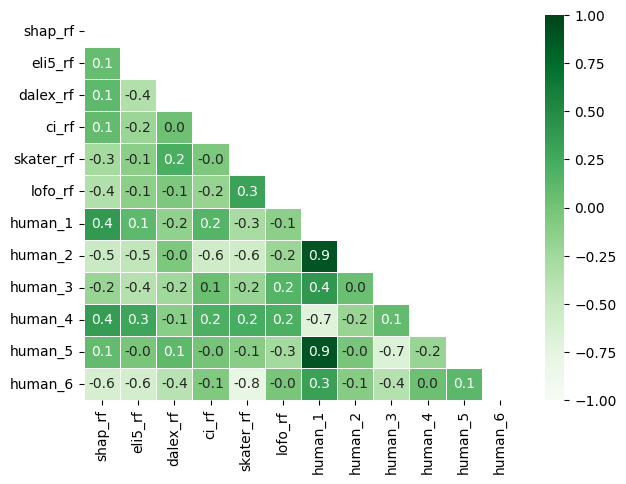

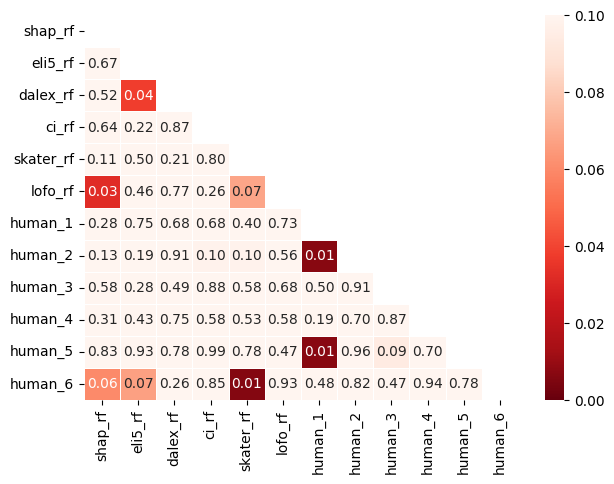

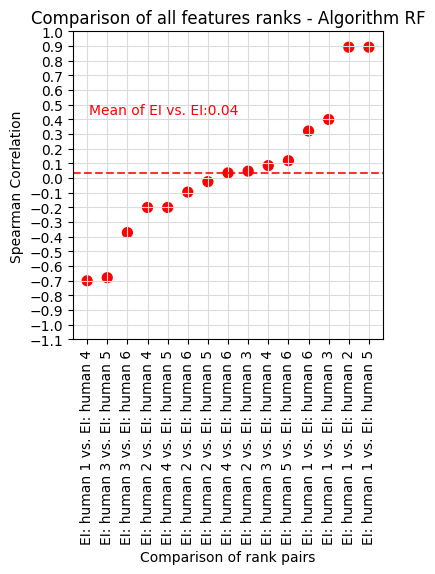

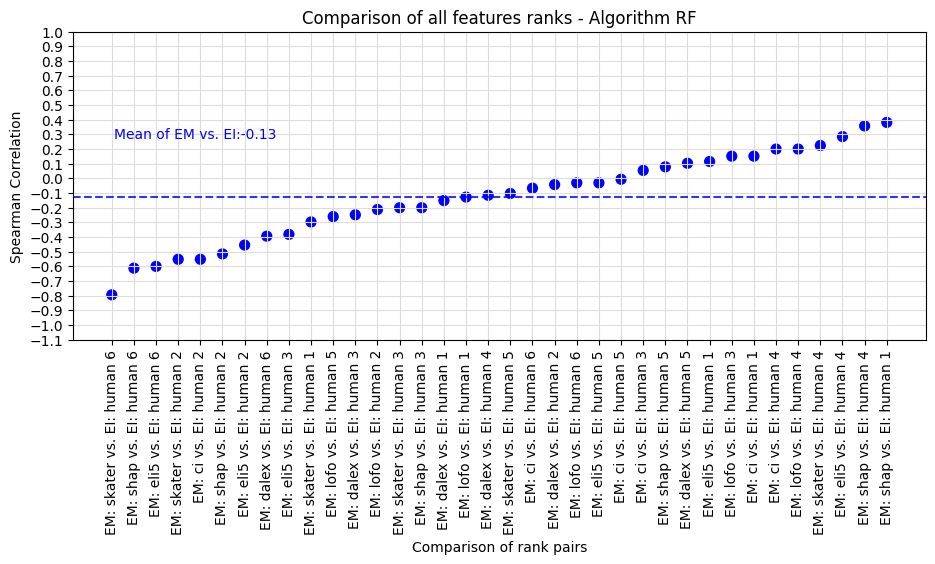

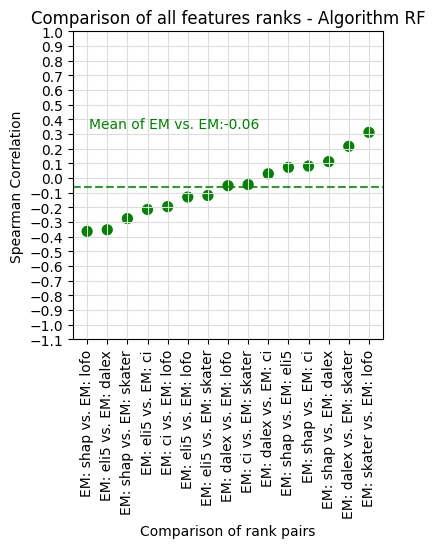

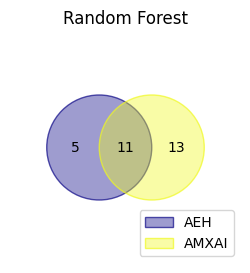

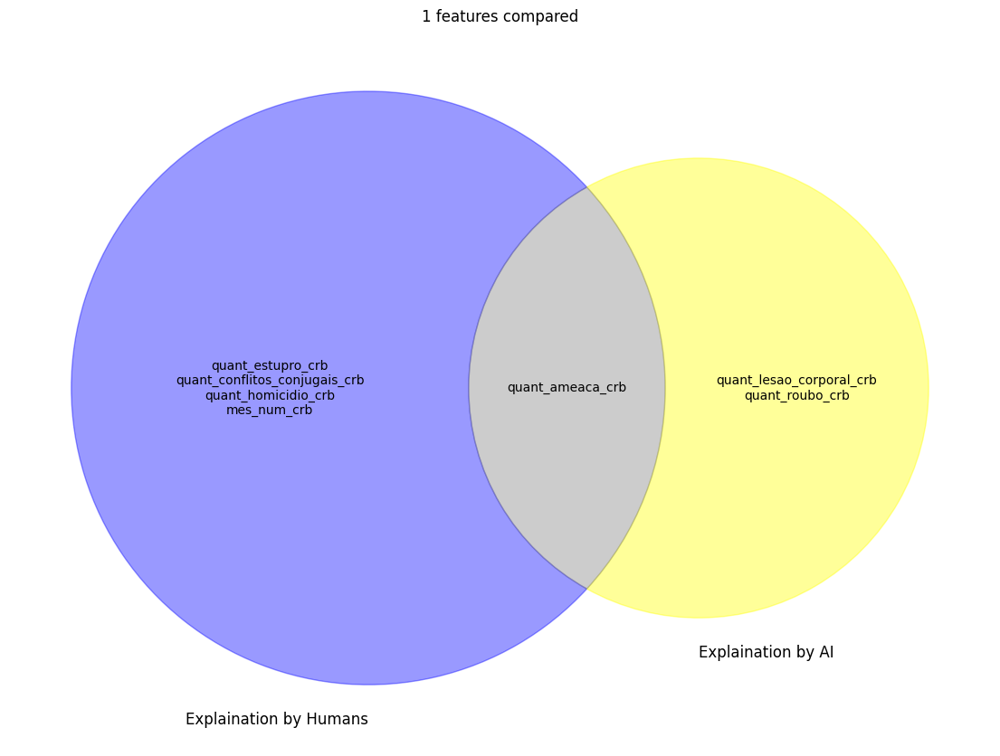

<Figure size 640x480 with 0 Axes>

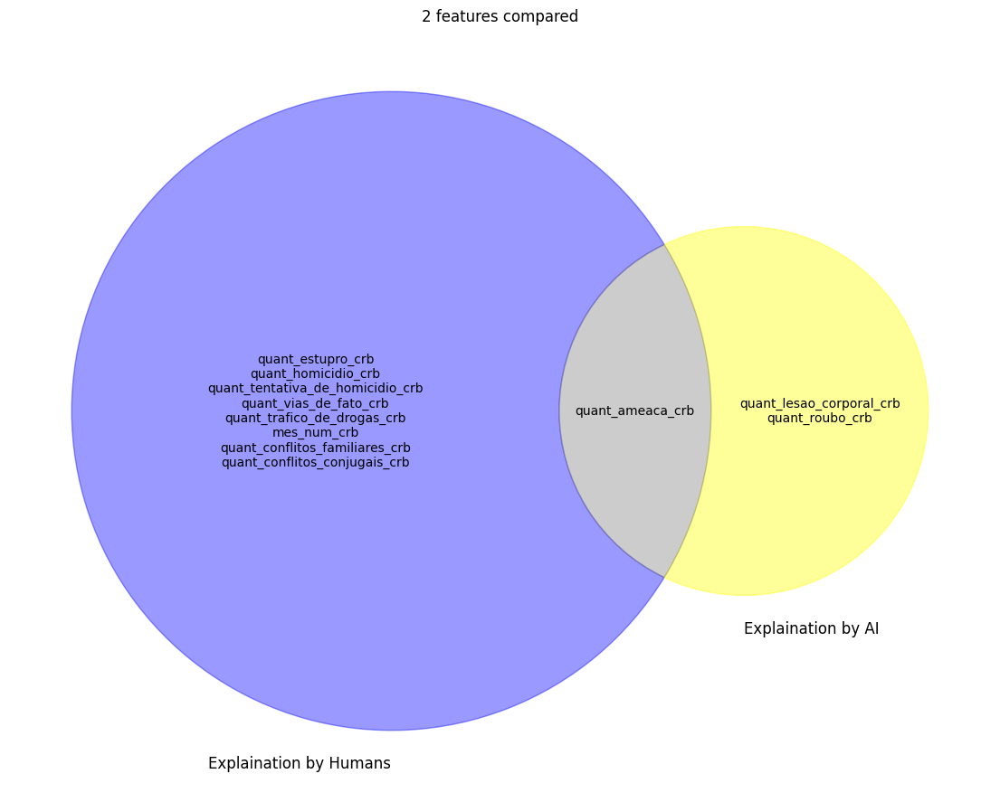

<Figure size 640x480 with 0 Axes>

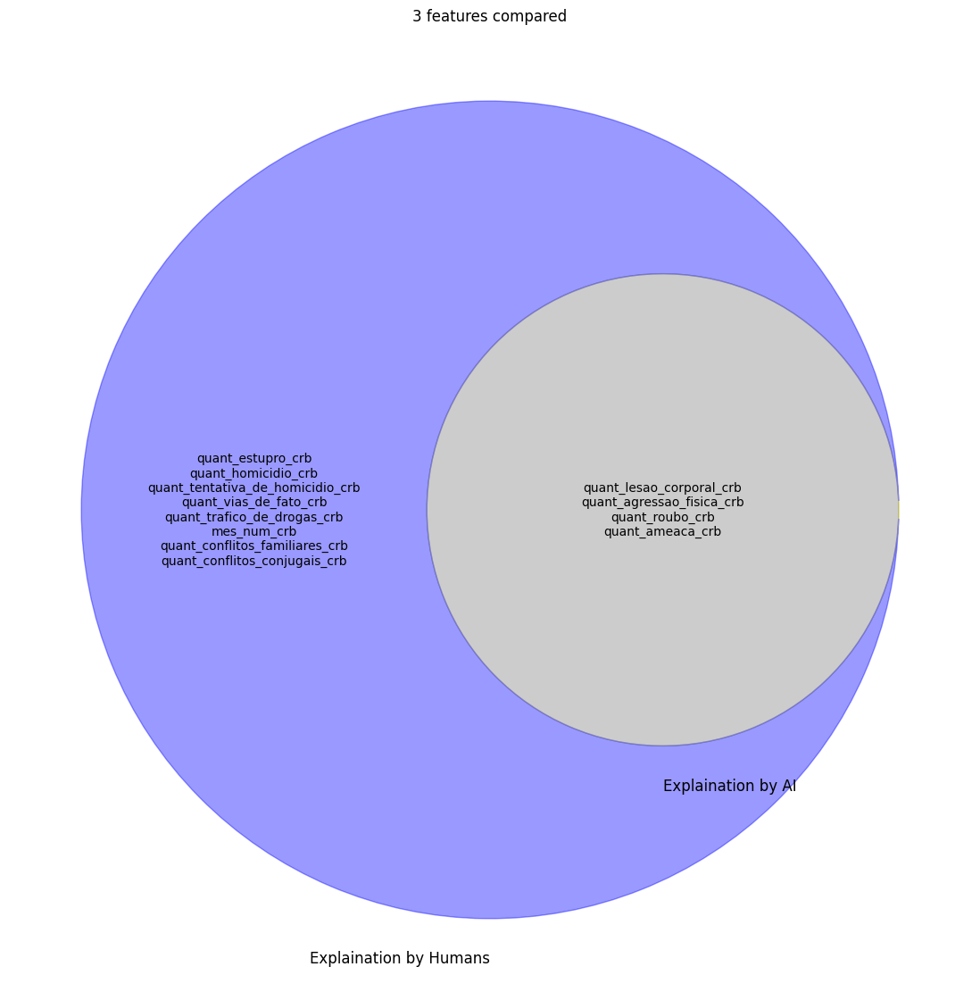

<Figure size 640x480 with 0 Axes>

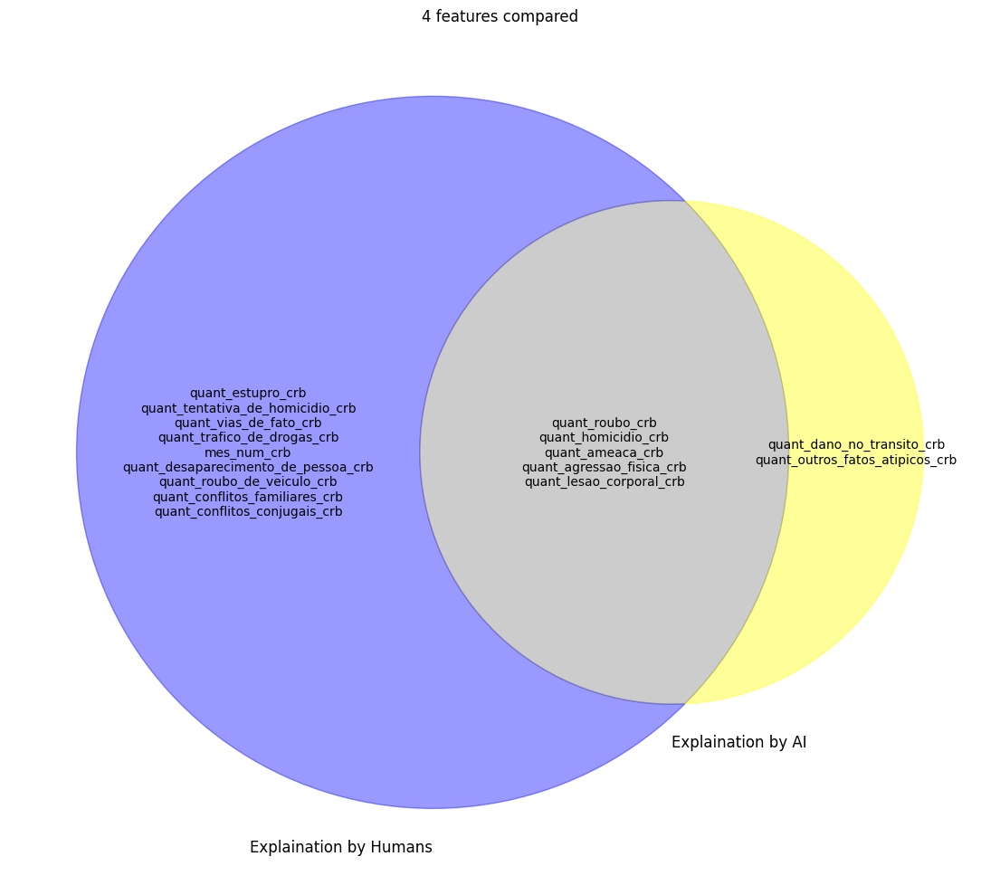

<Figure size 640x480 with 0 Axes>

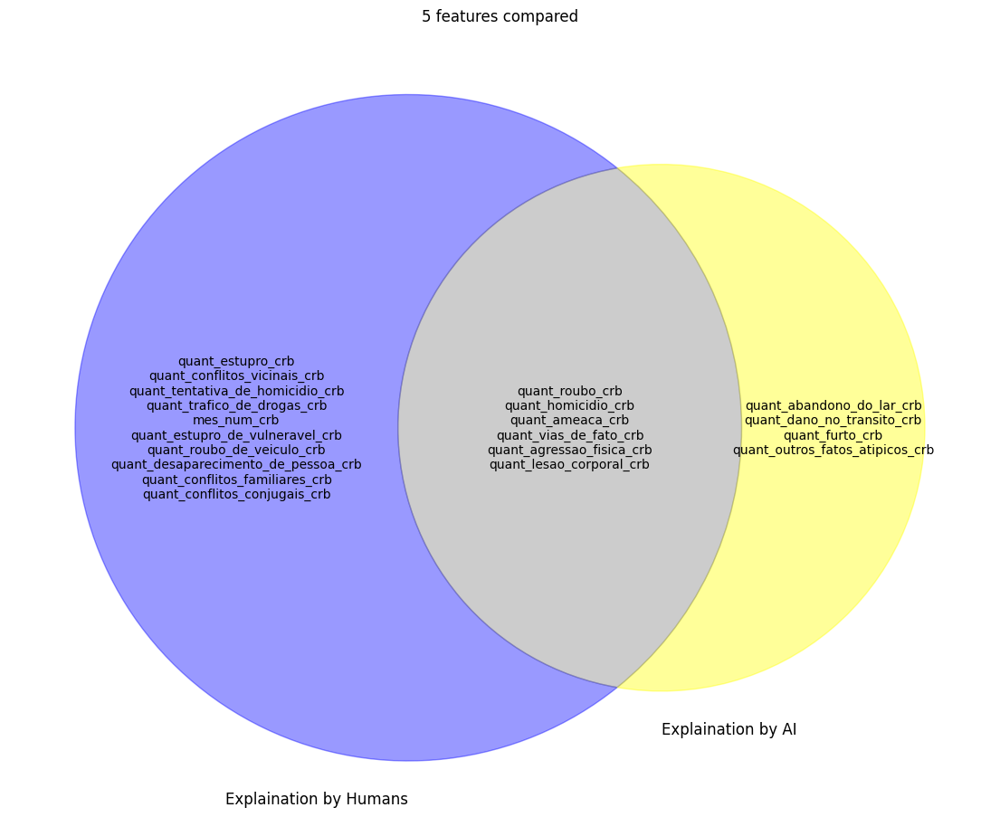

<Figure size 640x480 with 0 Axes>

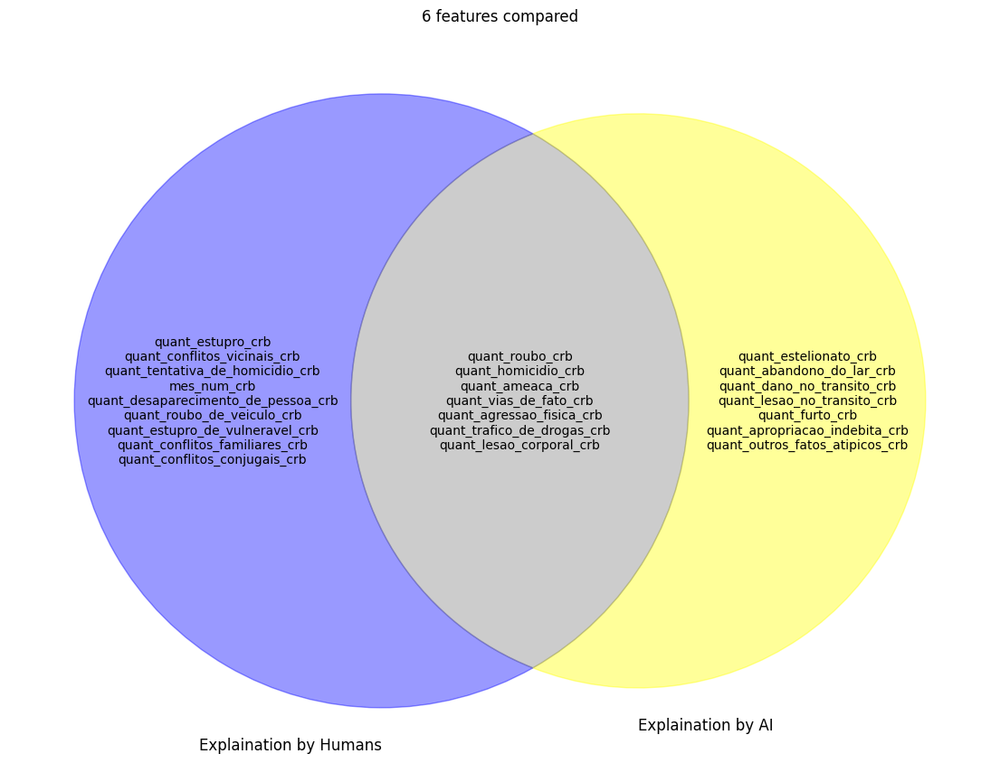

<Figure size 640x480 with 0 Axes>

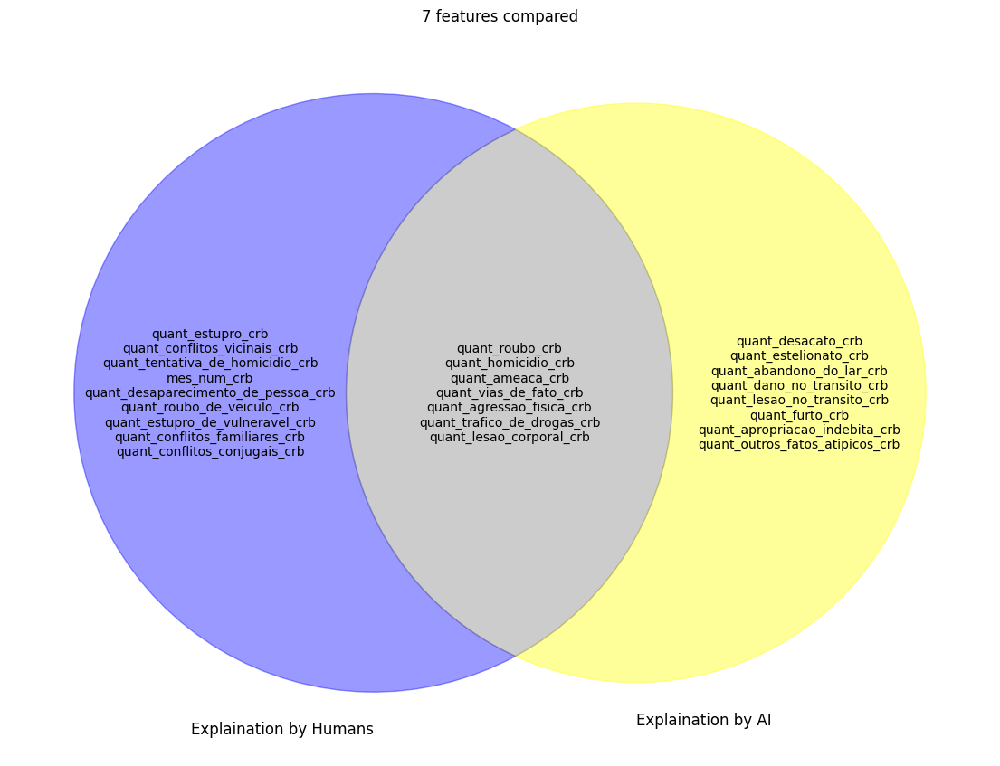

<Figure size 640x480 with 0 Axes>

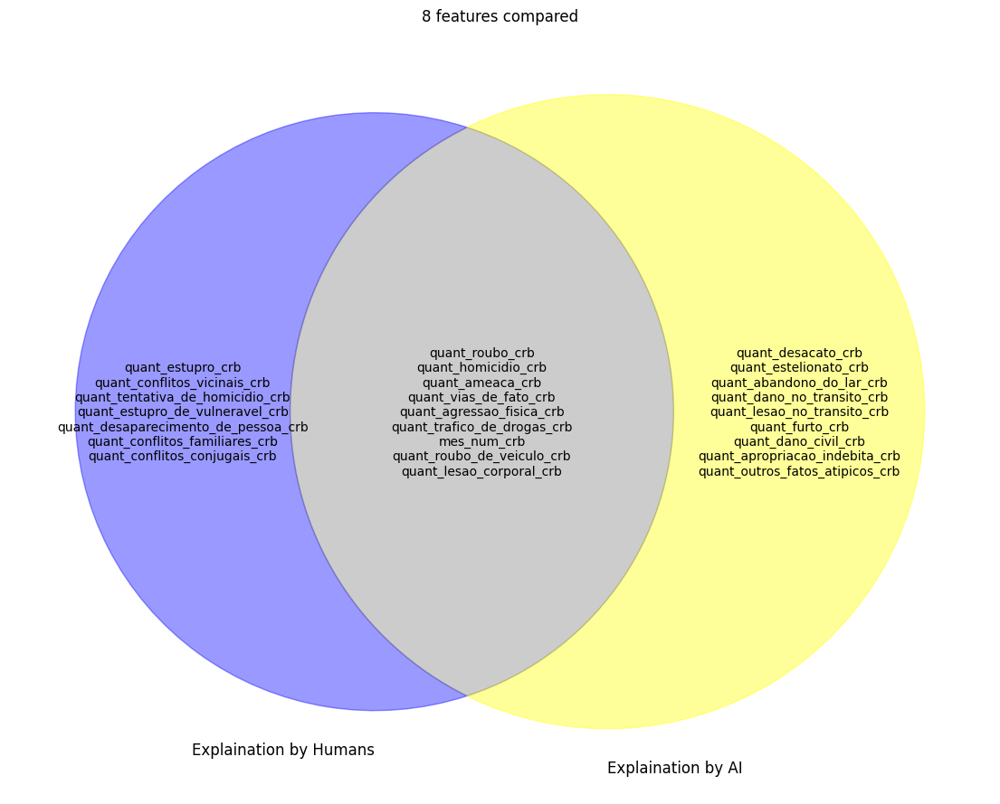

<Figure size 640x480 with 0 Axes>

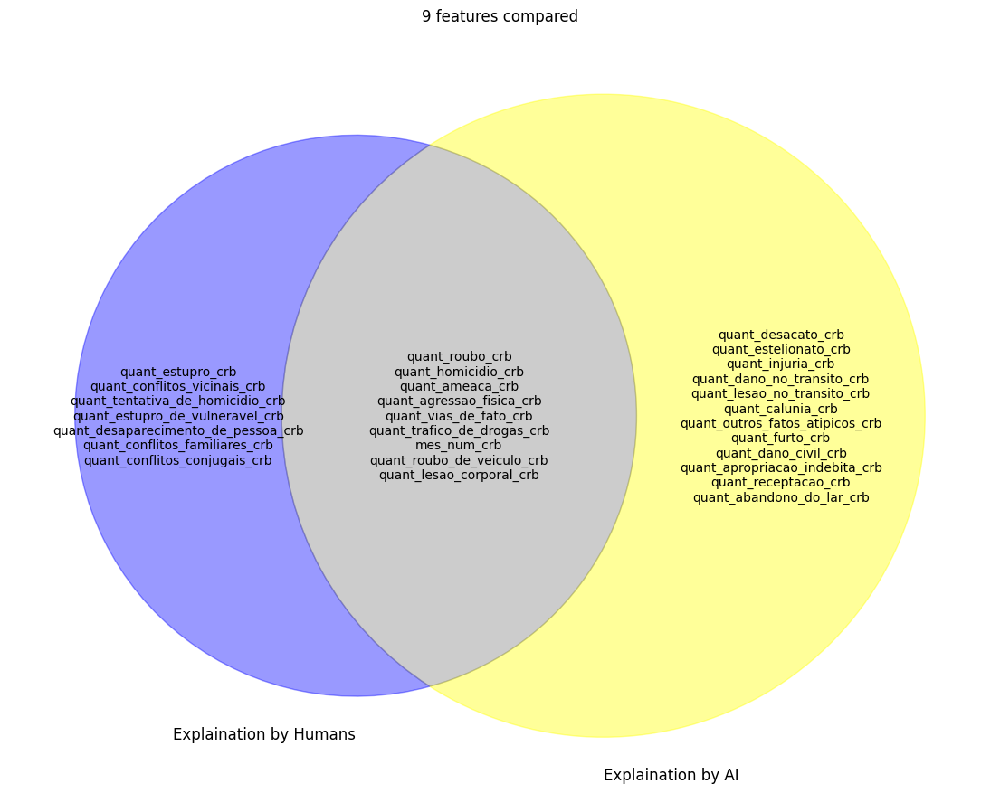

<Figure size 640x480 with 0 Axes>

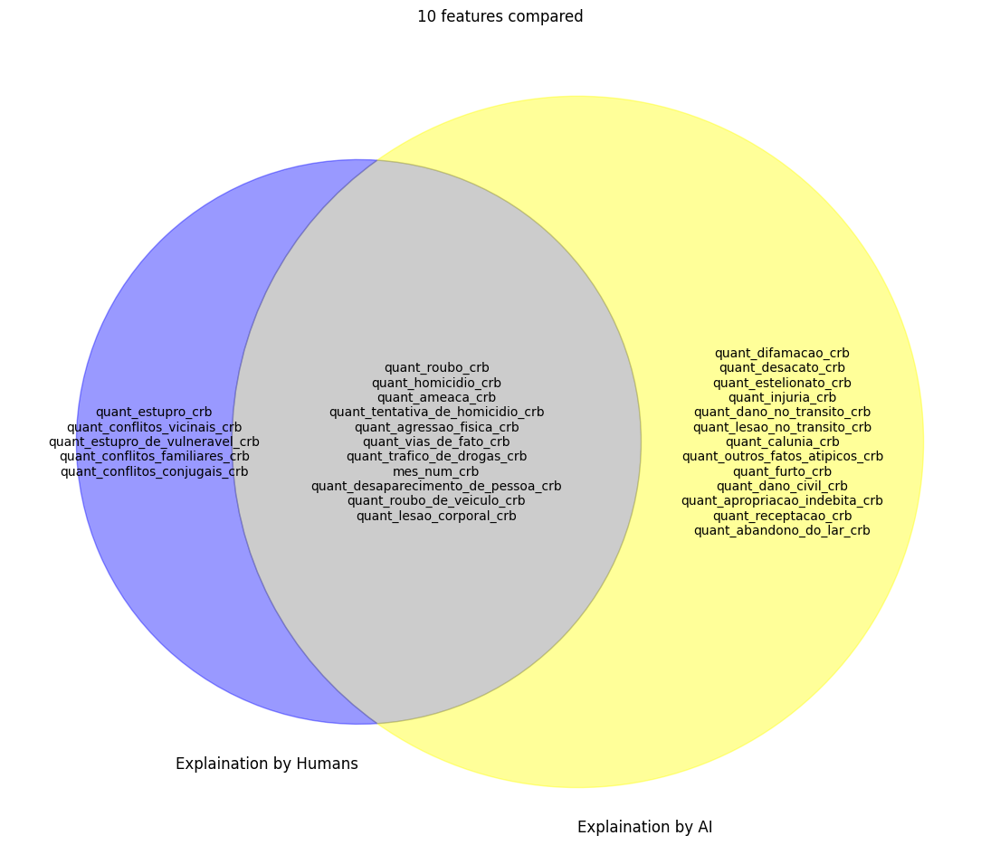




                                            S
att_original_names                           
quant_roubo_crb                          88.0
quant_lesao_corporal_crb                 79.0
quant_ameaca_crb                         78.0
quant_homicidio_crb                      69.0
quant_tentativa_de_homicidio_crb         36.0
quant_trafico_de_drogas_crb              32.0
quant_estupro_crb                        28.0
quant_agressao_fisica_crb                24.0
quant_vias_de_fato_crb                   23.0
quant_dano_no_transito_crb               21.0
quant_outros_fatos_atipicos_crb          18.0
quant_roubo_de_veiculo_crb               18.0
quant_abandono_do_lar_crb                17.0
quant_conflitos_familiares_crb           15.0
quant_desaparecimento_de_pessoa_crb      15.0
quant_conflitos_vicinais_crb             14.0
quant_conflitos_conjugais_crb            14.0
quant_estupro_de_vulneravel_crb          13.0
quant_furto_crb                          13.0
mes_num_crb                    

<Figure size 640x480 with 0 Axes>

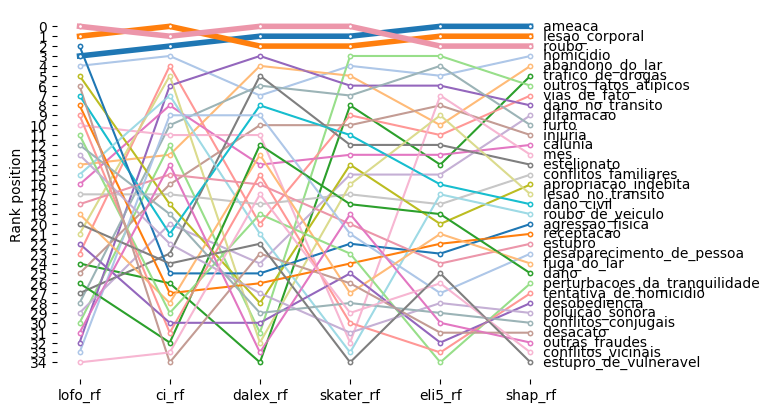

In [ ]:
# Main execution
fold=0
top_n_features = 10

X_train, X_test, y_train, y_test = Util.train_test_split_by_stratified_k_fold(fold,X, Y, skf) # 4 folds index 0,1,2,3
df_feature_rank, model_rf, df_models_info = calcRanks(X_train, X_test, y_train, y_test, X, Y, fold)

main_analysis_by_top(top_n_features)
Util.plotVenn(df_feature_rank,fold)
Util.plotVenns(df_feature_rank,fold)
#Util.plotFeatureImportance(model_rf)
Util.saveFigs(df_models_info,fold)

# ConeXi execution
df_features_rank_copy = df_feature_rank.copy()
df_features_rank_copy['weights'] = 1
c = combine.ConeXi(top_n_features)
rank_final, data = c.ExecuteConeXi(df_features_rank_copy)
print(rank_final)
print()
print(data)
# Bump Chart
df_features_rank_copy = df_features_rank_copy.drop(columns=['weights'])
Util.plotBumpChart(df_features_rank_copy,fold)
data.to_csv('rank_intermediante_conexi_fold'+str(fold)+'_.csv')
rank_final.to_csv('rank_final_conexi_fold'+str(fold)+'_.csv')
df_features_rank_copy.to_csv('df_features_rank_fold'+str(fold)+'_.csv')

### Fold 2

Fold selected 1:
     mes_num_crb  quant_lesao_corporal_crb  quant_ameaca_crb  quant_roubo_crb  \
0       0.000000                  0.000000          0.048193         0.002433   
1       0.000000                  0.081633          0.084337         0.124088   
2       0.000000                  0.000000          0.132530         0.063260   
3       0.000000                  0.183673          0.168675         0.141119   
4       0.000000                  0.040816          0.012048         0.017032   
..           ...                       ...               ...              ...   
133     0.090909                  0.122449          0.240964         0.197080   
134     0.090909                  0.102041          0.024096         0.099757   
135     0.090909                  0.367347          0.385542         0.635036   
136     0.090909                  0.163265          0.204819         0.484185   
137     0.090909                  0.000000          0.012048         0.002433   

     quant

  0%|          | 0/35 [00:00<?, ?it/s]

Explanation by Human 1....
Explanation by Human 2....
Explanation by Human 3....
Explanation by Human 4....
Explanation by Human 5....
Explanation by Human 6....


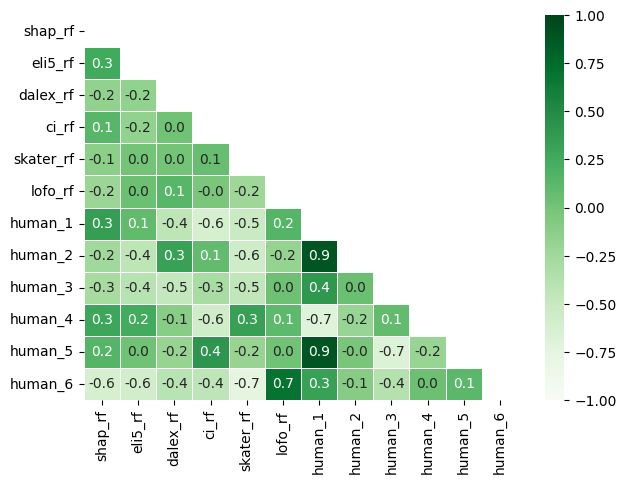

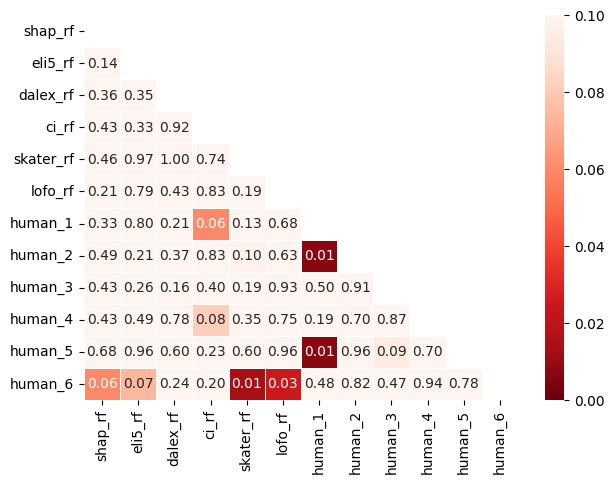

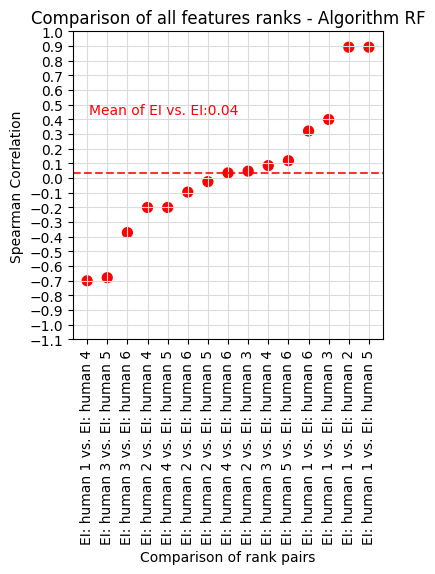

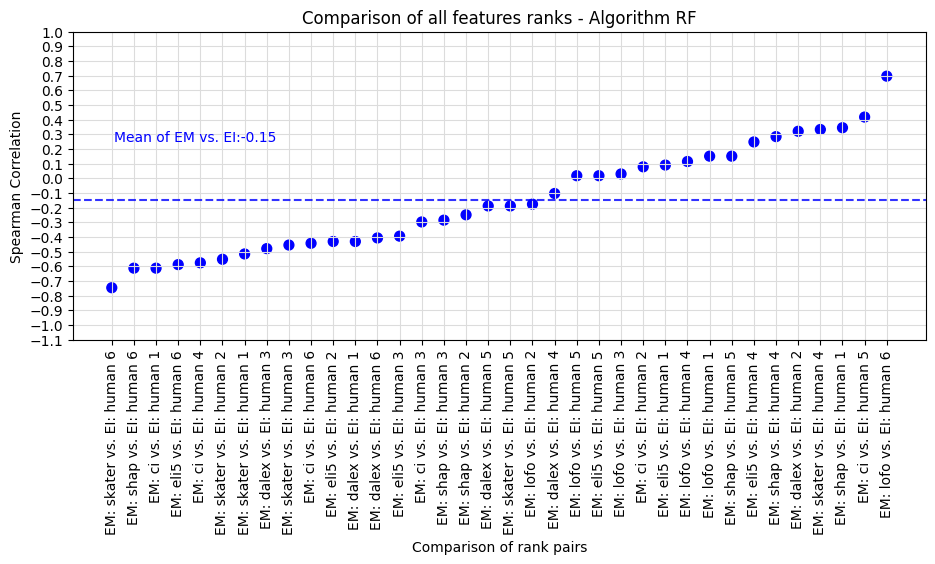

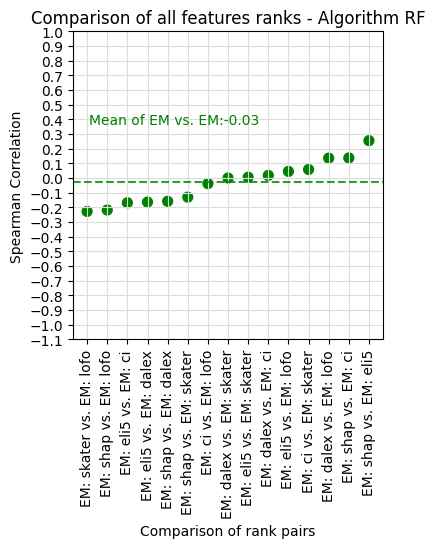

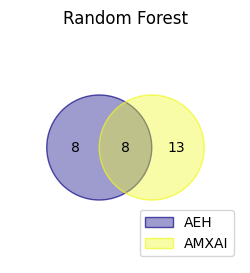

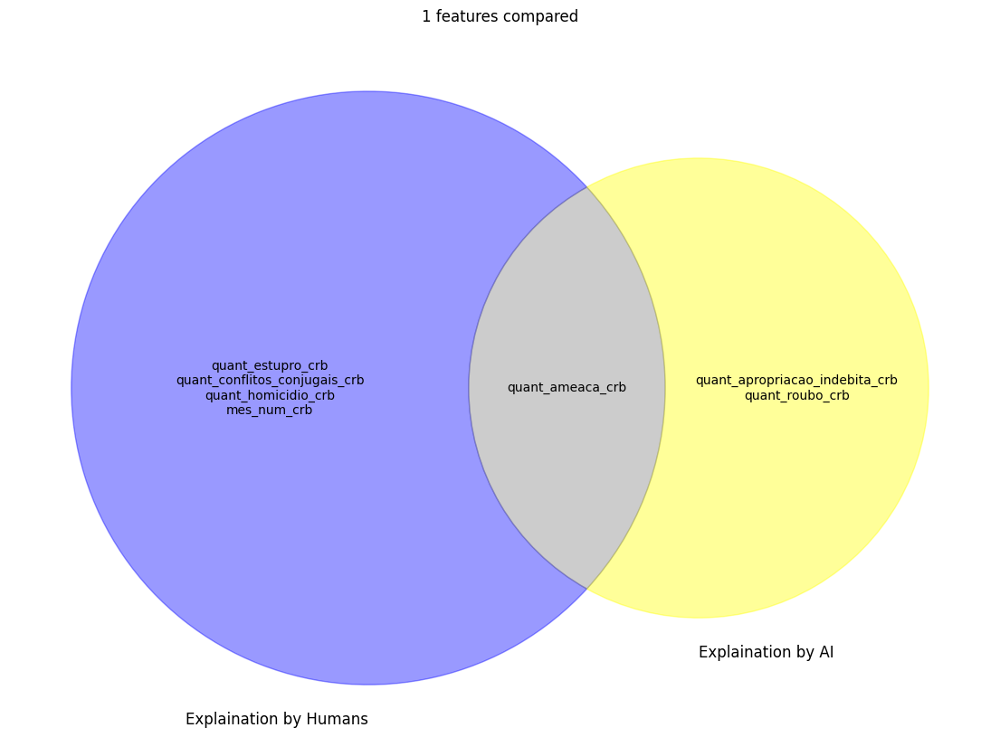

<Figure size 700x800 with 0 Axes>

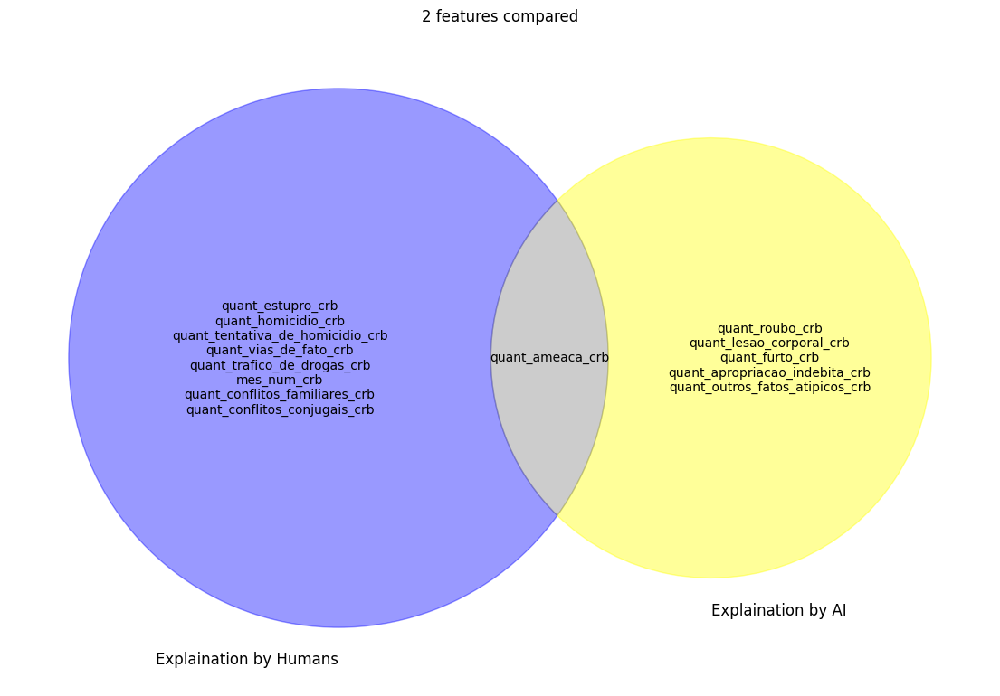

<Figure size 700x800 with 0 Axes>

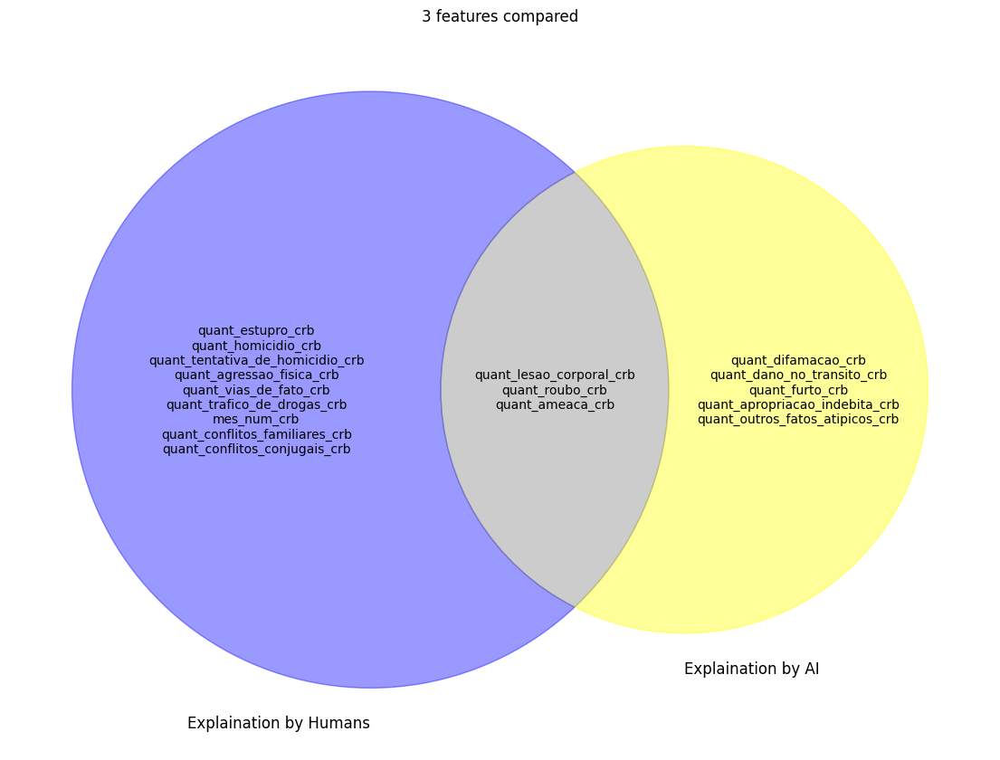

<Figure size 700x800 with 0 Axes>

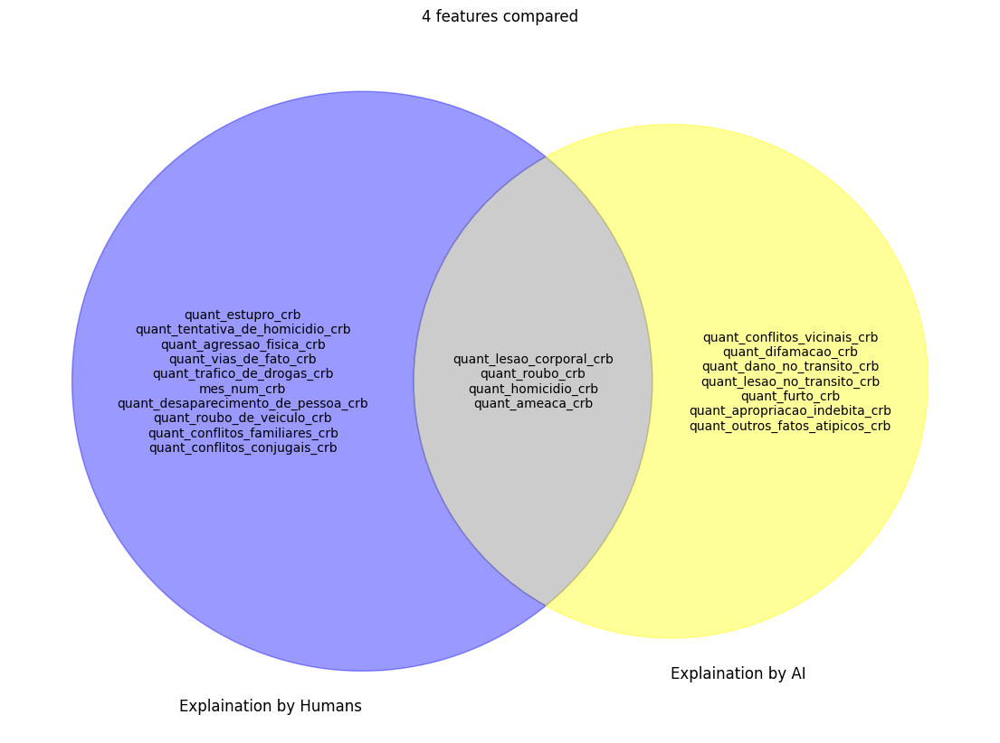

<Figure size 700x800 with 0 Axes>

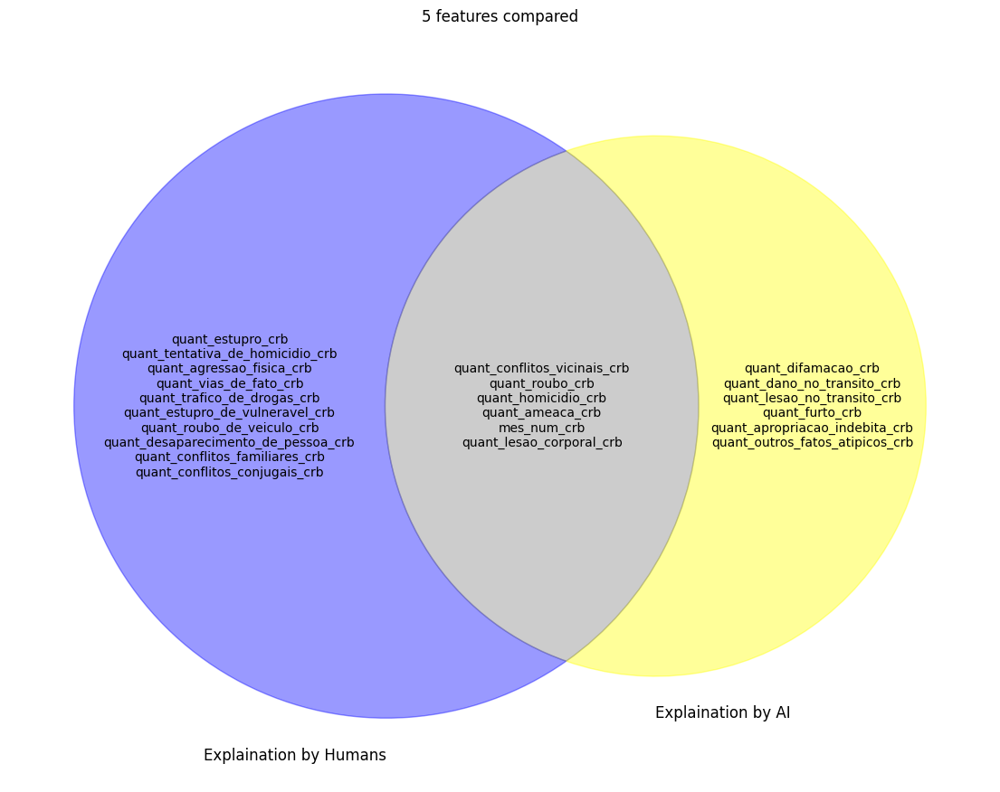

<Figure size 700x800 with 0 Axes>

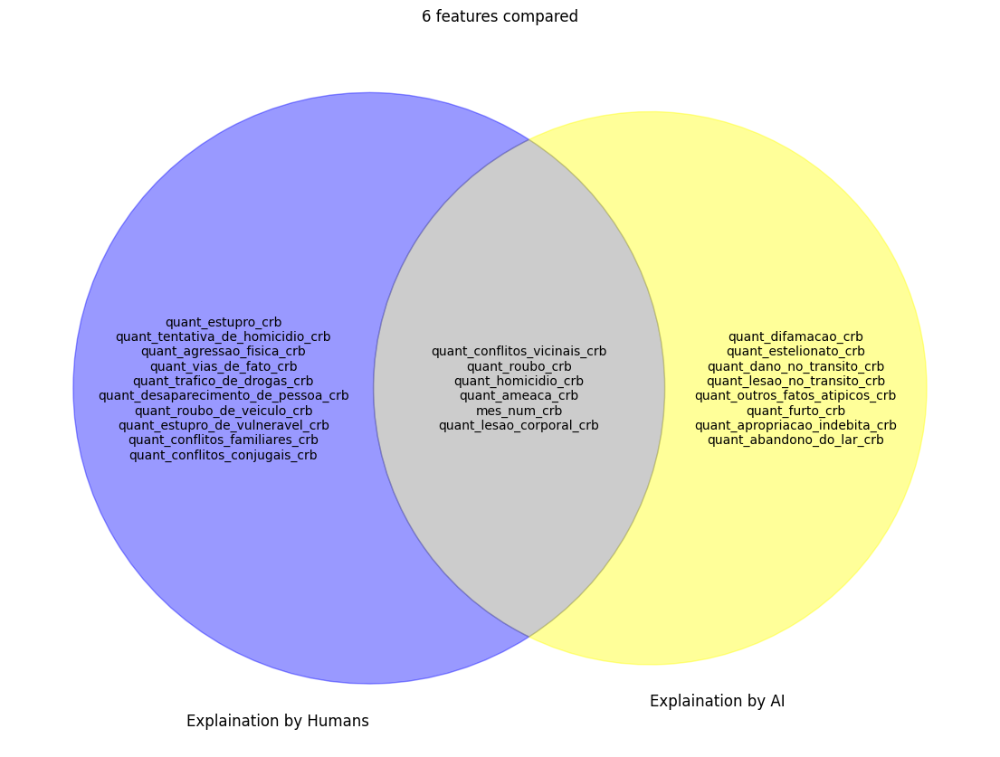

<Figure size 700x800 with 0 Axes>

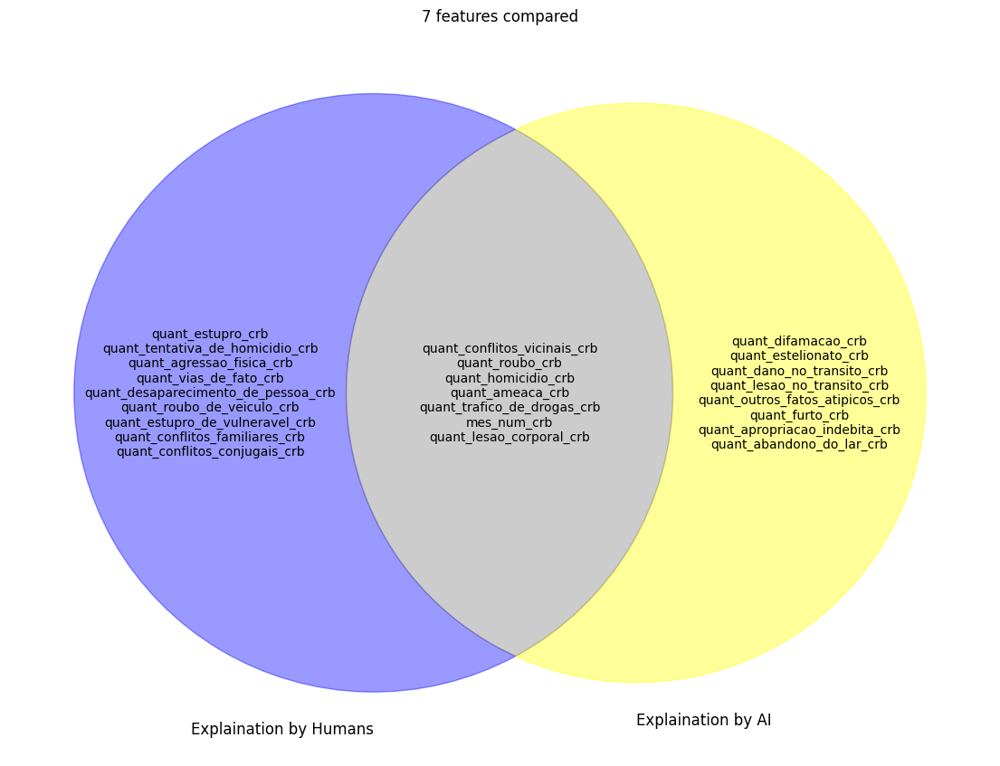

<Figure size 700x800 with 0 Axes>

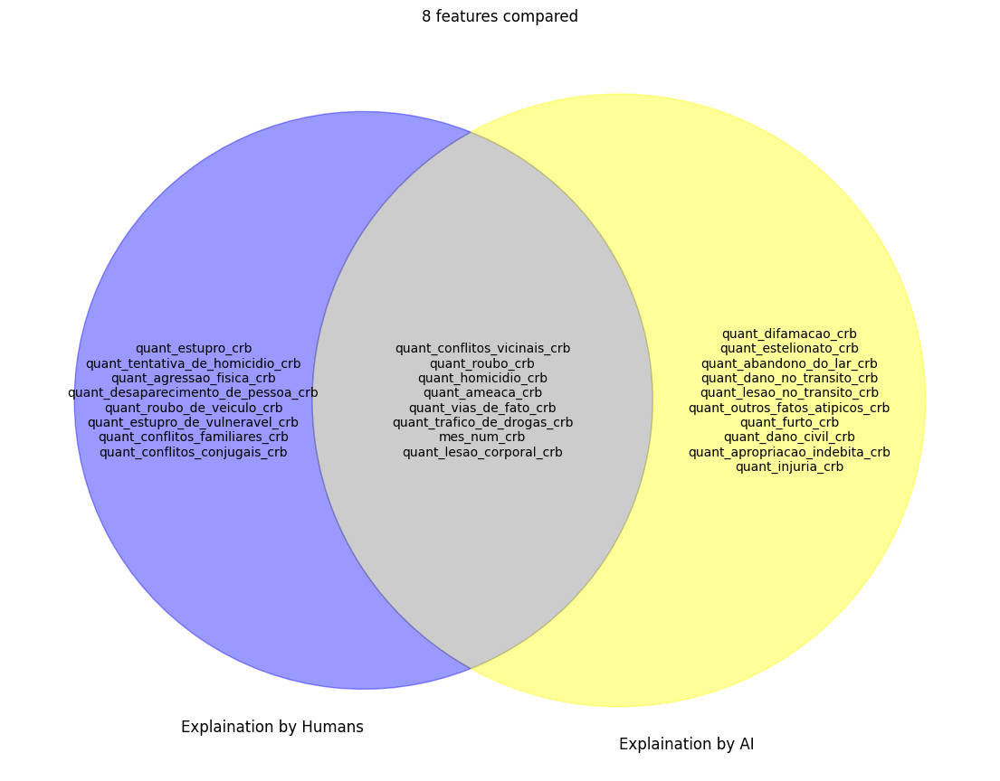

<Figure size 700x800 with 0 Axes>

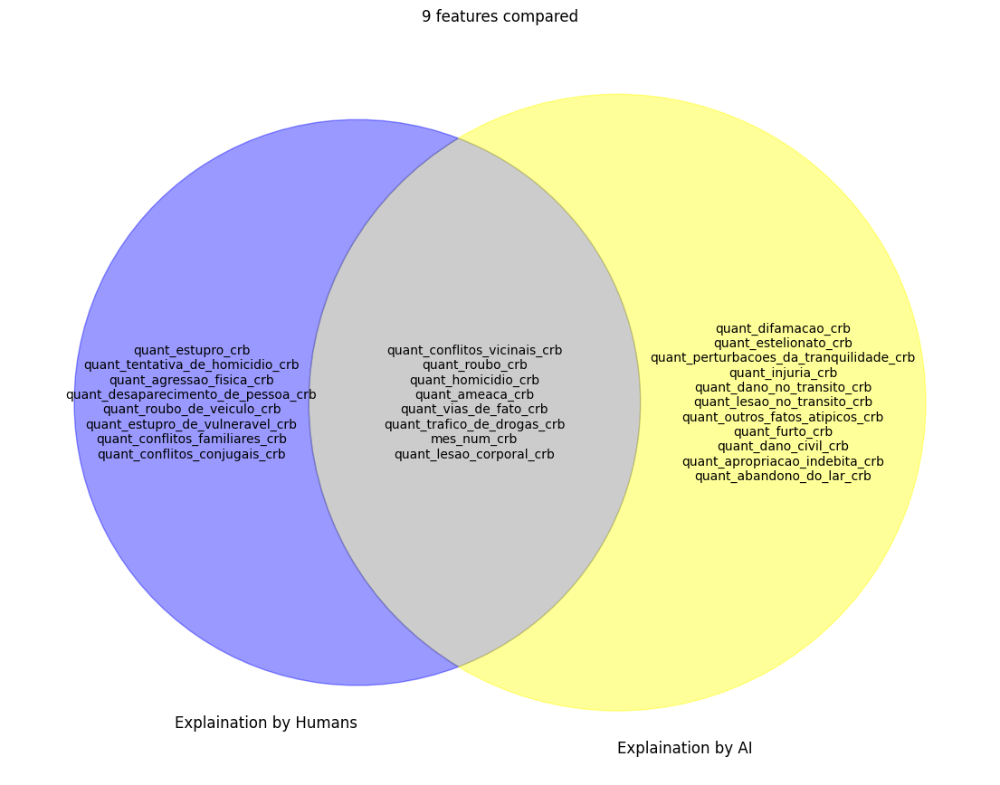

<Figure size 700x800 with 0 Axes>

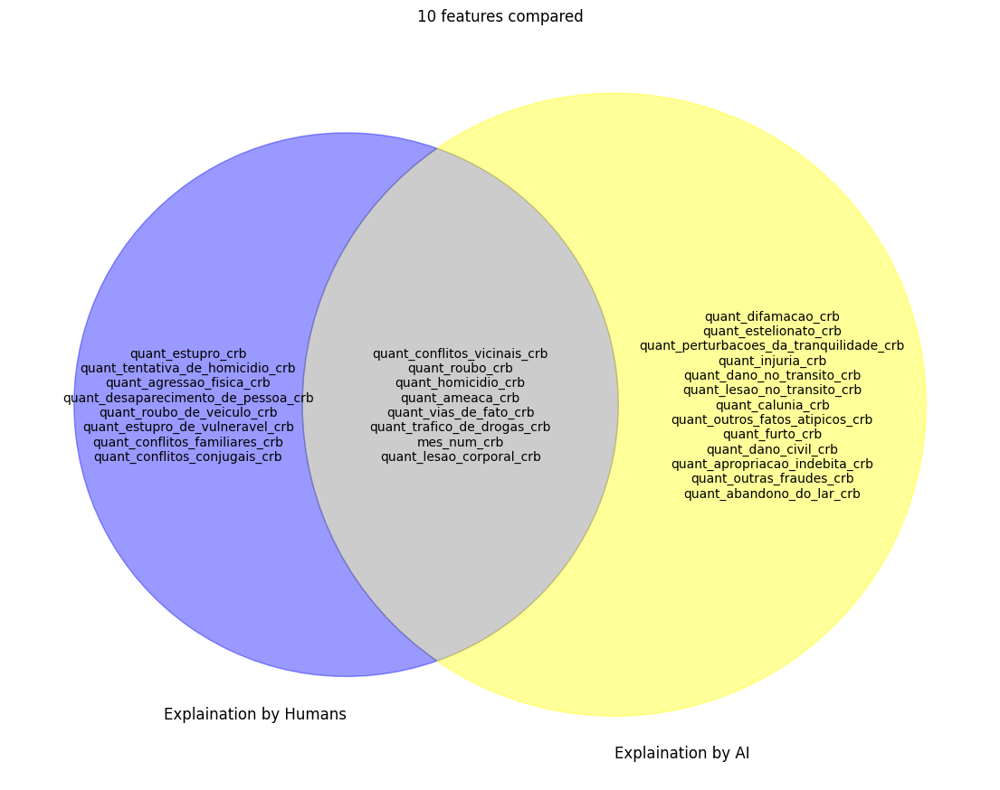




                                            S
att_original_names                           
quant_roubo_crb                          83.0
quant_lesao_corporal_crb                 68.0
quant_homicidio_crb                      67.0
quant_ameaca_crb                         64.0
quant_trafico_de_drogas_crb              36.0
quant_outros_fatos_atipicos_crb          36.0
quant_tentativa_de_homicidio_crb         35.0
quant_estupro_crb                        28.0
quant_dano_no_transito_crb               23.0
quant_furto_crb                          22.0
quant_conflitos_vicinais_crb             21.0
quant_vias_de_fato_crb                   18.0
mes_num_crb                              18.0
quant_agressao_fisica_crb                16.0
quant_roubo_de_veiculo_crb               15.0
quant_conflitos_familiares_crb           15.0
quant_conflitos_conjugais_crb            14.0
quant_desaparecimento_de_pessoa_crb      13.0
quant_estupro_de_vulneravel_crb          13.0
quant_abandono_do_lar_crb      

<Figure size 700x800 with 0 Axes>

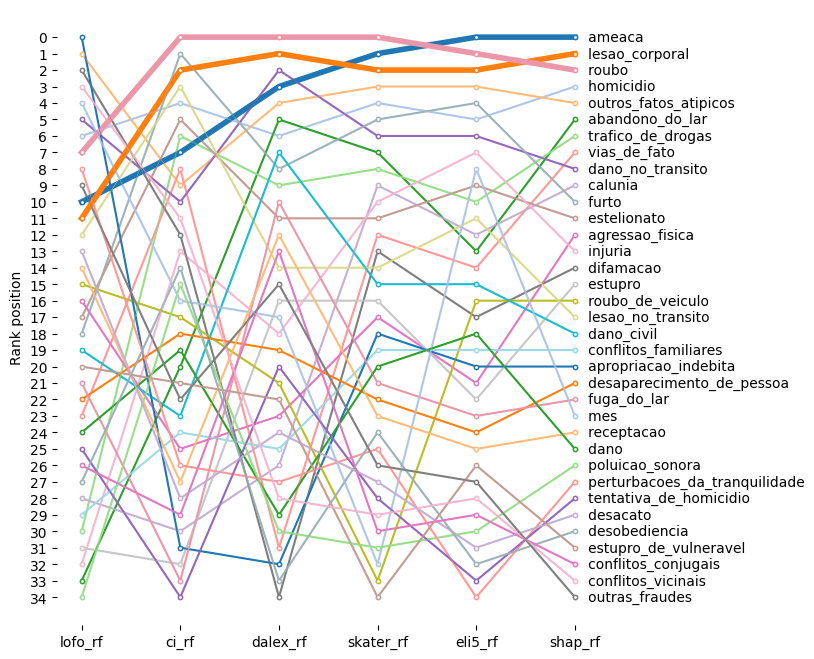

In [ ]:
# Main execution
fold=1
top_n_features = 10

X_train, X_test, y_train, y_test = Util.train_test_split_by_stratified_k_fold(fold,X, Y, skf) # 4 folds index 0,1,2,3
df_feature_rank, model_rf, df_models_info = calcRanks(X_train, X_test, y_train, y_test, X, Y, fold)

main_analysis_by_top(top_n_features)
Util.plotVenn(df_feature_rank,fold)
Util.plotVenns(df_feature_rank,fold)
#Util.plotFeatureImportance(model_rf)
Util.saveFigs(df_models_info,fold)

# ConeXi execution
df_features_rank_copy = df_feature_rank.copy()
df_features_rank_copy['weights'] = 1
c = combine.ConeXi(top_n_features)
rank_final, data = c.ExecuteConeXi(df_features_rank_copy)
print(rank_final)
print()
print(data)
# Bump Chart
df_features_rank_copy = df_features_rank_copy.drop(columns=['weights'])
Util.plotBumpChart(df_features_rank_copy,fold)
data.to_csv('rank_intermediante_conexi_fold'+str(fold)+'_.csv')
rank_final.to_csv('rank_final_conexi_fold'+str(fold)+'_.csv')
df_features_rank_copy.to_csv('df_features_rank_fold'+str(fold)+'_.csv')

### Fold 3

Fold selected 2:
     mes_num_crb  quant_lesao_corporal_crb  quant_ameaca_crb  quant_roubo_crb  \
0       0.000000                  0.000000          0.048193         0.002433   
1       0.000000                  0.081633          0.084337         0.124088   
2       0.000000                  0.000000          0.132530         0.063260   
3       0.000000                  0.183673          0.168675         0.141119   
4       0.000000                  0.040816          0.012048         0.017032   
..           ...                       ...               ...              ...   
133     0.090909                  0.122449          0.240964         0.197080   
134     0.090909                  0.102041          0.024096         0.099757   
135     0.090909                  0.367347          0.385542         0.635036   
136     0.090909                  0.163265          0.204819         0.484185   
137     0.090909                  0.000000          0.012048         0.002433   

     quant

  0%|          | 0/35 [00:00<?, ?it/s]

Explanation by Human 1....
Explanation by Human 2....
Explanation by Human 3....
Explanation by Human 4....
Explanation by Human 5....
Explanation by Human 6....


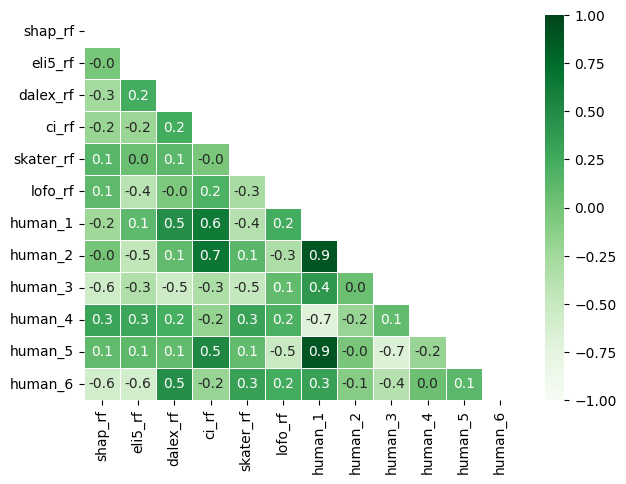

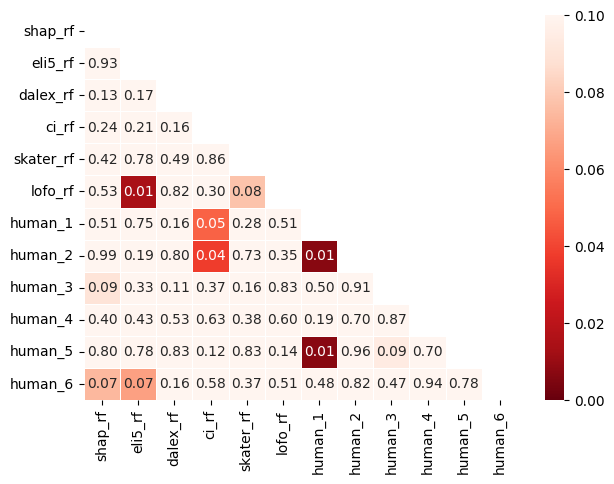

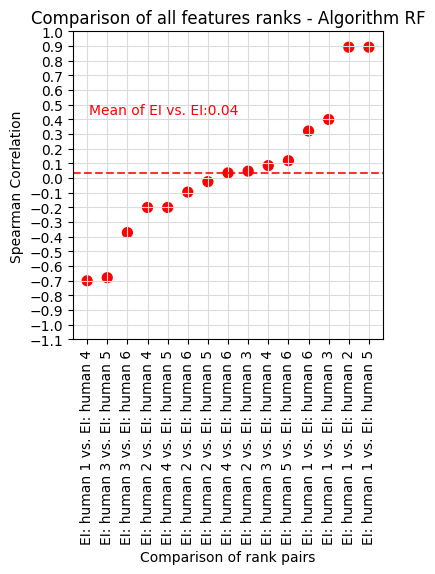

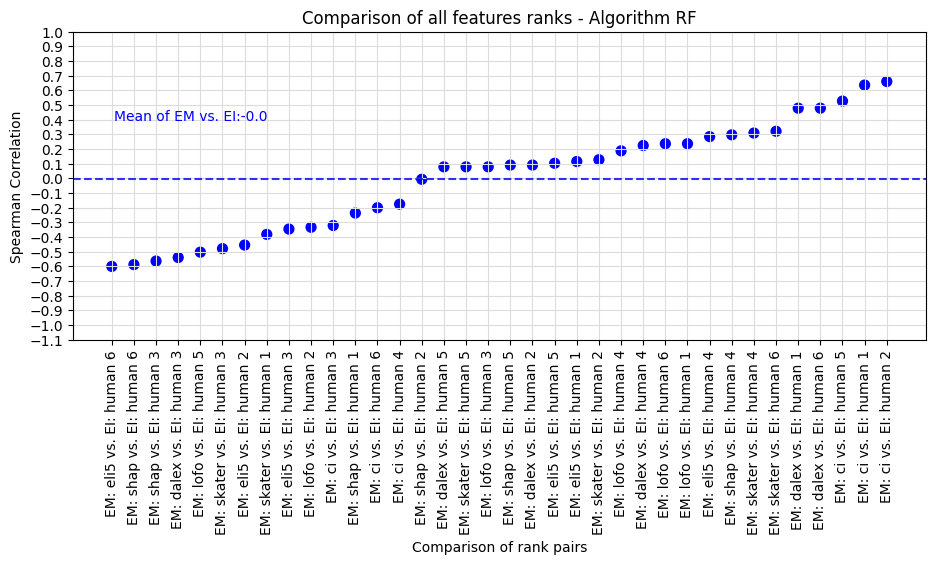

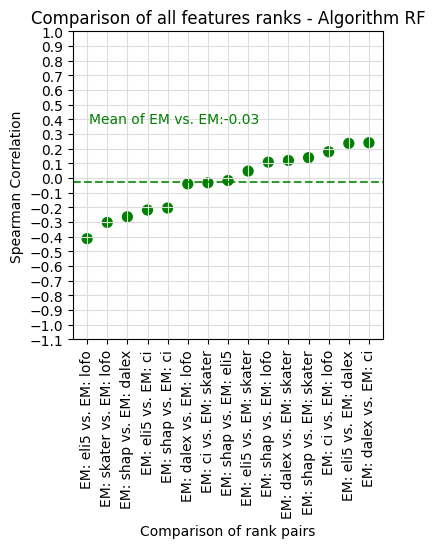

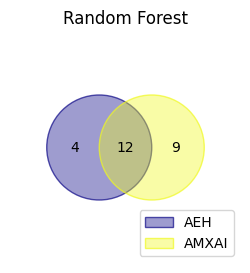

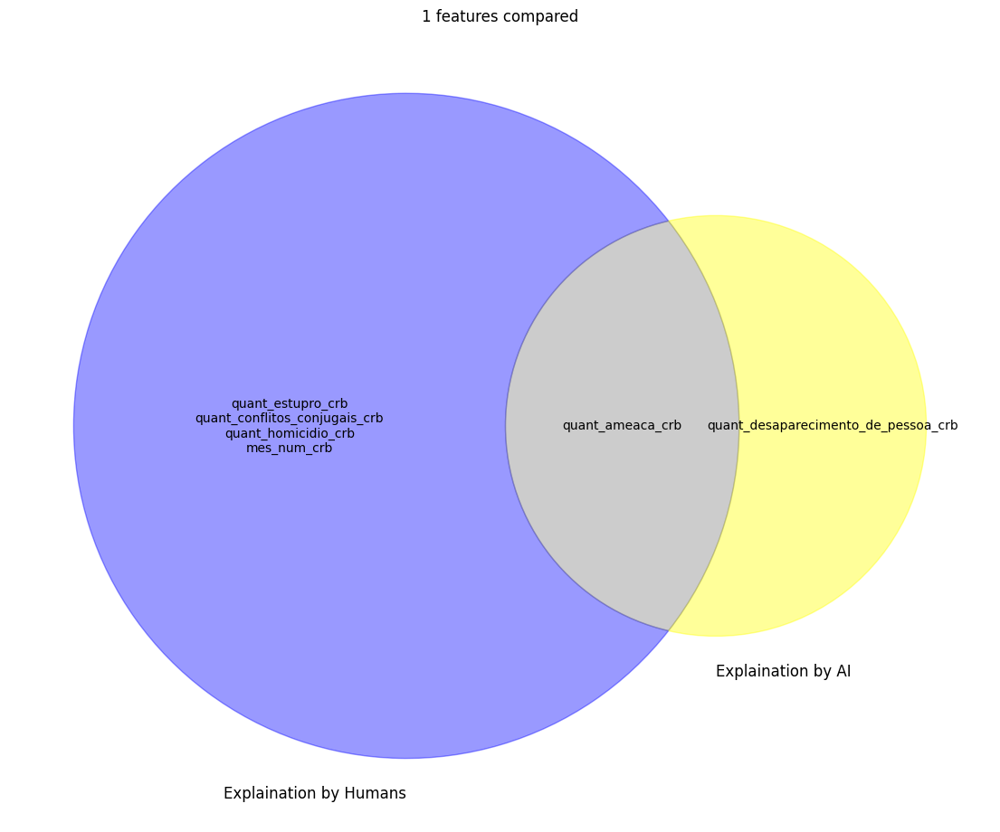

<Figure size 700x800 with 0 Axes>

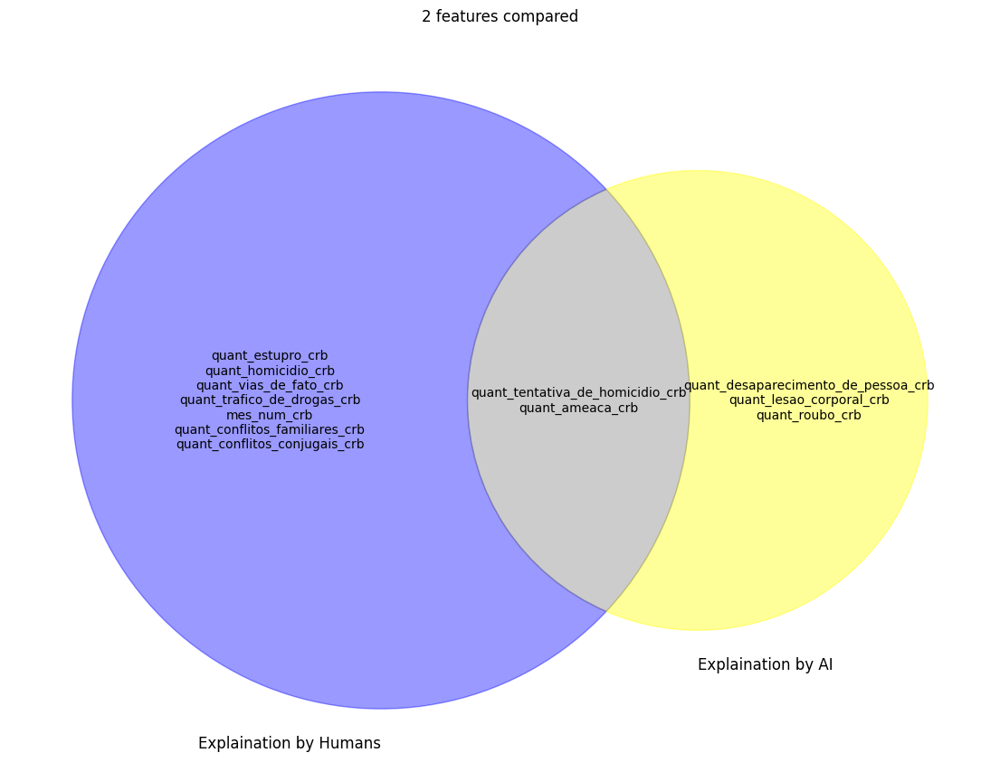

<Figure size 700x800 with 0 Axes>

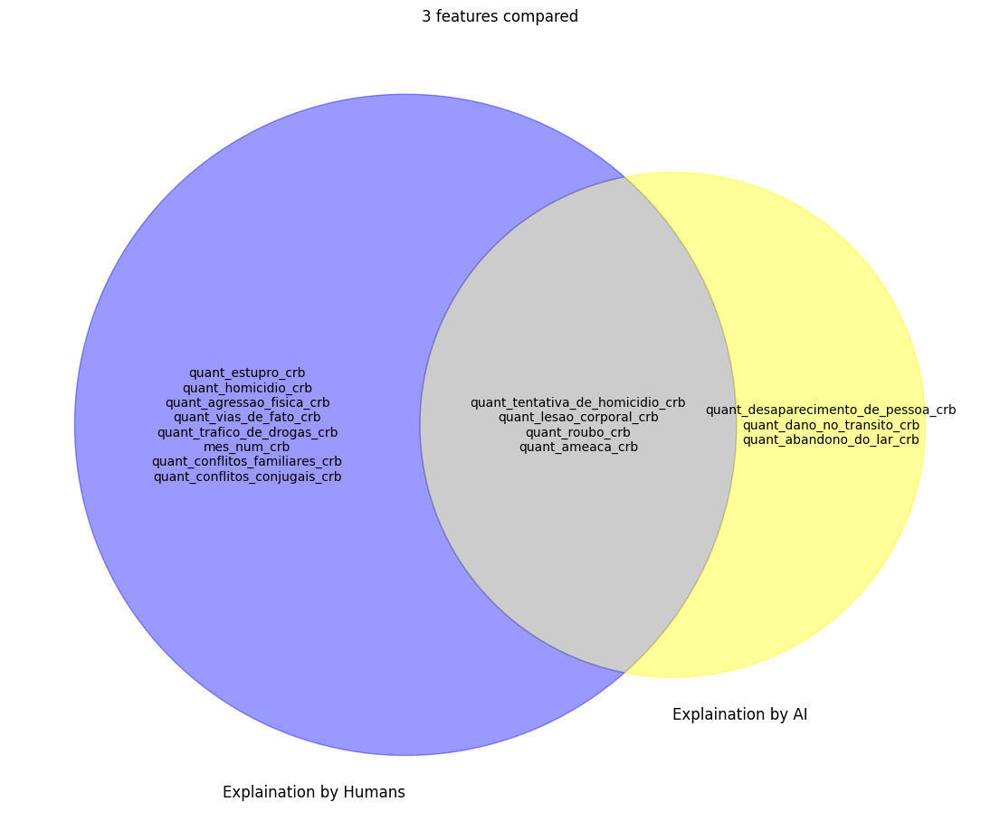

<Figure size 700x800 with 0 Axes>

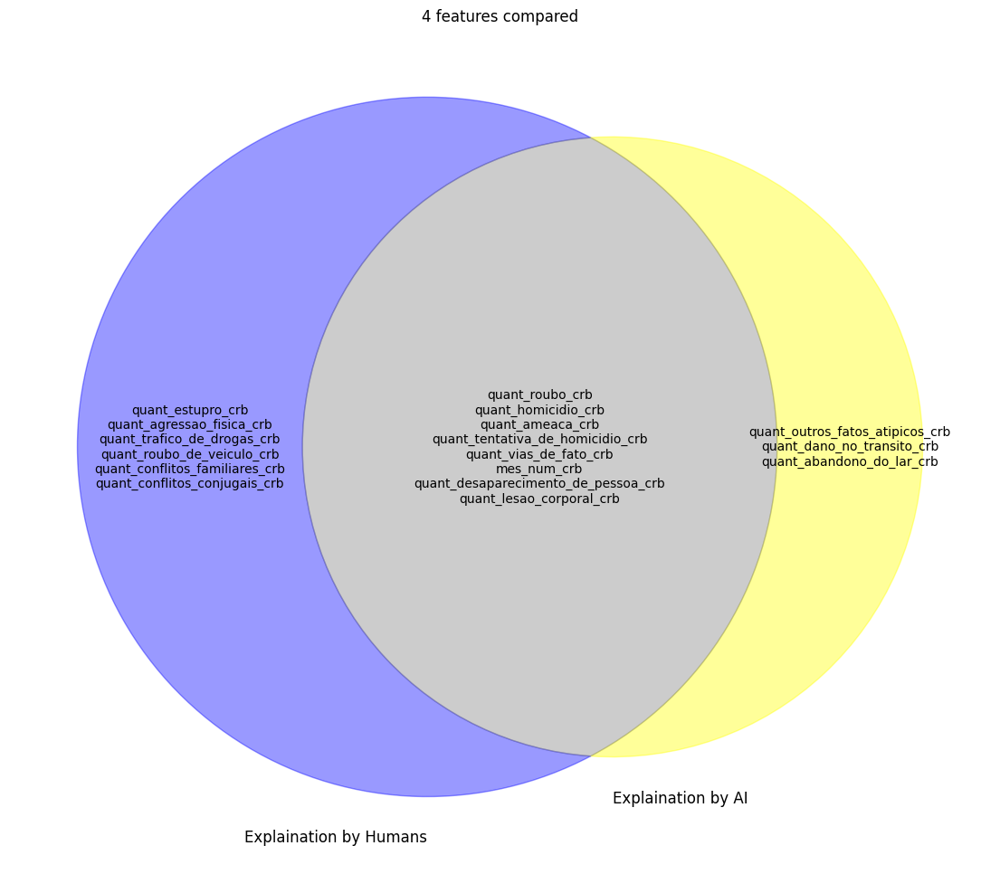

<Figure size 700x800 with 0 Axes>

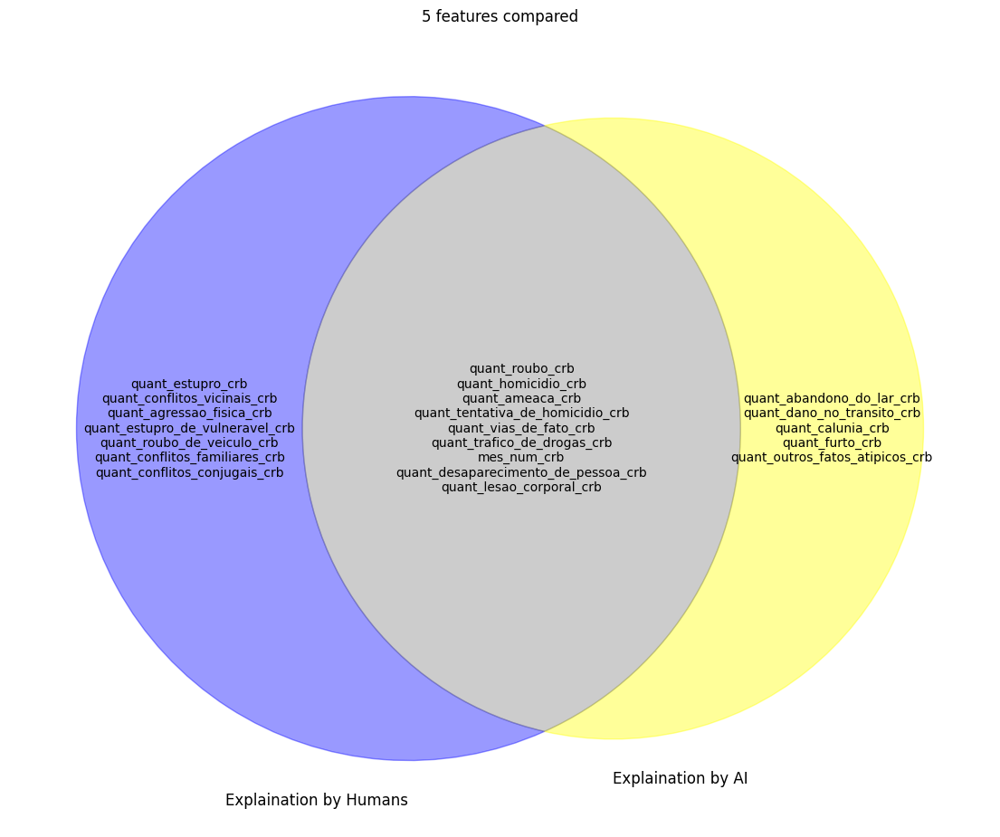

<Figure size 700x800 with 0 Axes>

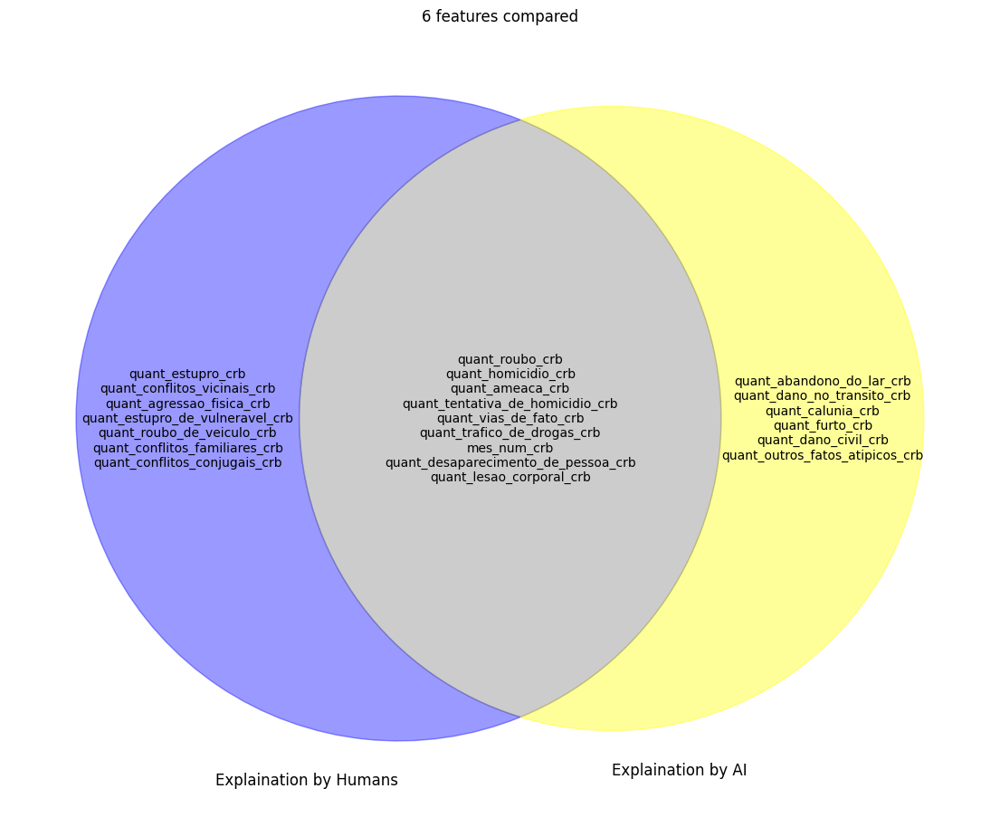

<Figure size 700x800 with 0 Axes>

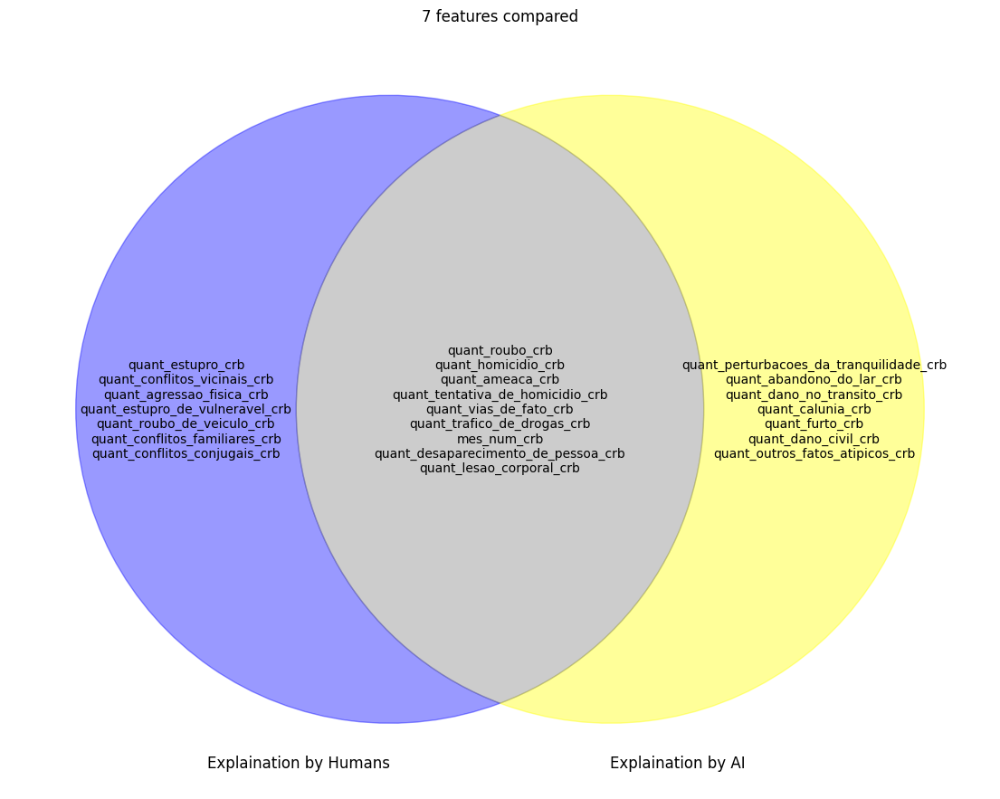

<Figure size 700x800 with 0 Axes>

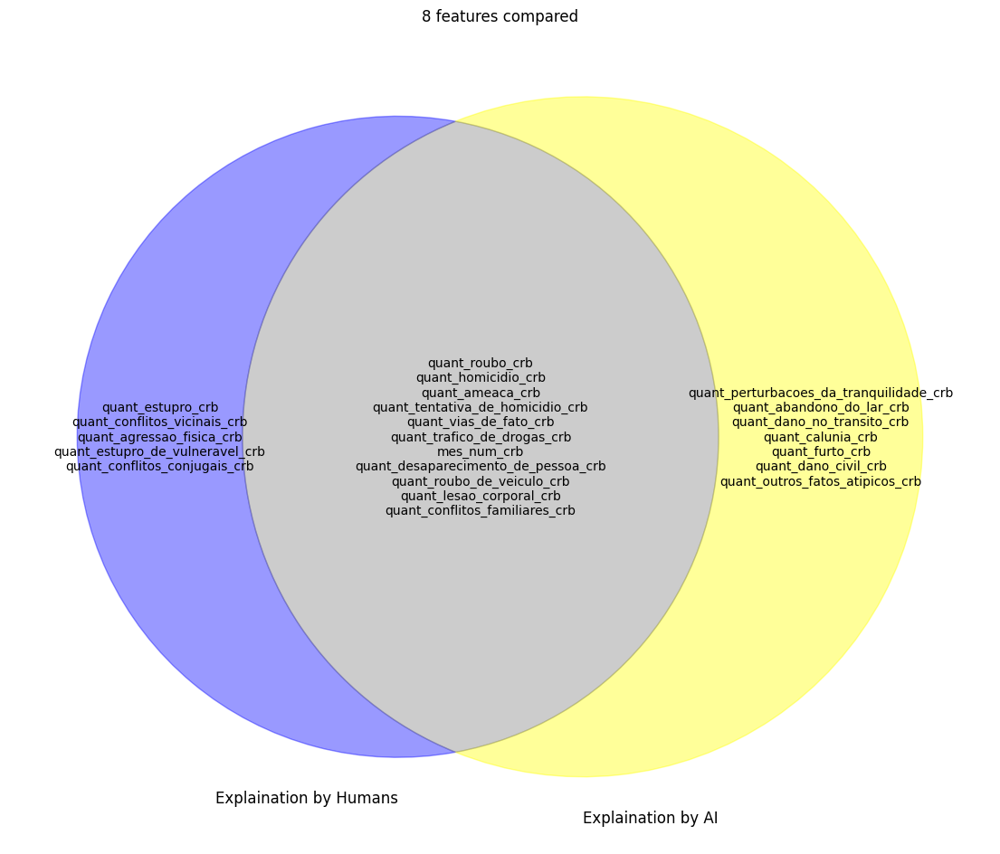

<Figure size 700x800 with 0 Axes>

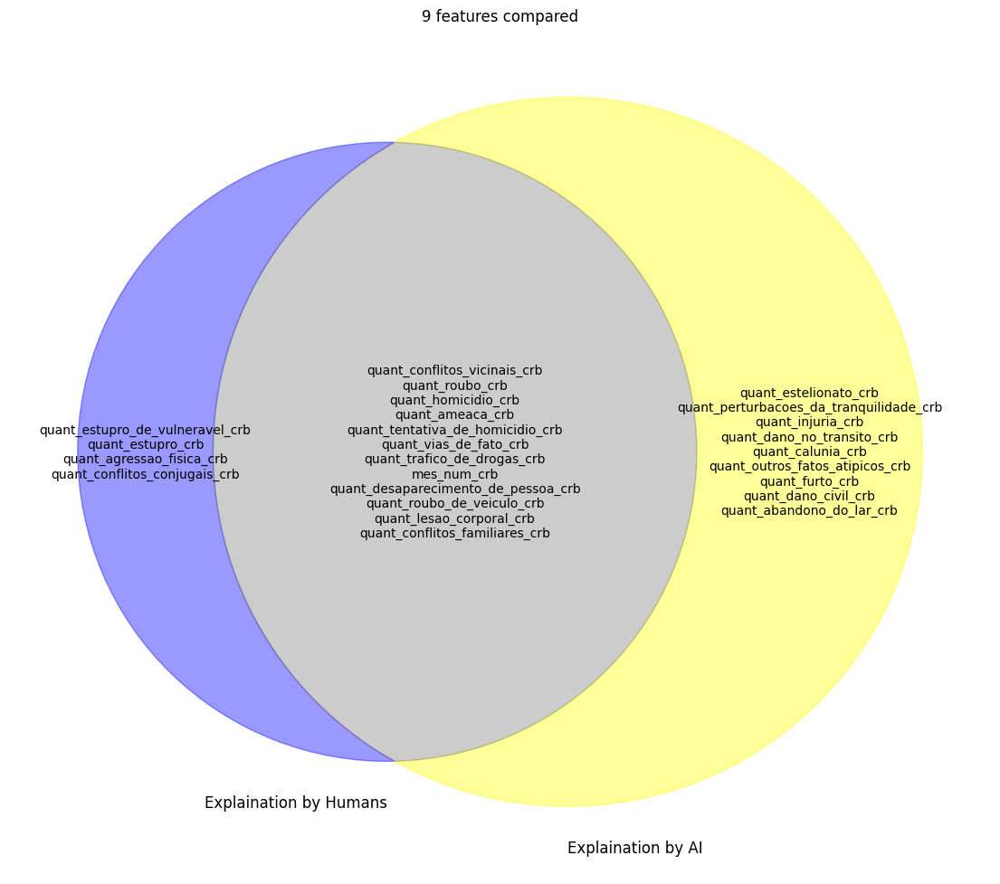

<Figure size 700x800 with 0 Axes>

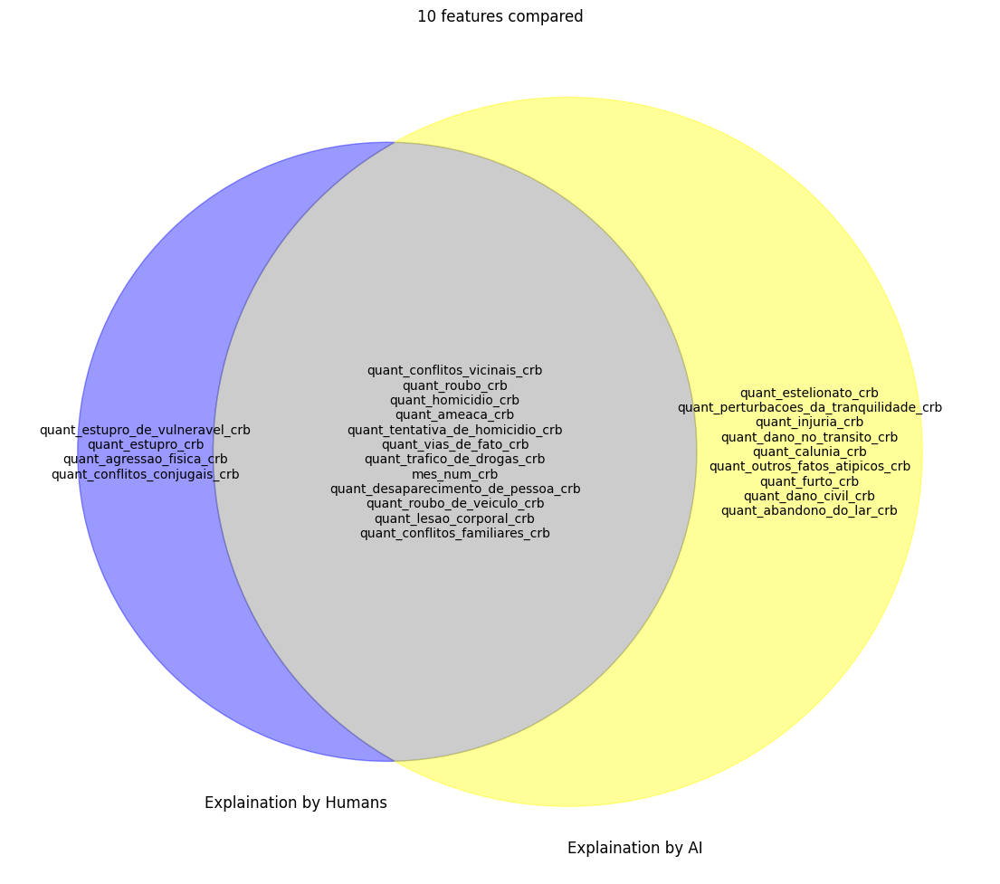




                                            S
att_original_names                           
quant_ameaca_crb                         80.0
quant_roubo_crb                          76.0
quant_homicidio_crb                      67.0
quant_lesao_corporal_crb                 60.0
quant_tentativa_de_homicidio_crb         44.0
quant_trafico_de_drogas_crb              40.0
quant_estupro_crb                        28.0
mes_num_crb                              27.0
quant_vias_de_fato_crb                   25.0
quant_desaparecimento_de_pessoa_crb      24.0
quant_dano_no_transito_crb               23.0
quant_abandono_do_lar_crb                20.0
quant_roubo_de_veiculo_crb               18.0
quant_conflitos_familiares_crb           18.0
quant_outros_fatos_atipicos_crb          16.0
quant_agressao_fisica_crb                16.0
quant_conflitos_vicinais_crb             16.0
quant_conflitos_conjugais_crb            14.0
quant_estupro_de_vulneravel_crb          13.0
quant_furto_crb                

<Figure size 700x800 with 0 Axes>

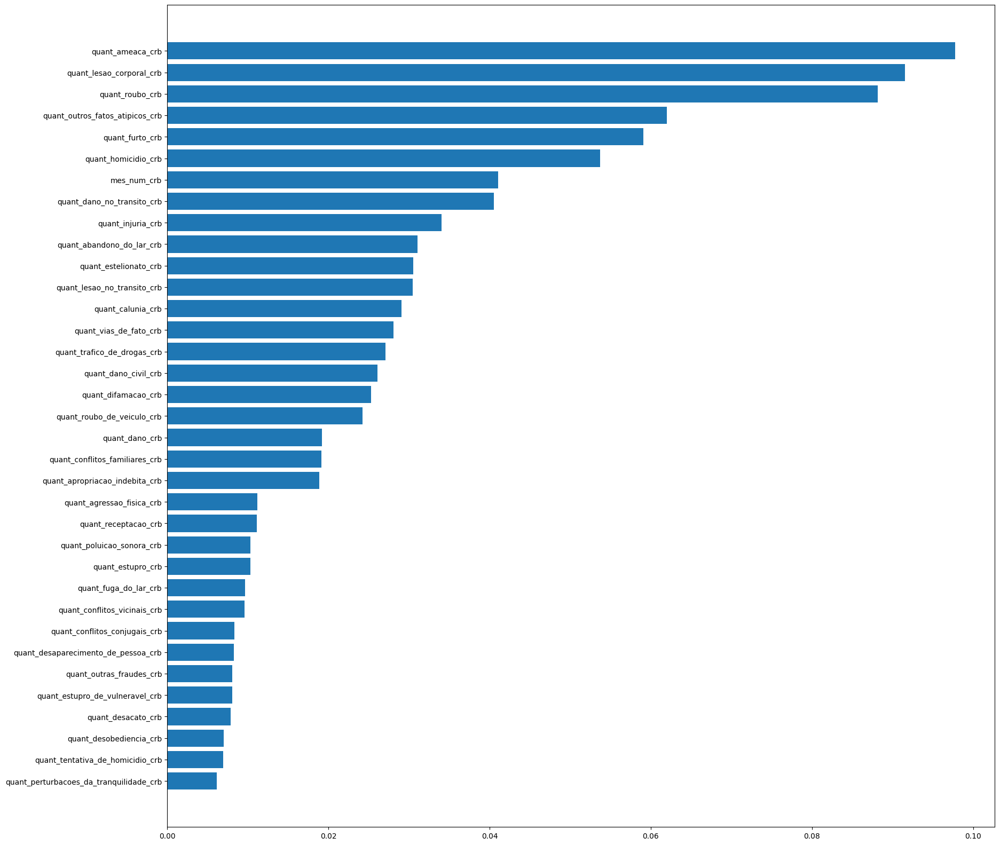

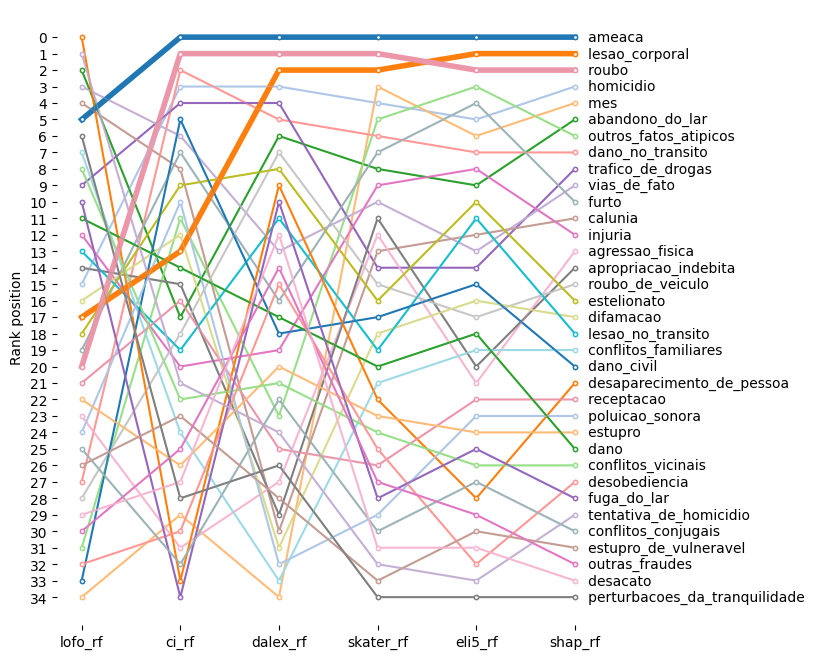

In [ ]:
# Main execution
fold=2
top_n_features = 10

X_train, X_test, y_train, y_test = Util.train_test_split_by_stratified_k_fold(fold,X, Y, skf) # 4 folds index 0,1,2,3
df_feature_rank, model_rf, df_models_info = calcRanks(X_train, X_test, y_train, y_test, X, Y, fold)

main_analysis_by_top(top_n_features)
Util.plotVenn(df_feature_rank,fold)
Util.plotVenns(df_feature_rank,fold)
Util.plotFeatureImportance(model_rf)
Util.saveFigs(df_models_info,fold)

# ConeXi execution
df_features_rank_copy = df_feature_rank.copy()
df_features_rank_copy['weights'] = 1
c = combine.ConeXi(top_n_features)
rank_final, data = c.ExecuteConeXi(df_features_rank_copy)
print(rank_final)
print()
print(data)
# Bump Chart
df_features_rank_copy = df_features_rank_copy.drop(columns=['weights'])
Util.plotBumpChart(df_features_rank_copy,fold)
data.to_csv('rank_intermediante_conexi_fold'+str(fold)+'_.csv')
rank_final.to_csv('rank_final_conexi_fold'+str(fold)+'_.csv')
df_features_rank_copy.to_csv('df_features_rank_fold'+str(fold)+'_.csv')

### Fold 4

Fold selected 3:
     mes_num_crb  quant_lesao_corporal_crb  quant_ameaca_crb  quant_roubo_crb  \
0       0.000000                  0.000000          0.048193         0.002433   
1       0.000000                  0.081633          0.084337         0.124088   
2       0.000000                  0.000000          0.132530         0.063260   
3       0.000000                  0.183673          0.168675         0.141119   
4       0.000000                  0.040816          0.012048         0.017032   
..           ...                       ...               ...              ...   
133     0.090909                  0.122449          0.240964         0.197080   
134     0.090909                  0.102041          0.024096         0.099757   
135     0.090909                  0.367347          0.385542         0.635036   
136     0.090909                  0.163265          0.204819         0.484185   
137     0.090909                  0.000000          0.012048         0.002433   

     quant

  0%|          | 0/35 [00:00<?, ?it/s]

Explanation by Human 1....
Explanation by Human 2....
Explanation by Human 3....
Explanation by Human 4....
Explanation by Human 5....
Explanation by Human 6....


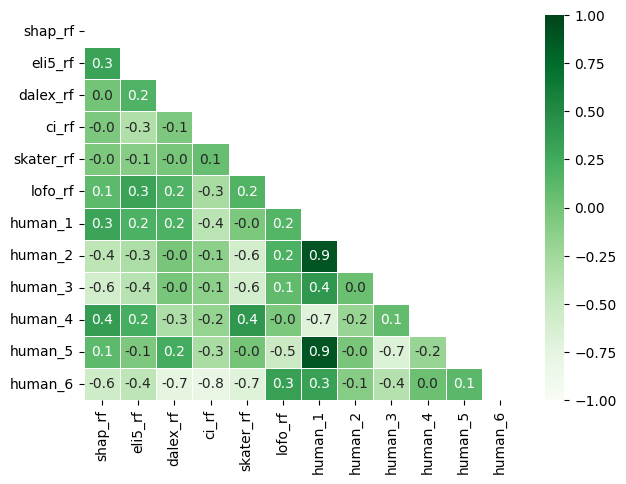

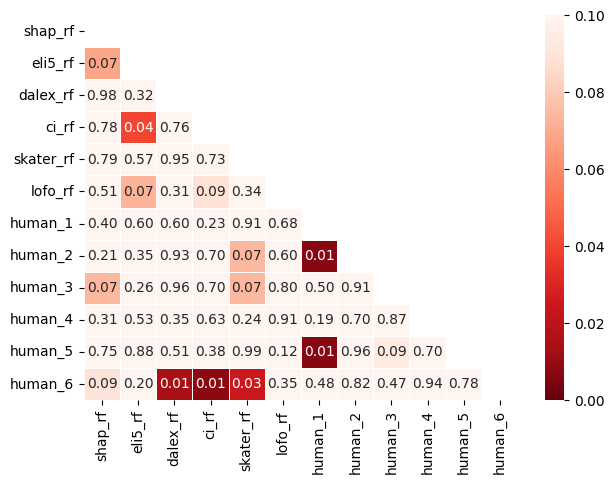

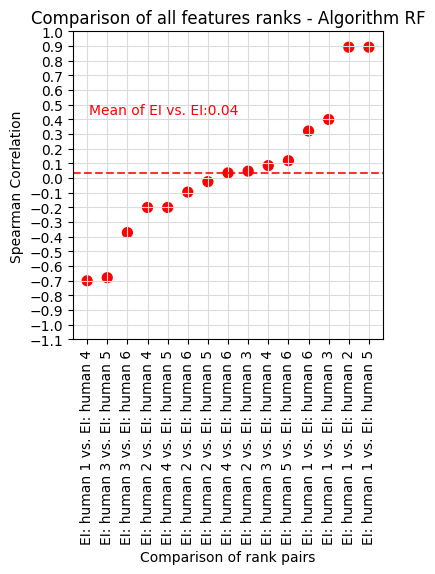

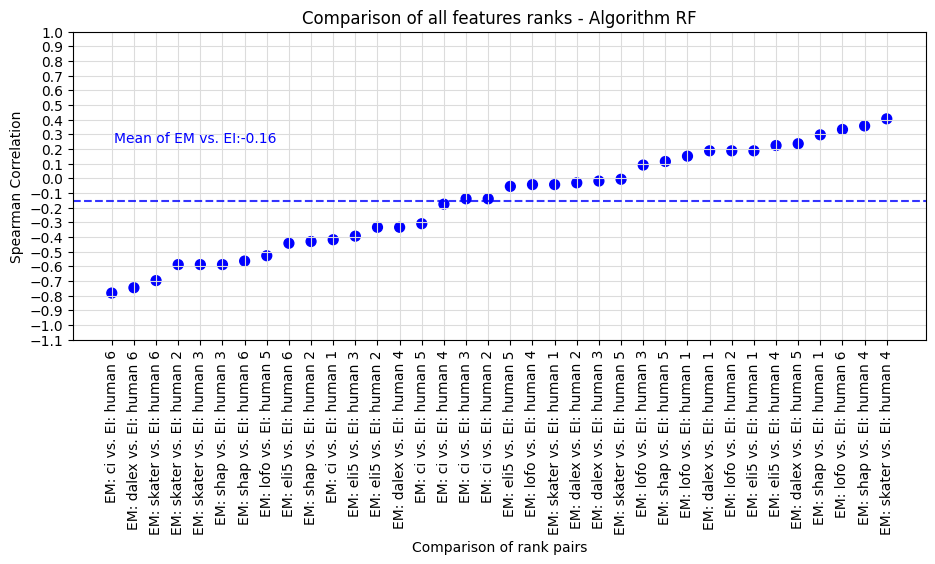

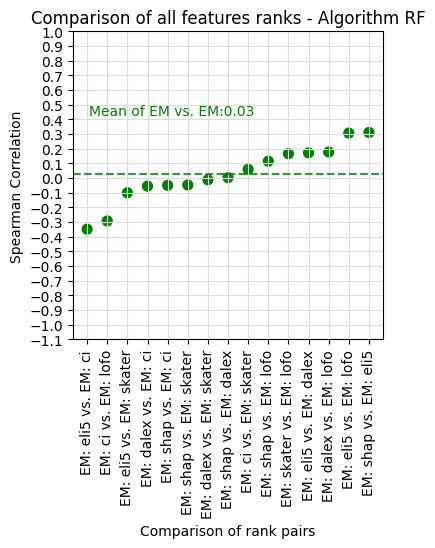

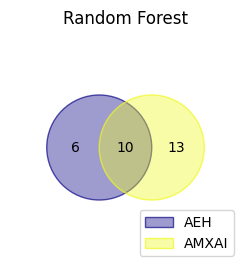

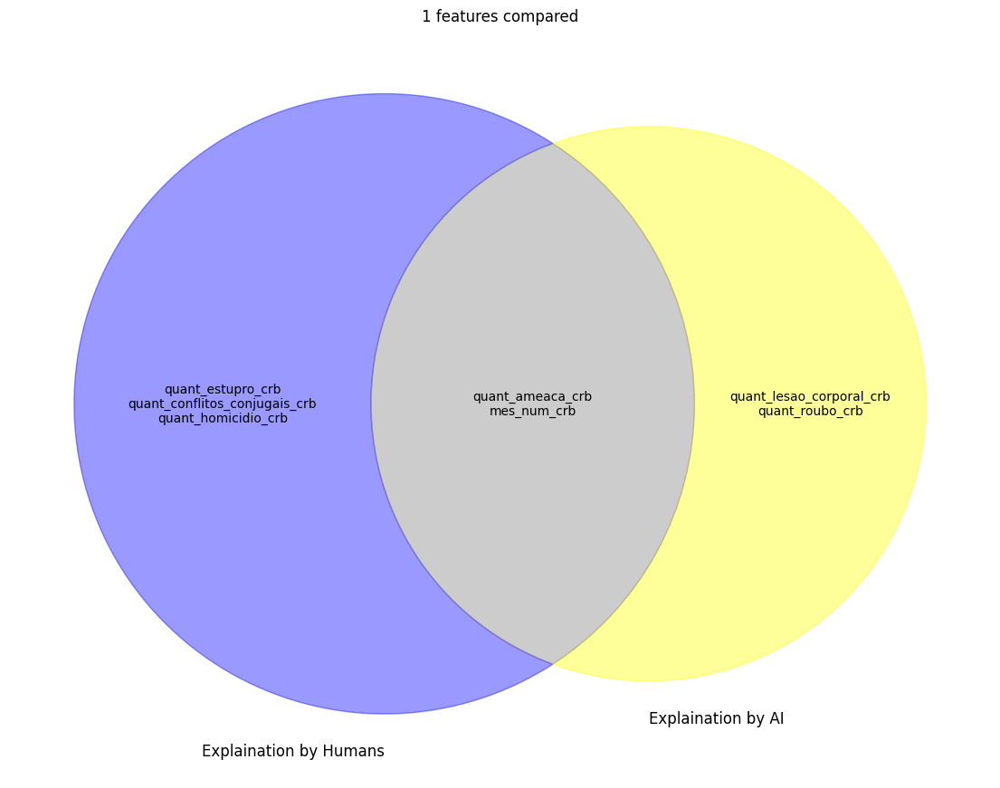

<Figure size 700x800 with 0 Axes>

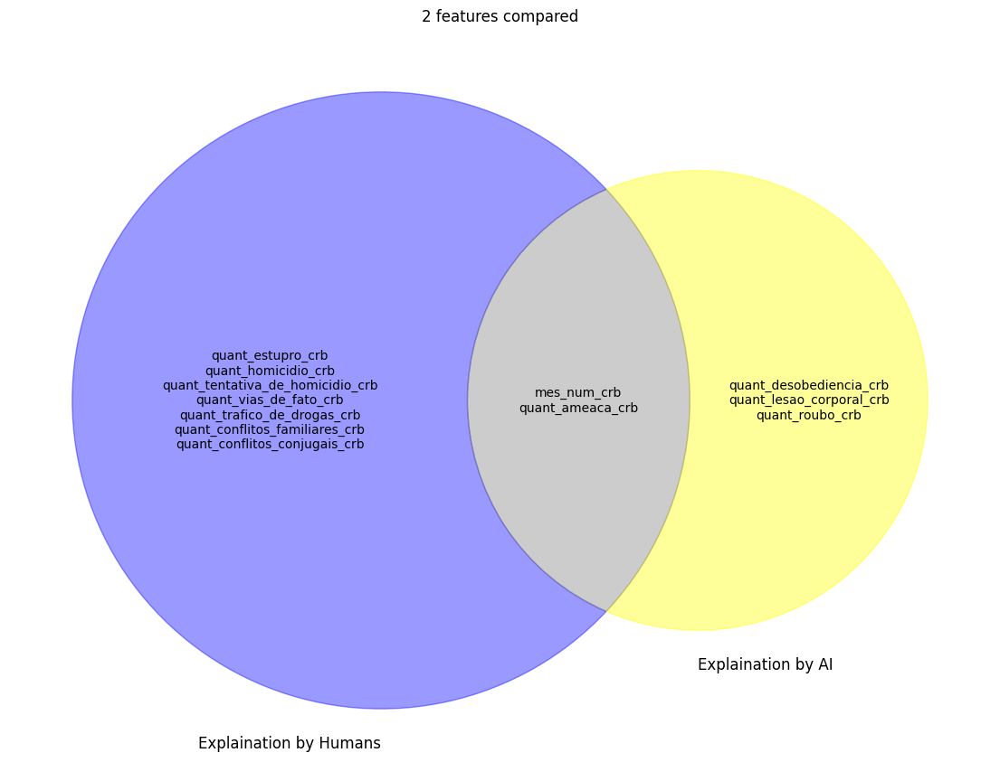

<Figure size 700x800 with 0 Axes>

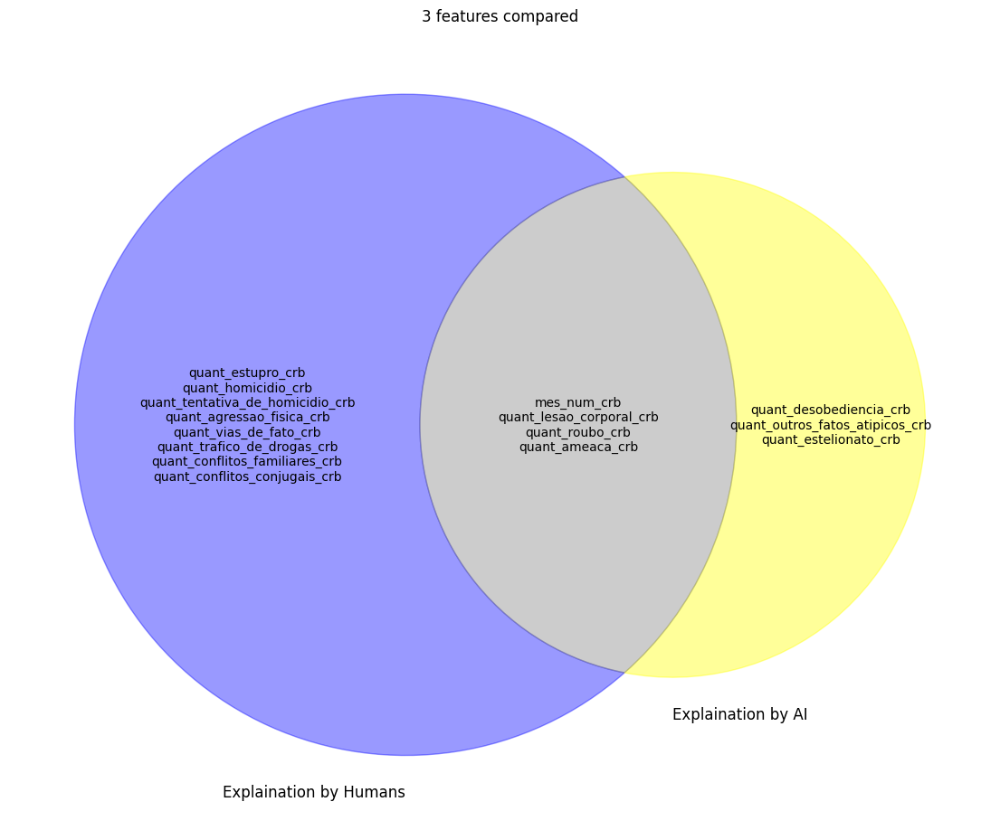

<Figure size 700x800 with 0 Axes>

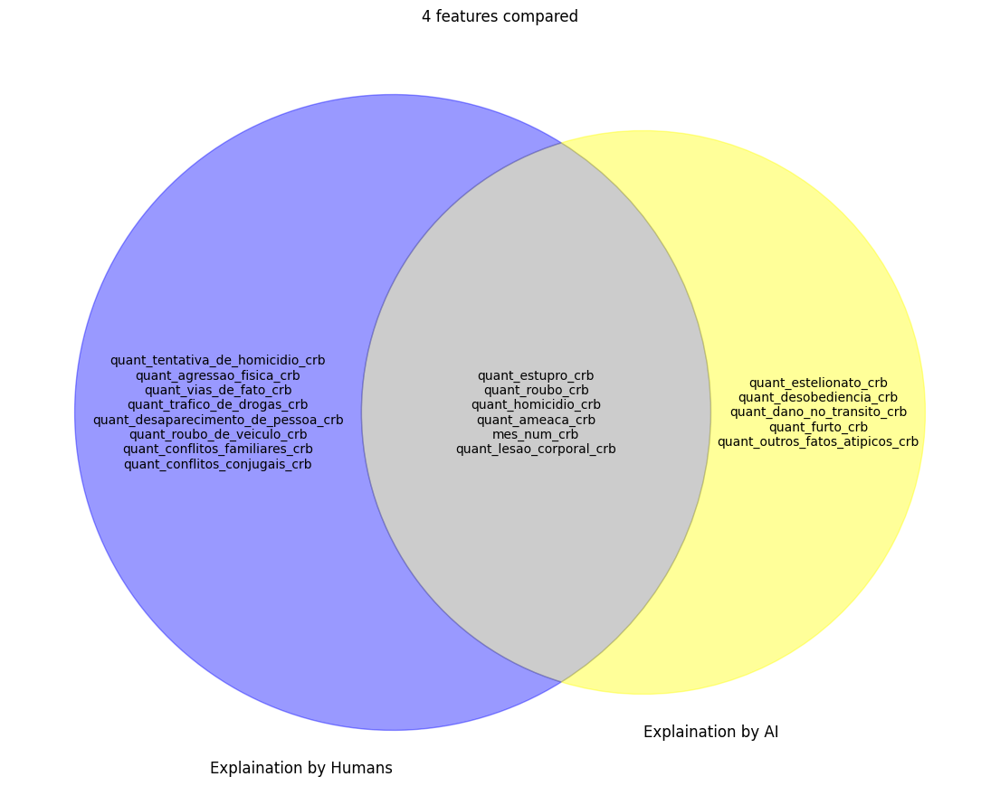

<Figure size 700x800 with 0 Axes>

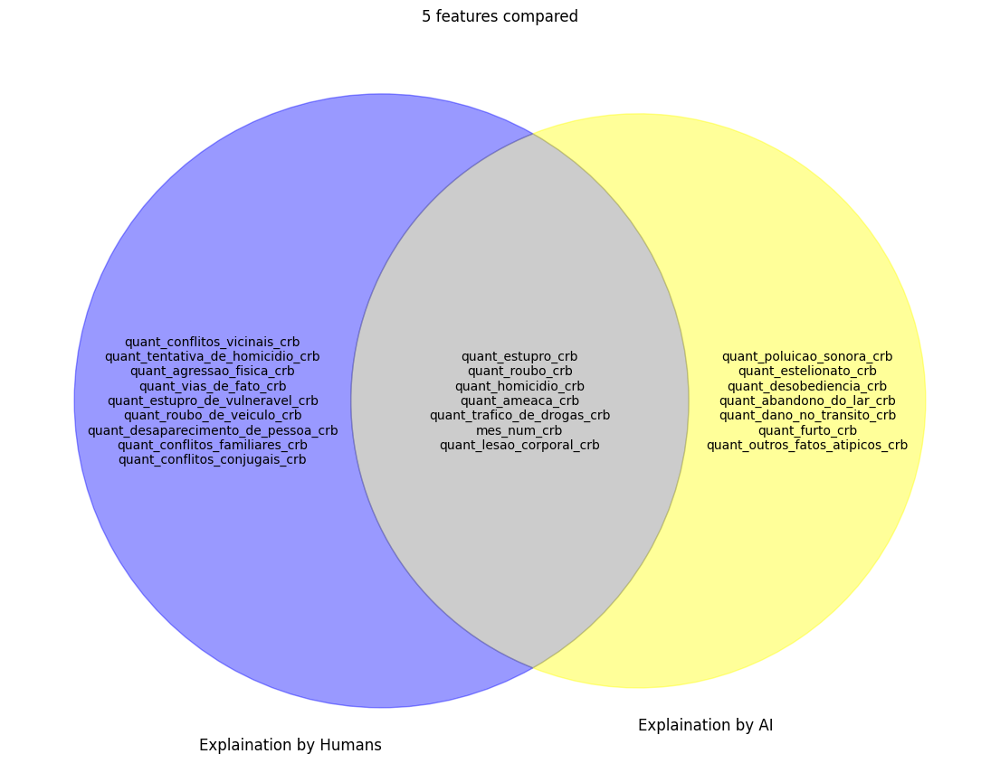

<Figure size 700x800 with 0 Axes>

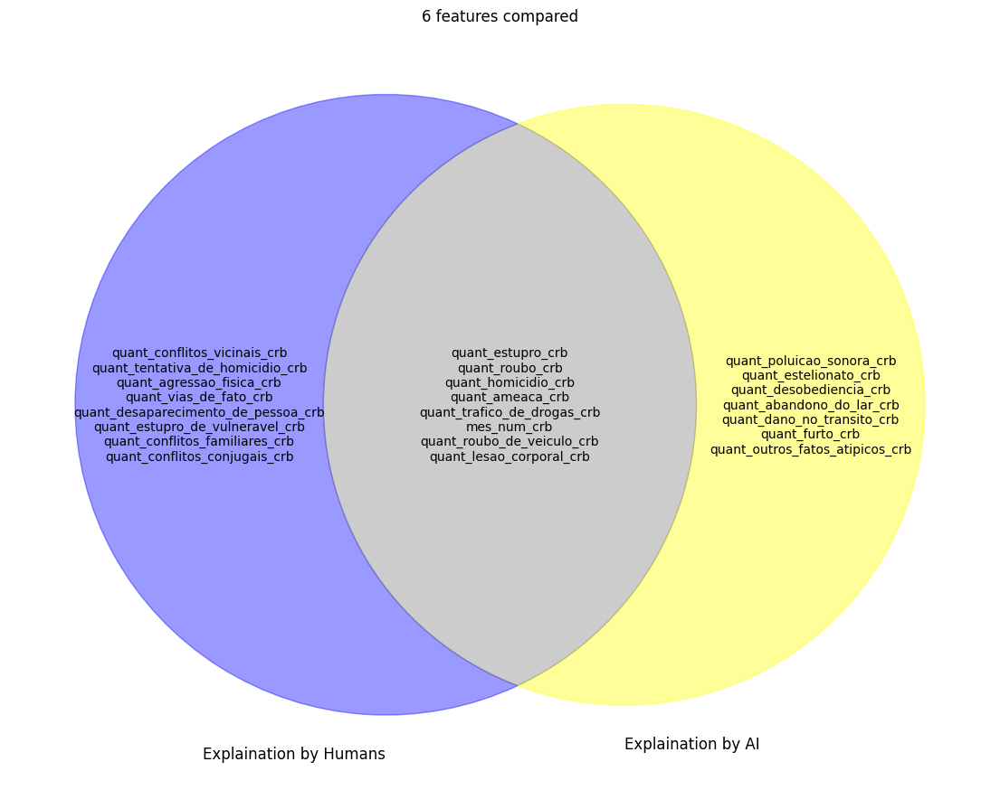

<Figure size 700x800 with 0 Axes>

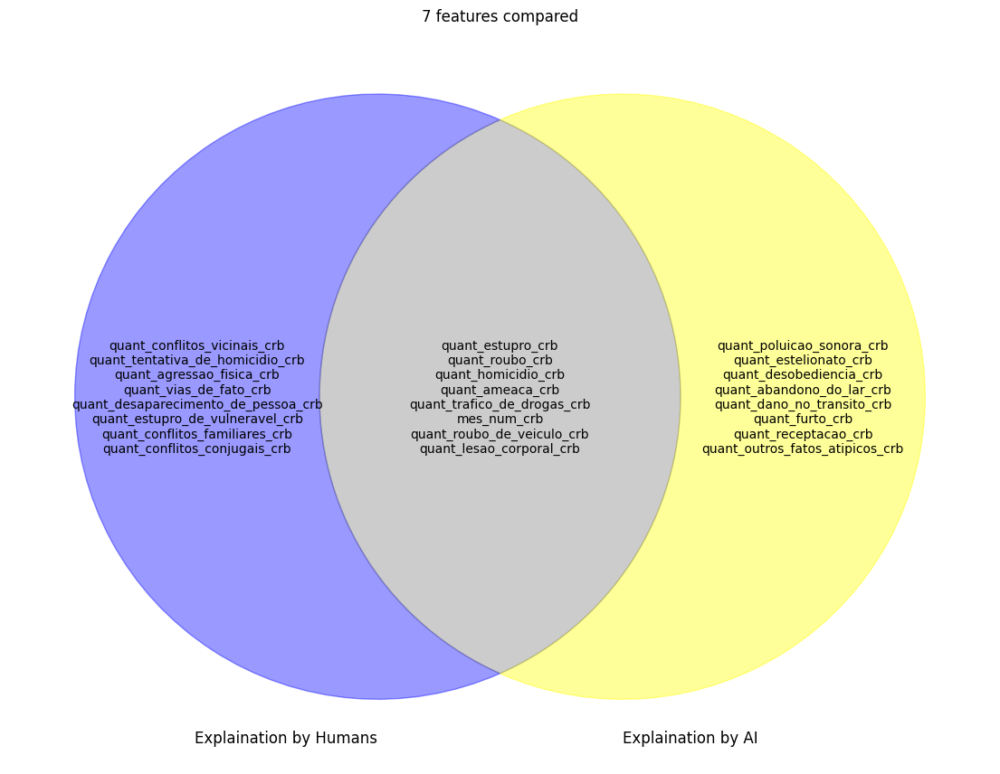

<Figure size 700x800 with 0 Axes>

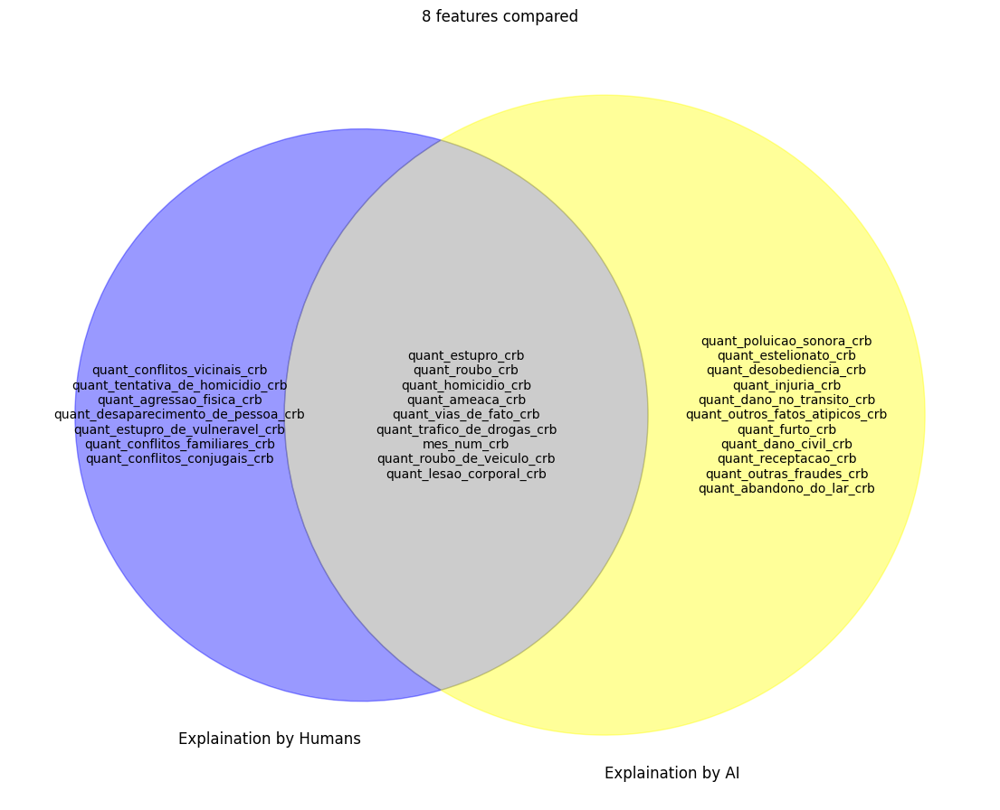

<Figure size 700x800 with 0 Axes>

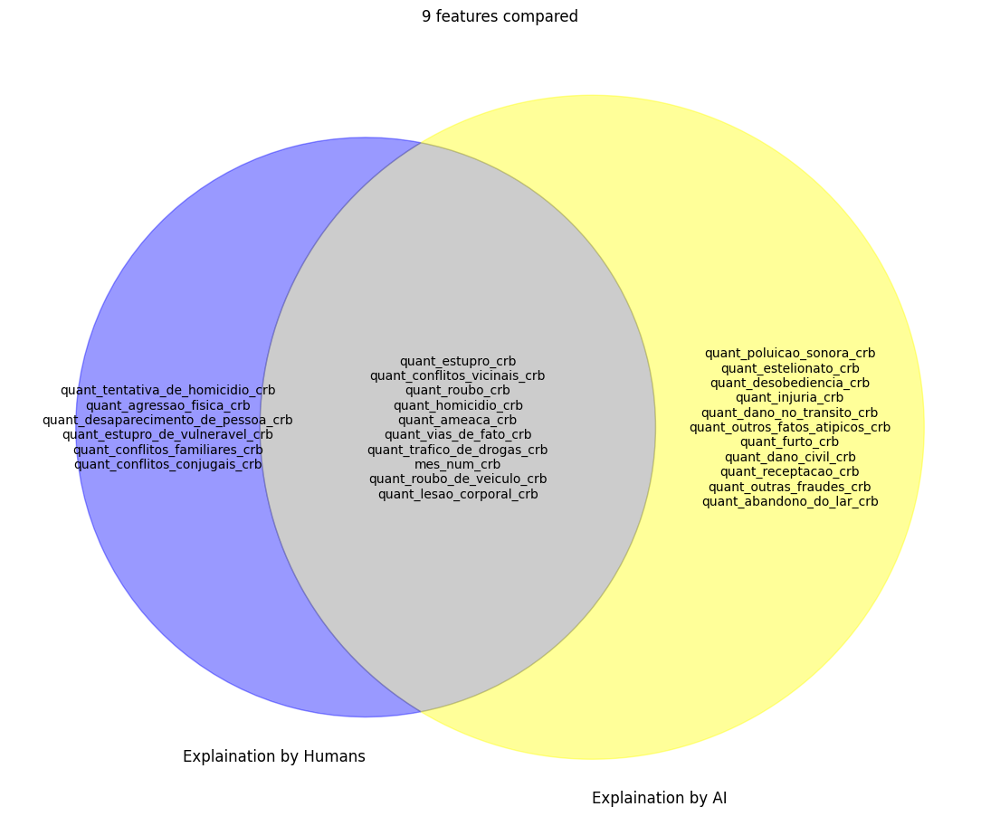

<Figure size 700x800 with 0 Axes>

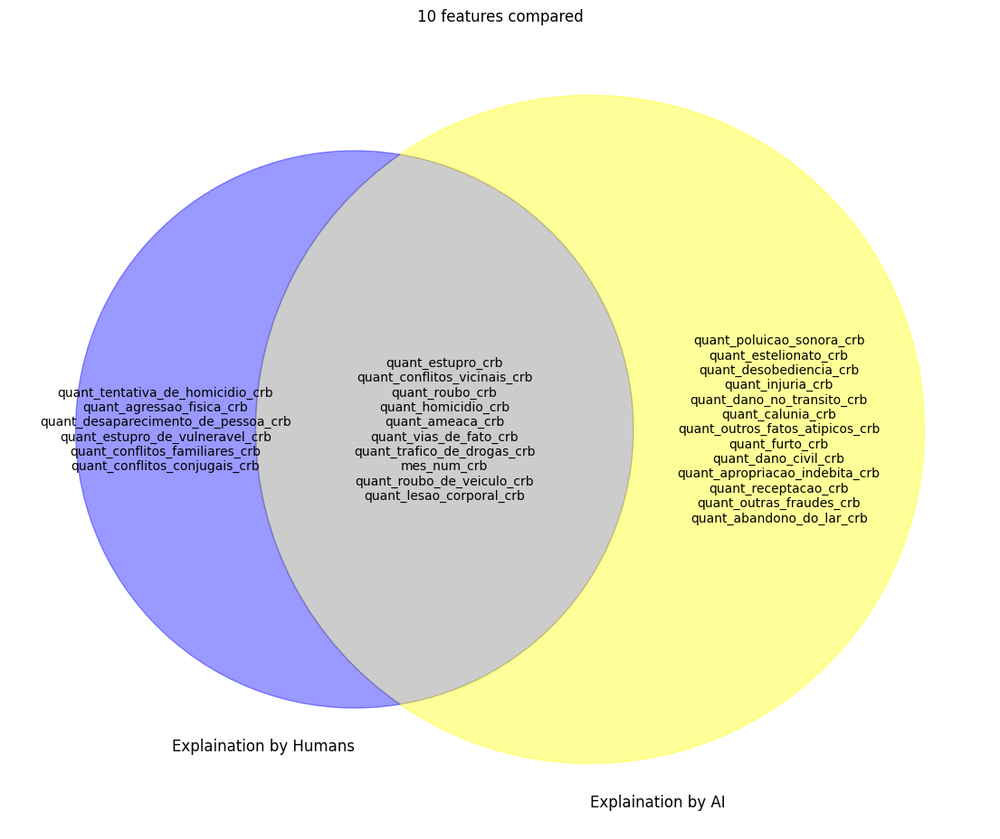




                                            S
att_original_names                           
quant_roubo_crb                          79.0
quant_ameaca_crb                         72.0
quant_lesao_corporal_crb                 62.0
quant_homicidio_crb                      56.0
quant_trafico_de_drogas_crb              36.0
quant_estupro_crb                        35.0
quant_tentativa_de_homicidio_crb         35.0
quant_dano_no_transito_crb               29.0
quant_outros_fatos_atipicos_crb          24.0
quant_roubo_de_veiculo_crb               23.0
mes_num_crb                              22.0
quant_furto_crb                          21.0
quant_vias_de_fato_crb                   19.0
quant_abandono_do_lar_crb                18.0
quant_conflitos_vicinais_crb             16.0
quant_agressao_fisica_crb                16.0
quant_conflitos_familiares_crb           15.0
quant_conflitos_conjugais_crb            14.0
quant_estupro_de_vulneravel_crb          13.0
quant_desaparecimento_de_pessoa

<Figure size 700x800 with 0 Axes>

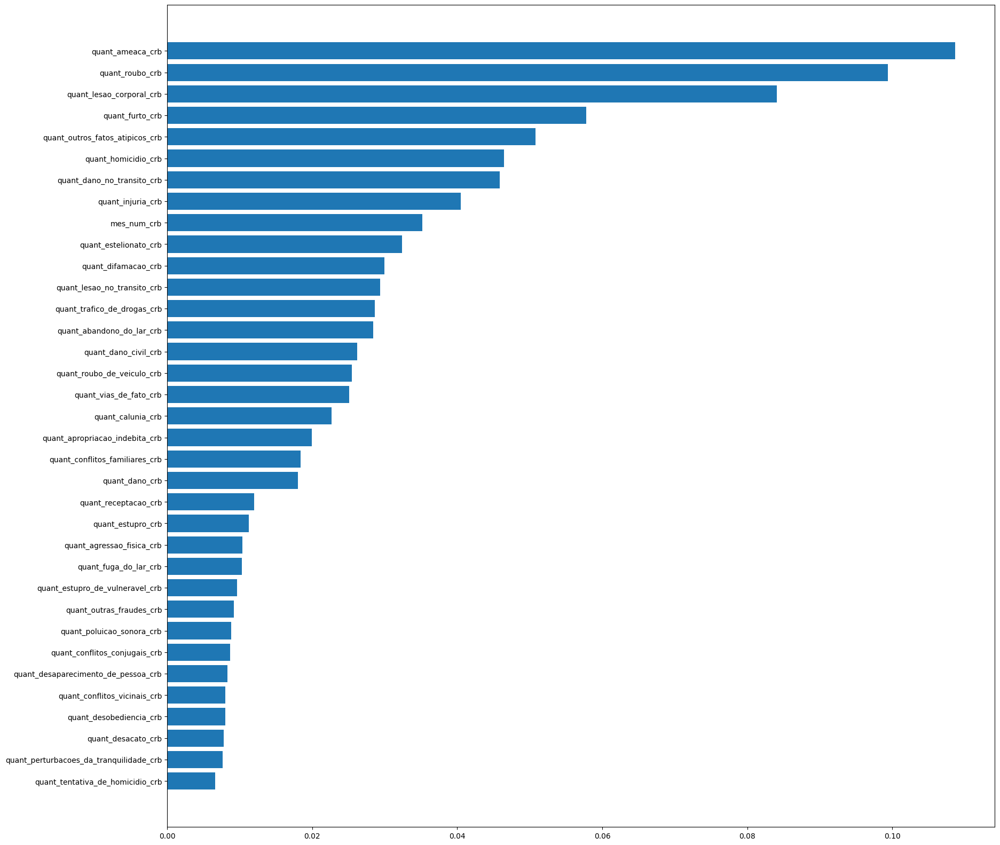

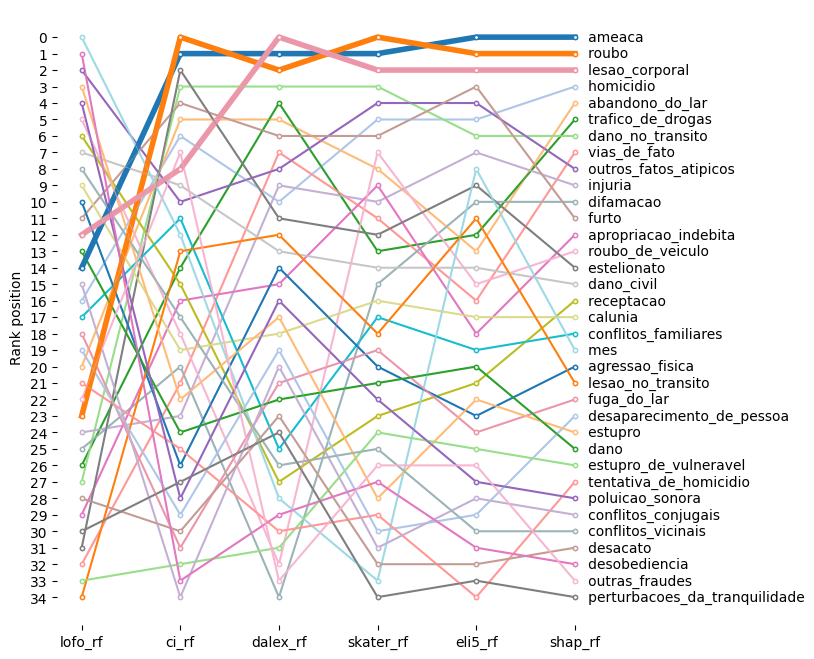

In [ ]:
# Main execution
fold=3
top_n_features = 10

X_train, X_test, y_train, y_test = Util.train_test_split_by_stratified_k_fold(fold,X, Y, skf) # 4 folds index 0,1,2,3
df_feature_rank, model_rf, df_models_info = calcRanks(X_train, X_test, y_train, y_test, X, Y, fold)

main_analysis_by_top(top_n_features)
Util.plotVenn(df_feature_rank,fold)
Util.plotVenns(df_feature_rank,fold)
Util.plotFeatureImportance(model_rf)
Util.saveFigs(df_models_info,fold)

# ConeXi execution
df_features_rank_copy = df_feature_rank.copy()
df_features_rank_copy['weights'] = 1
c = combine.ConeXi(top_n_features)
rank_final, data = c.ExecuteConeXi(df_features_rank_copy)
print(rank_final)
print()
print(data)
# Bump Chart
df_features_rank_copy = df_features_rank_copy.drop(columns=['weights'])
Util.plotBumpChart(df_features_rank_copy,fold)
data.to_csv('rank_intermediante_conexi_fold'+str(fold)+'_.csv')
rank_final.to_csv('rank_final_conexi_fold'+str(fold)+'_.csv')
df_features_rank_copy.to_csv('df_features_rank_fold'+str(fold)+'_.csv')

### Fold 5

Fold selected 4:
     mes_num_crb  quant_lesao_corporal_crb  quant_ameaca_crb  quant_roubo_crb  \
0       0.000000                  0.000000          0.048193         0.002433   
1       0.000000                  0.081633          0.084337         0.124088   
2       0.000000                  0.000000          0.132530         0.063260   
3       0.000000                  0.183673          0.168675         0.141119   
4       0.000000                  0.040816          0.012048         0.017032   
..           ...                       ...               ...              ...   
133     0.090909                  0.122449          0.240964         0.197080   
134     0.090909                  0.102041          0.024096         0.099757   
135     0.090909                  0.367347          0.385542         0.635036   
136     0.090909                  0.163265          0.204819         0.484185   
137     0.090909                  0.000000          0.012048         0.002433   

     quant

  0%|          | 0/35 [00:00<?, ?it/s]

Explanation by Human 1....
Explanation by Human 2....
Explanation by Human 3....
Explanation by Human 4....
Explanation by Human 5....
Explanation by Human 6....


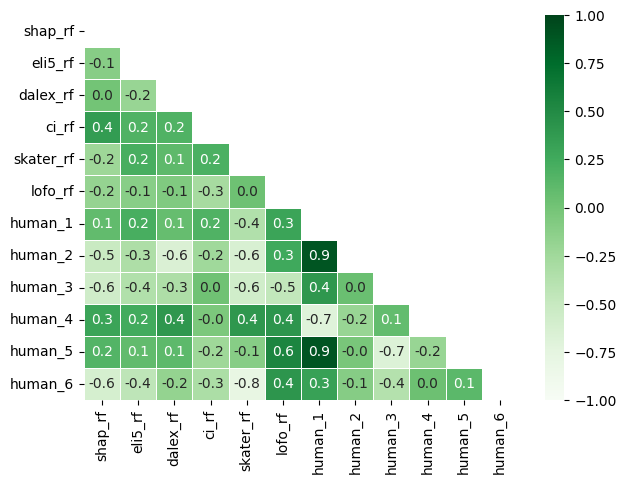

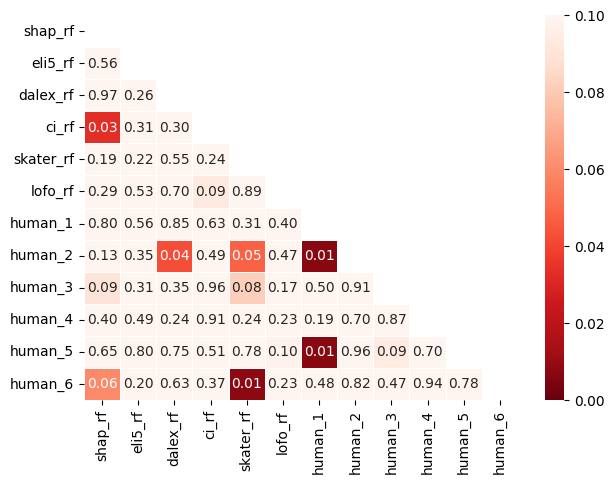

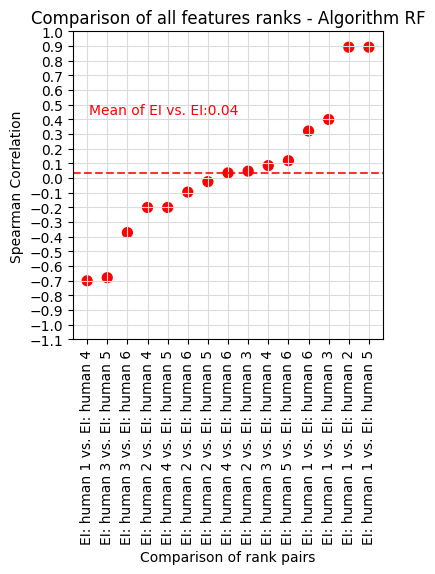

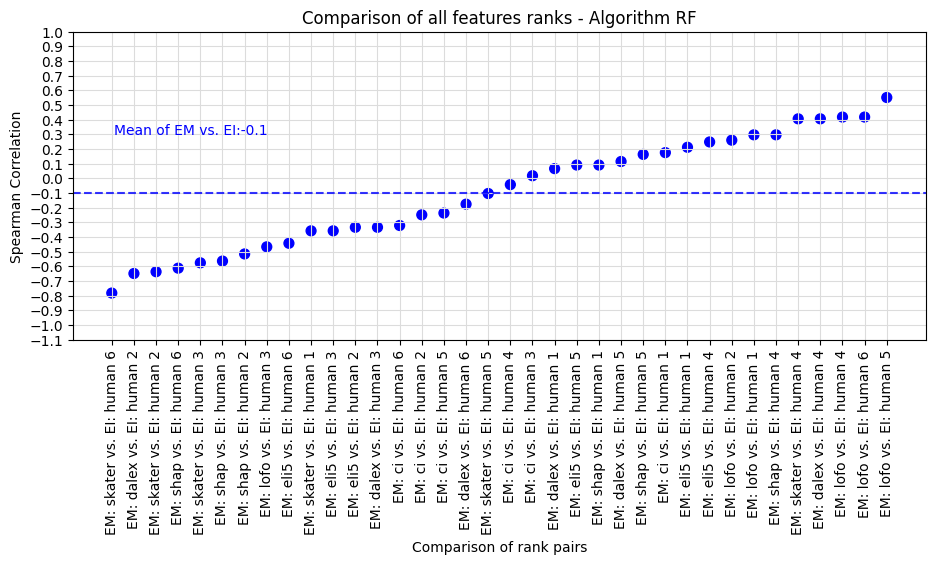

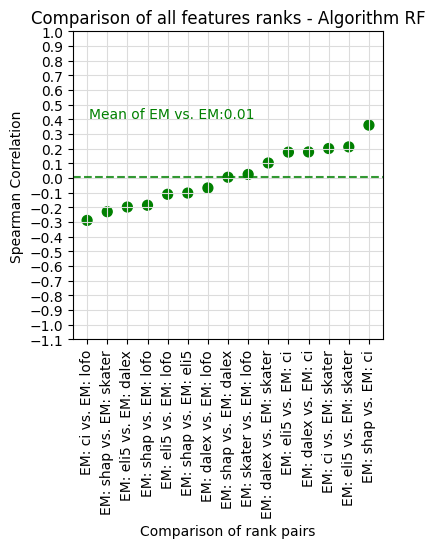

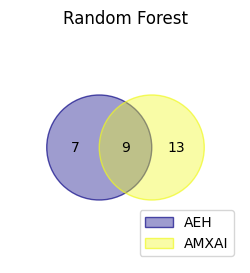

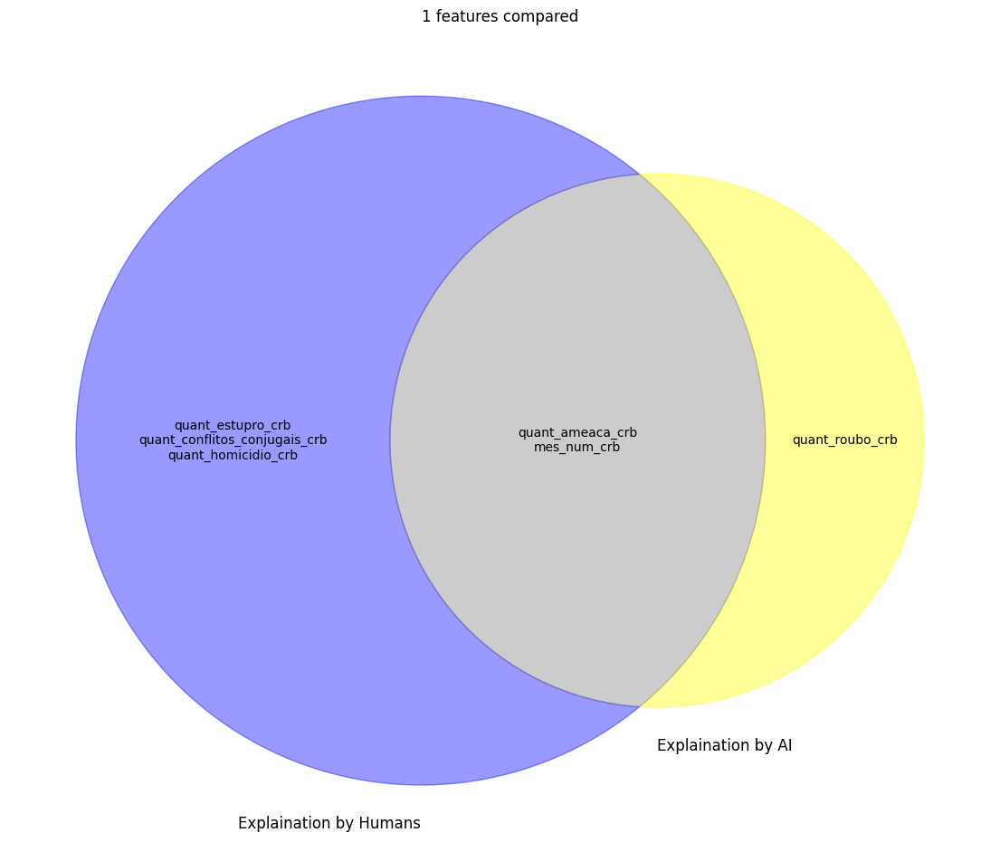

<Figure size 700x800 with 0 Axes>

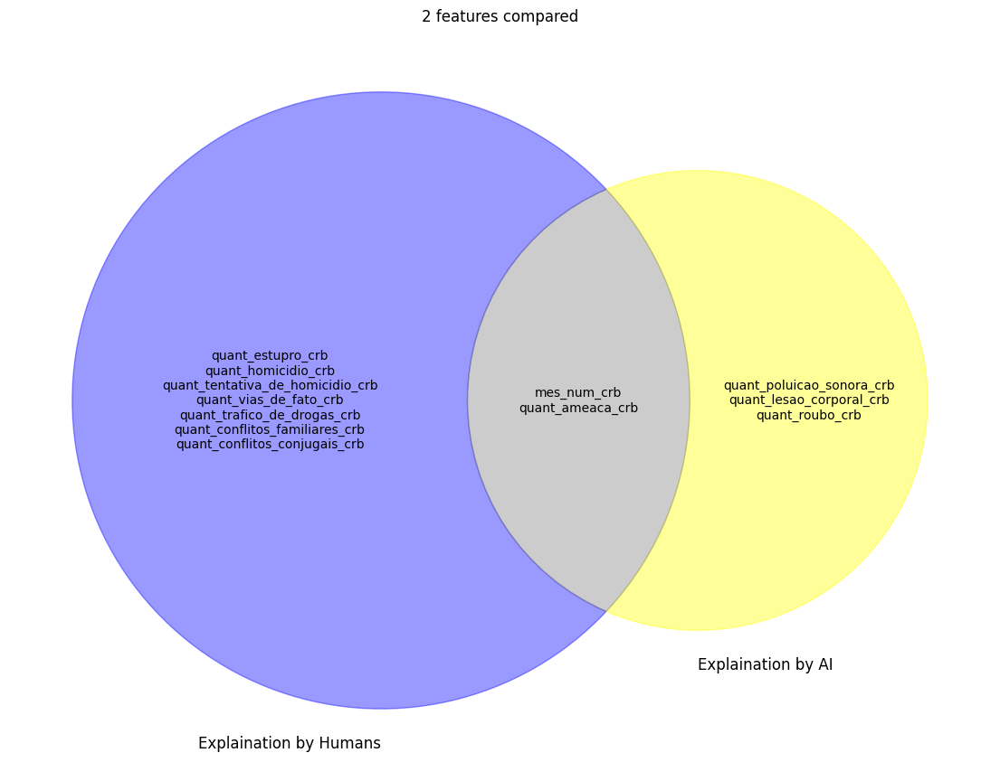

<Figure size 700x800 with 0 Axes>

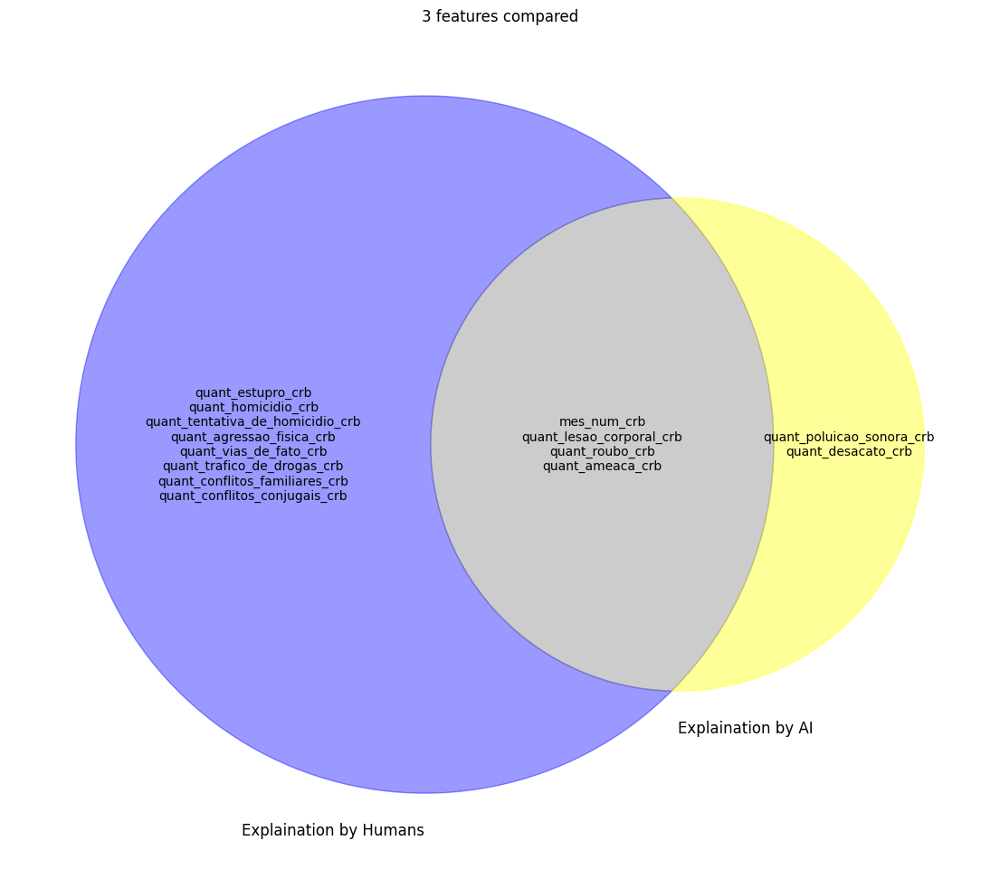

<Figure size 700x800 with 0 Axes>

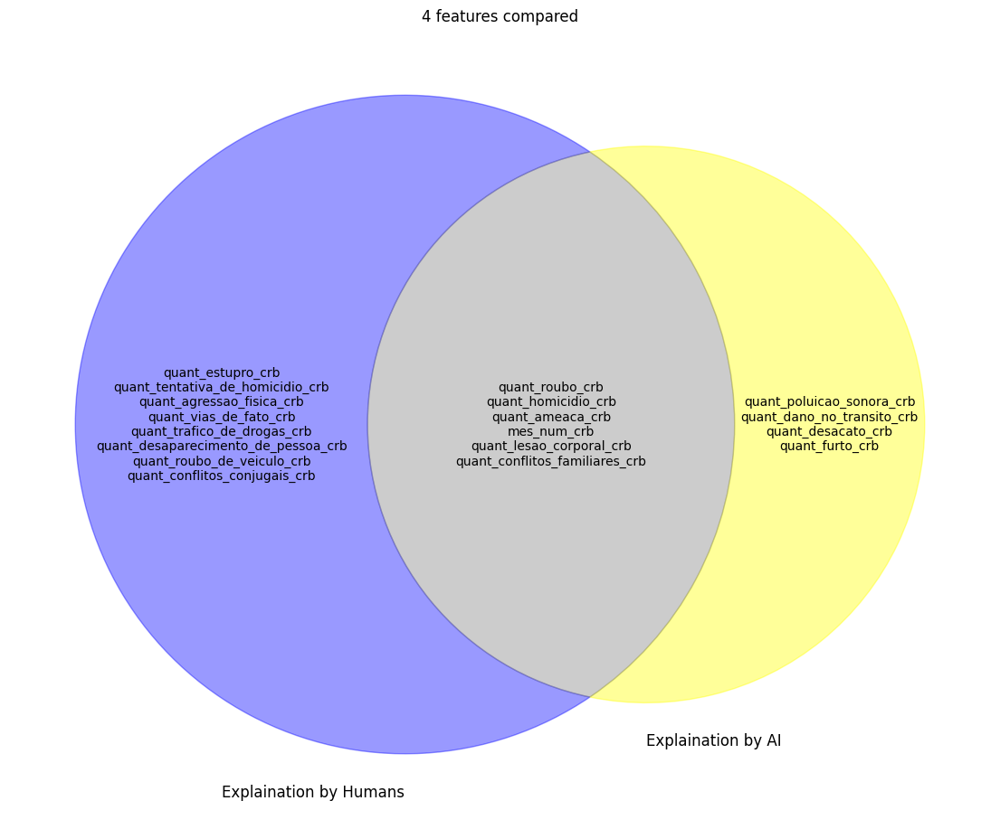

<Figure size 700x800 with 0 Axes>

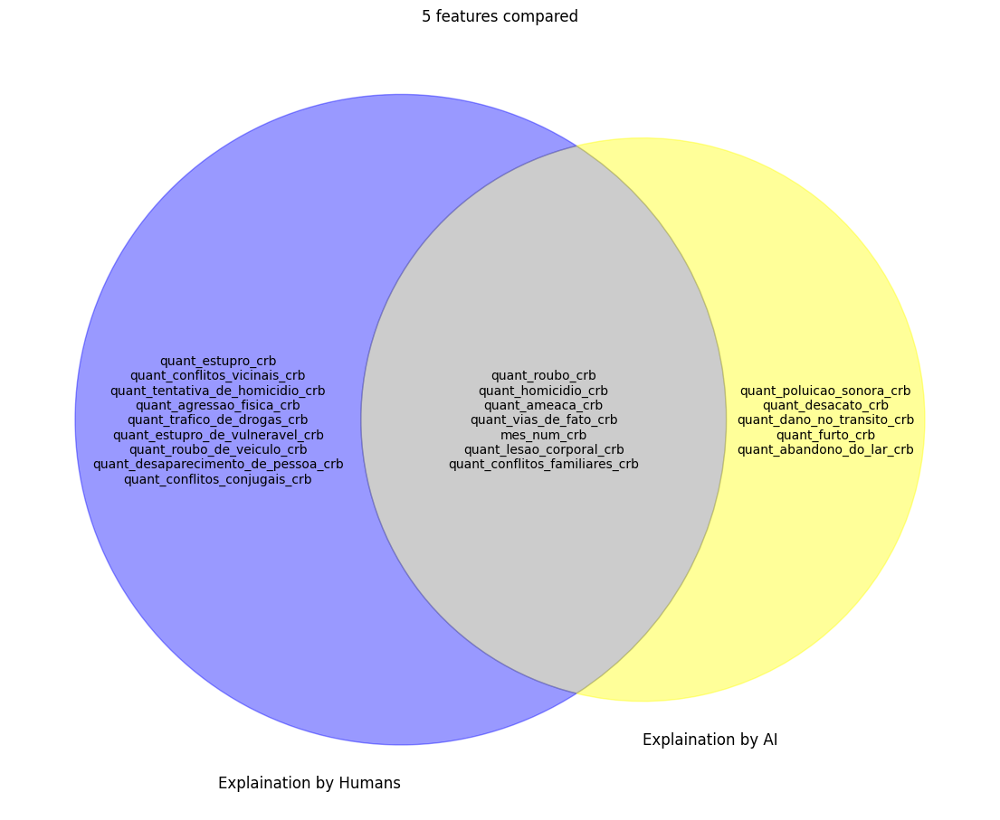

<Figure size 700x800 with 0 Axes>

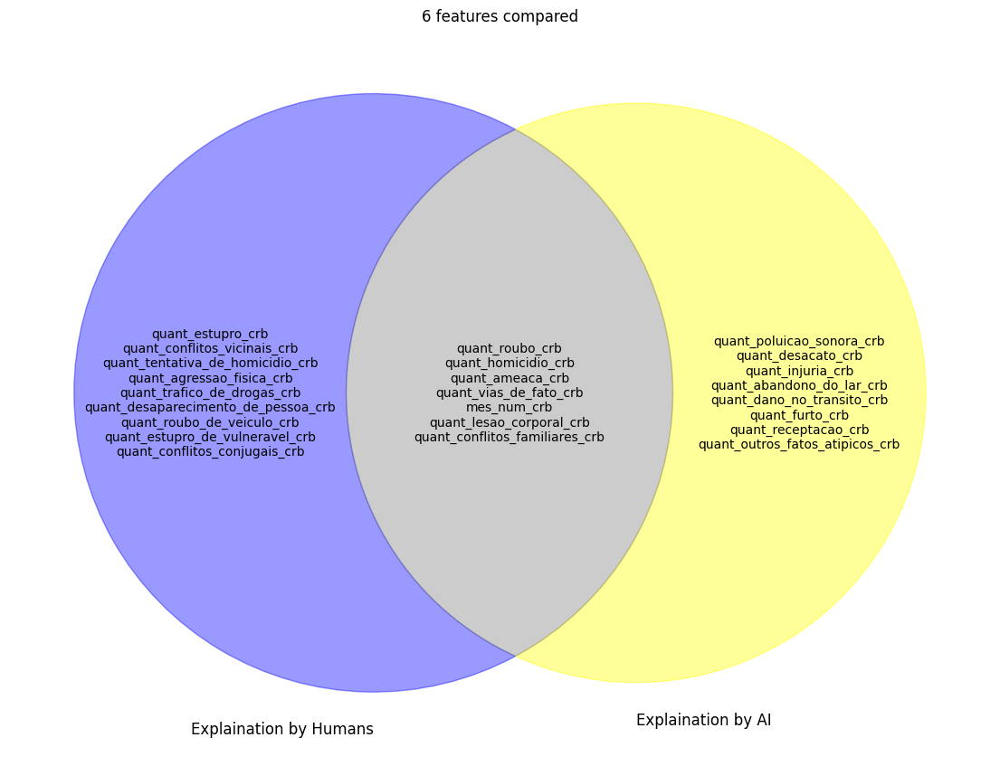

<Figure size 700x800 with 0 Axes>

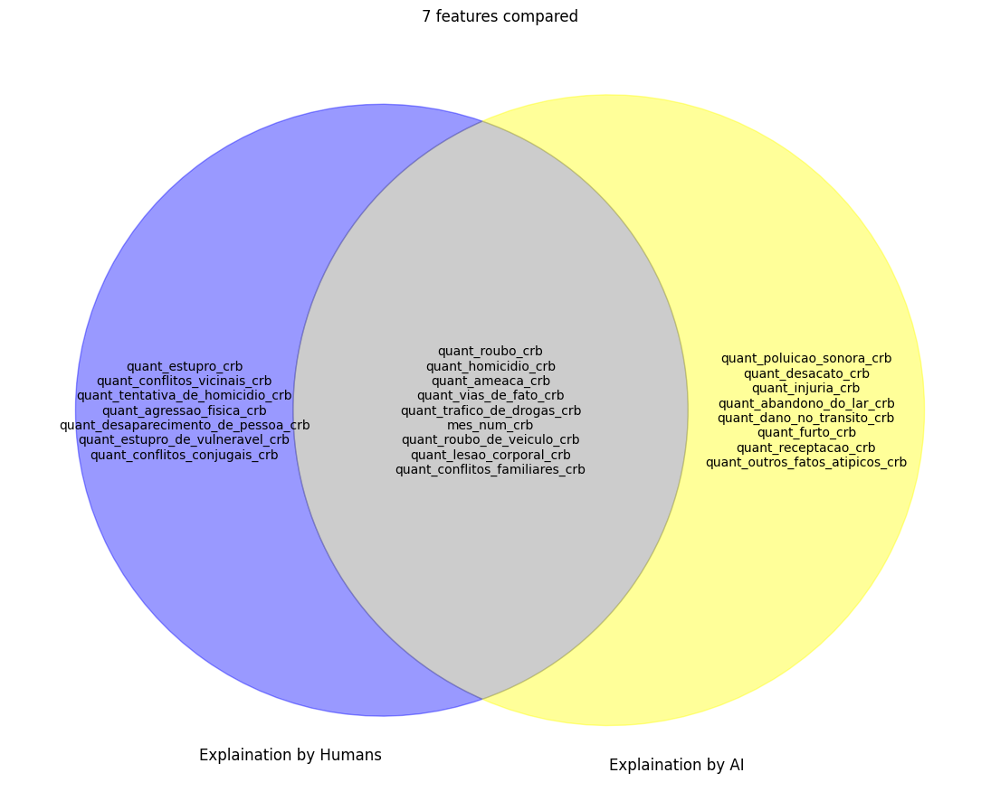

<Figure size 700x800 with 0 Axes>

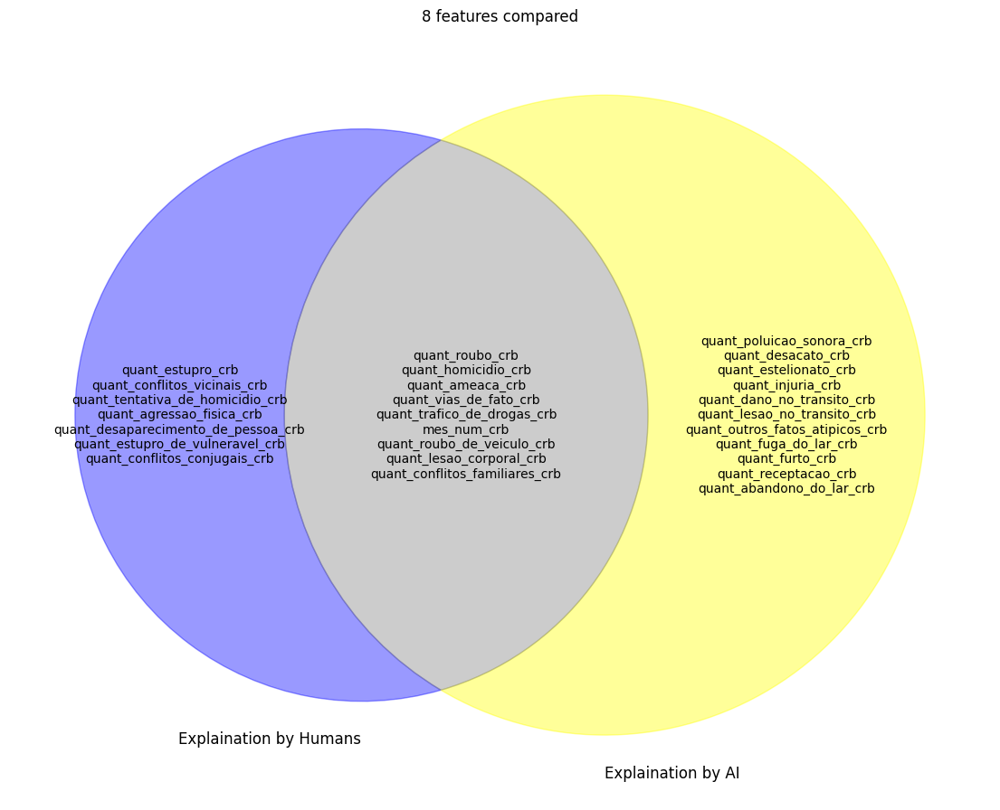

<Figure size 700x800 with 0 Axes>

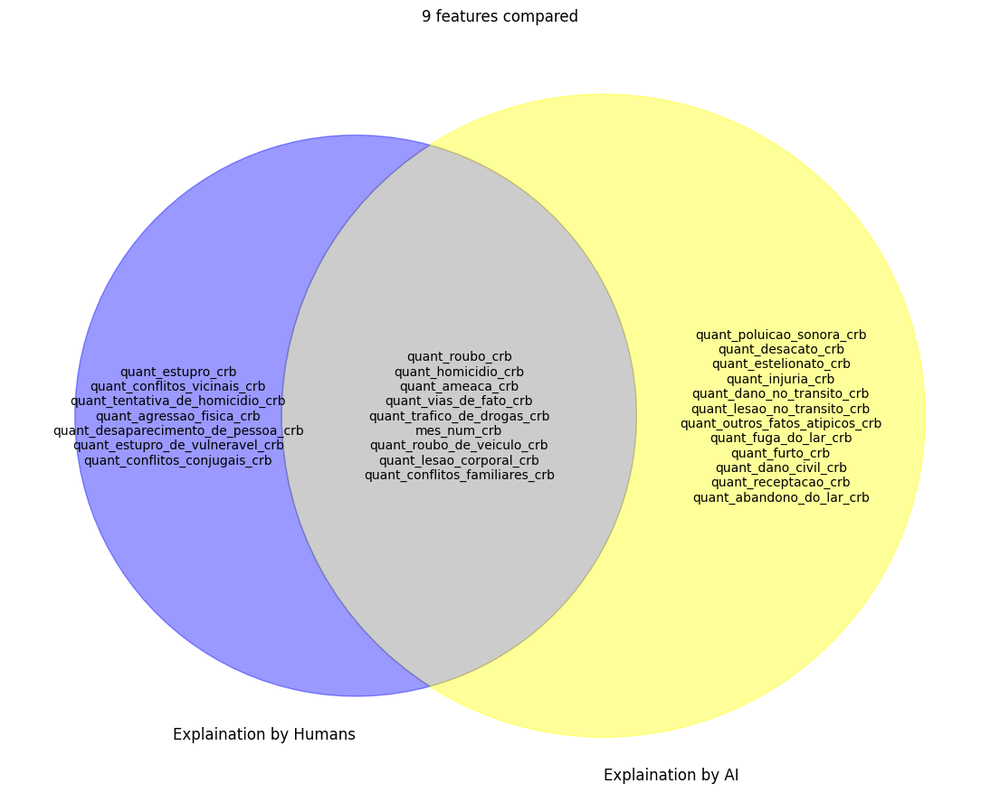

<Figure size 700x800 with 0 Axes>

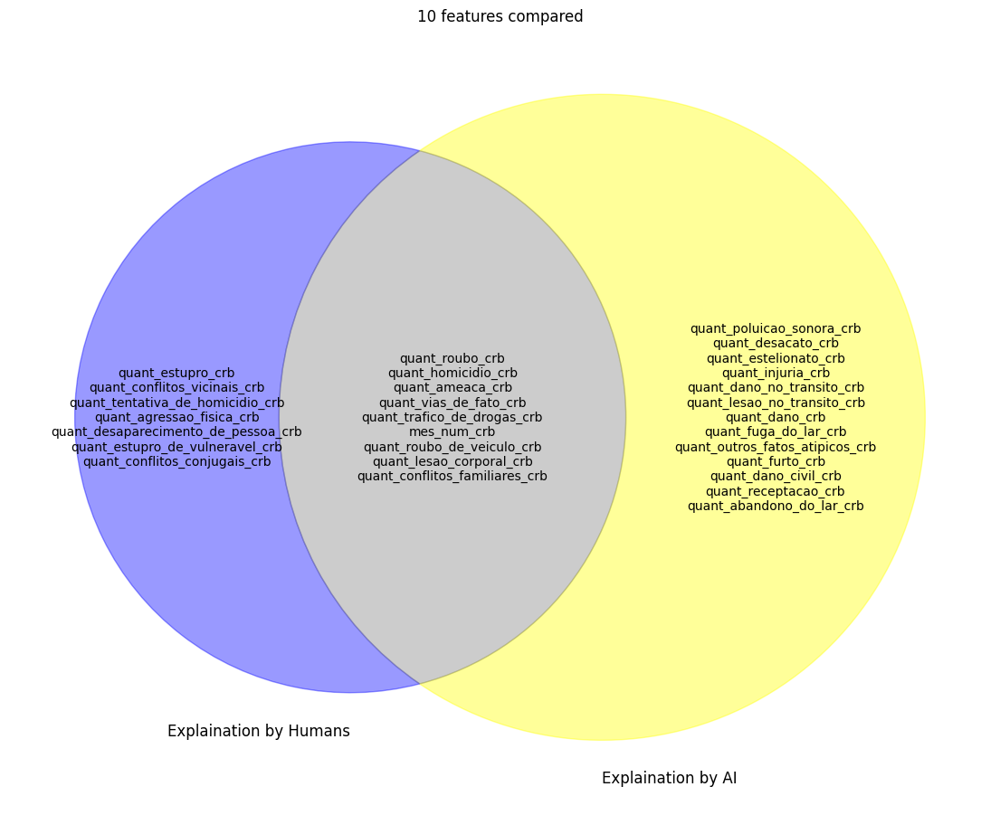




                                            S
att_original_names                           
quant_roubo_crb                          88.0
quant_ameaca_crb                         69.0
quant_lesao_corporal_crb                 68.0
quant_homicidio_crb                      60.0
mes_num_crb                              36.0
quant_tentativa_de_homicidio_crb         35.0
quant_trafico_de_drogas_crb              29.0
quant_estupro_crb                        28.0
quant_vias_de_fato_crb                   24.0
quant_dano_no_transito_crb               23.0
quant_conflitos_familiares_crb           22.0
quant_roubo_de_veiculo_crb               19.0
quant_outros_fatos_atipicos_crb          17.0
quant_agressao_fisica_crb                16.0
quant_conflitos_vicinais_crb             14.0
quant_conflitos_conjugais_crb            14.0
quant_abandono_do_lar_crb                13.0
quant_estupro_de_vulneravel_crb          13.0
quant_desaparecimento_de_pessoa_crb      13.0
quant_furto_crb                

<Figure size 700x800 with 0 Axes>

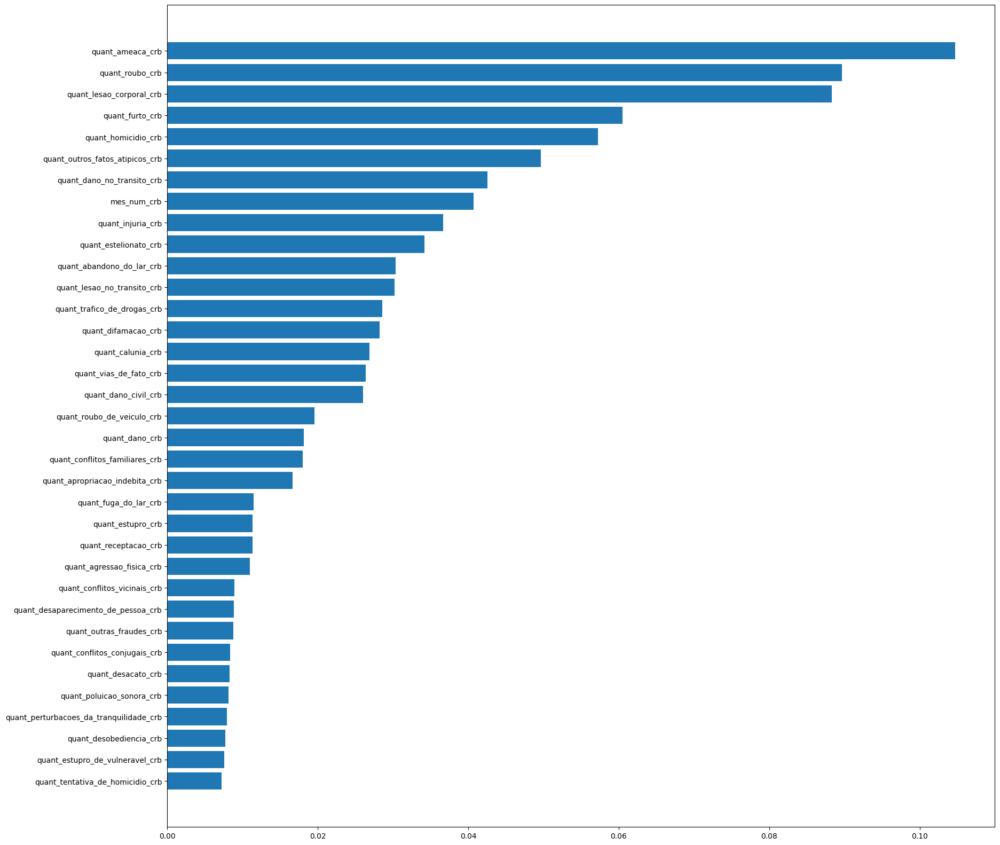

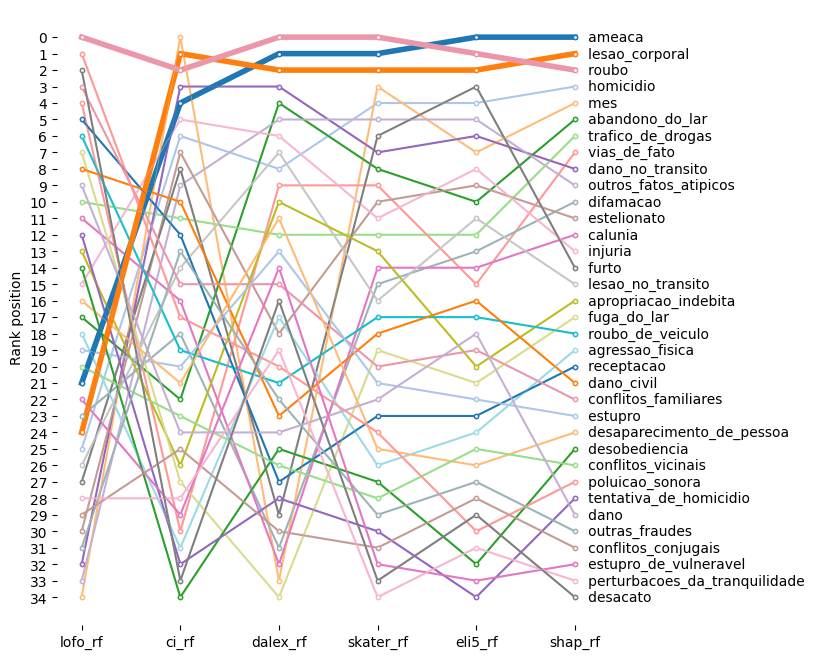

In [ ]:
# Main execution
fold=4
top_n_features = 10

X_train, X_test, y_train, y_test = Util.train_test_split_by_stratified_k_fold(fold,X, Y, skf) # 4 folds index 0,1,2,3
df_feature_rank, model_rf, df_models_info = calcRanks(X_train, X_test, y_train, y_test, X, Y, fold)

main_analysis_by_top(top_n_features)
Util.plotVenn(df_feature_rank,fold)
Util.plotVenns(df_feature_rank,fold)
Util.plotFeatureImportance(model_rf)
Util.saveFigs(df_models_info,fold)

# ConeXi execution
df_features_rank_copy = df_feature_rank.copy()
df_features_rank_copy['weights'] = 1
c = combine.ConeXi(top_n_features)
rank_final, data = c.ExecuteConeXi(df_features_rank_copy)
print(rank_final)
print()
print(data)
# Bump Chart
df_features_rank_copy = df_features_rank_copy.drop(columns=['weights'])
Util.plotBumpChart(df_features_rank_copy,fold)
data.to_csv('rank_intermediante_conexi_fold'+str(fold)+'_.csv')
rank_final.to_csv('rank_final_conexi_fold'+str(fold)+'_.csv')
df_features_rank_copy.to_csv('df_features_rank_fold'+str(fold)+'_.csv')

### Fold 6

Fold selected 5:
     mes_num_crb  quant_lesao_corporal_crb  quant_ameaca_crb  quant_roubo_crb  \
0       0.000000                  0.000000          0.048193         0.002433   
1       0.000000                  0.081633          0.084337         0.124088   
2       0.000000                  0.000000          0.132530         0.063260   
3       0.000000                  0.183673          0.168675         0.141119   
4       0.000000                  0.040816          0.012048         0.017032   
..           ...                       ...               ...              ...   
133     0.090909                  0.122449          0.240964         0.197080   
134     0.090909                  0.102041          0.024096         0.099757   
135     0.090909                  0.367347          0.385542         0.635036   
136     0.090909                  0.163265          0.204819         0.484185   
137     0.090909                  0.000000          0.012048         0.002433   

     quant

  0%|          | 0/35 [00:00<?, ?it/s]

Explanation by Human 1....
Explanation by Human 2....
Explanation by Human 3....
Explanation by Human 4....
Explanation by Human 5....
Explanation by Human 6....


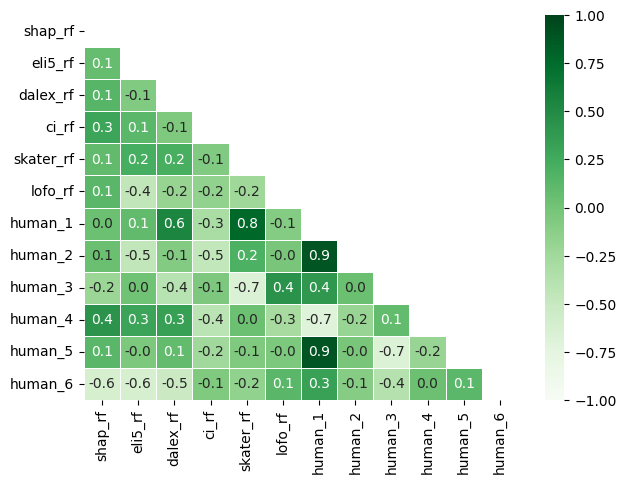

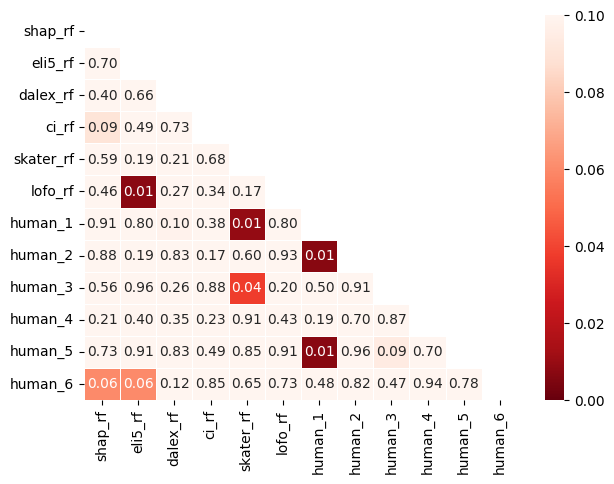

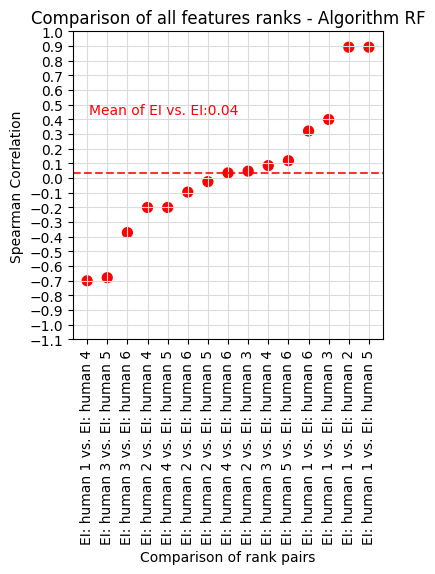

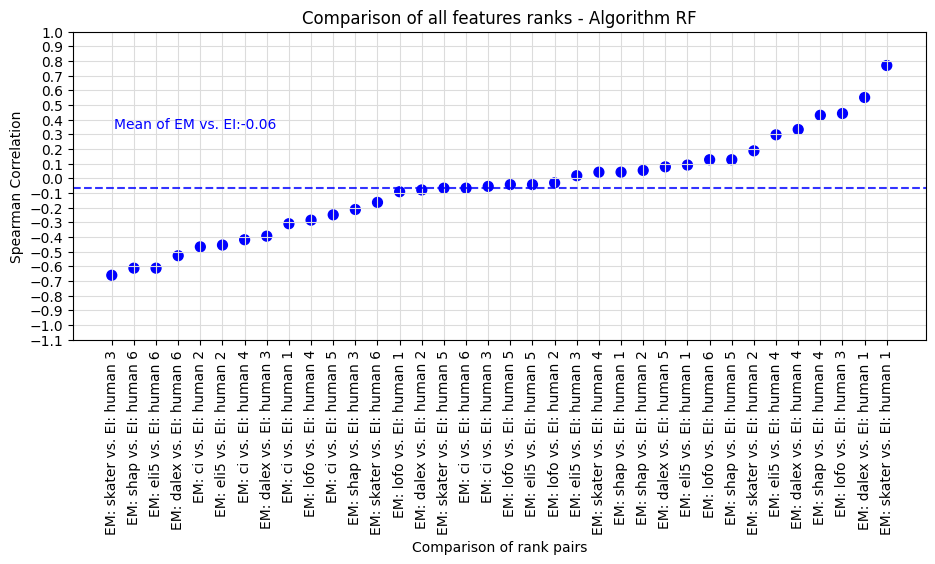

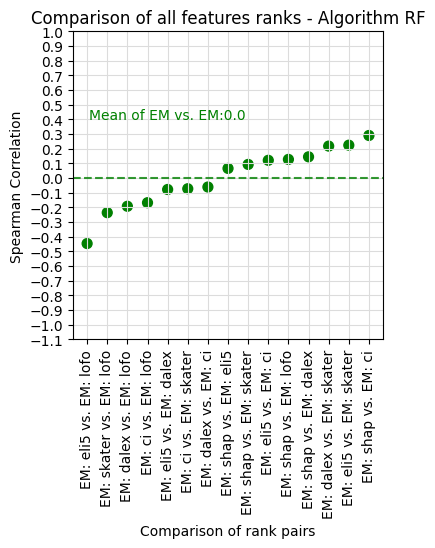

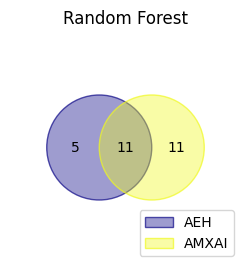

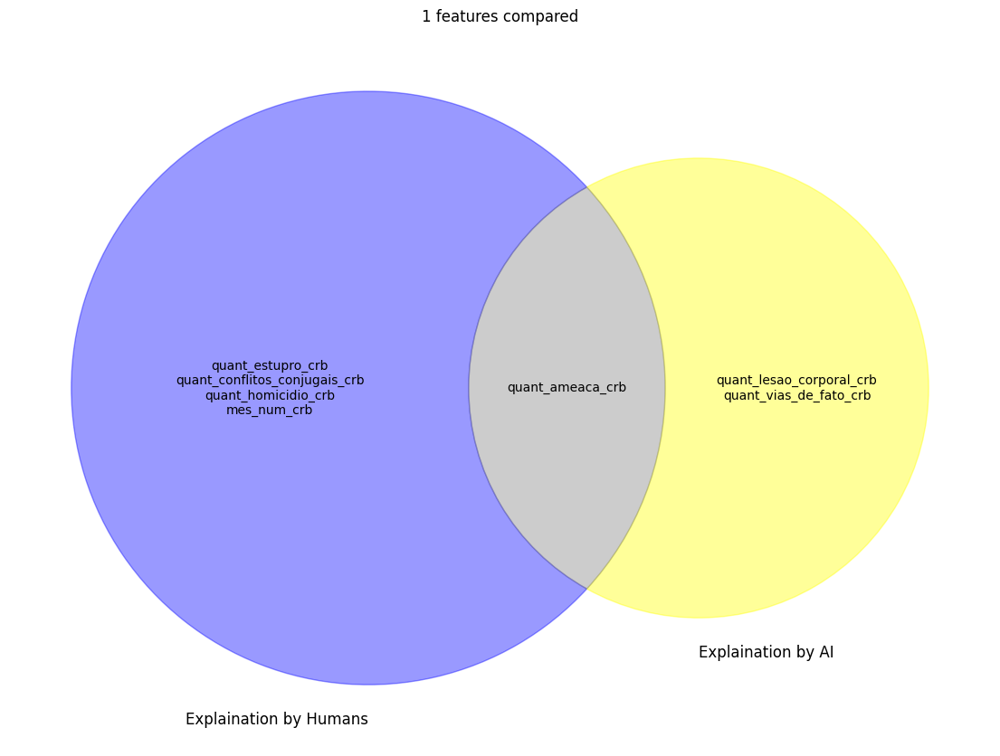

<Figure size 700x800 with 0 Axes>

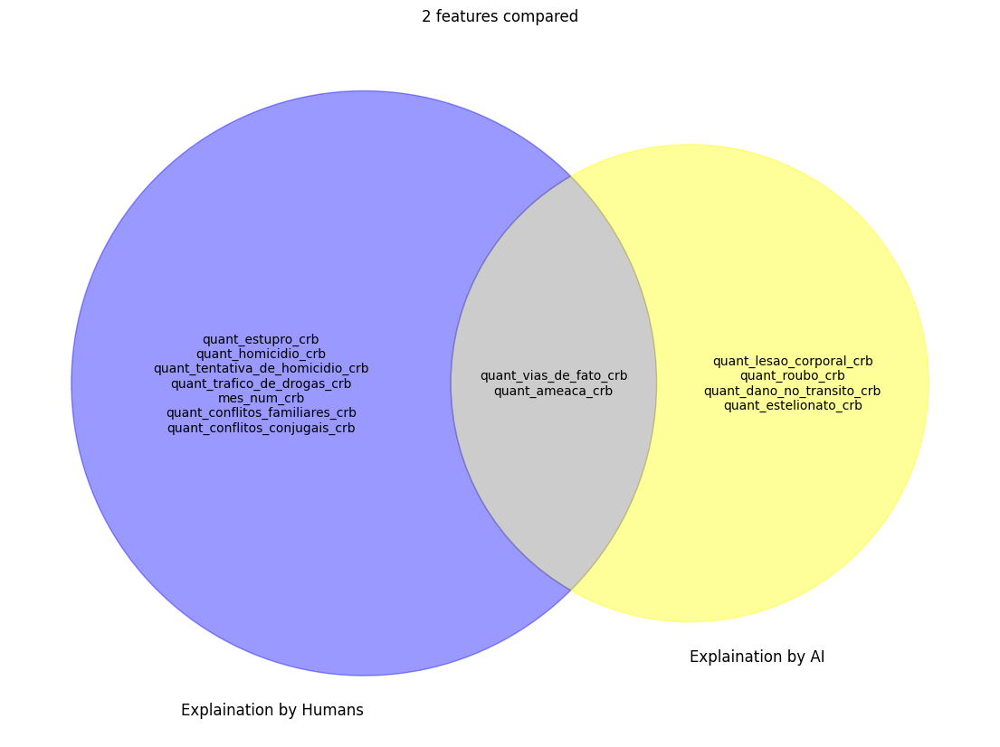

<Figure size 700x800 with 0 Axes>

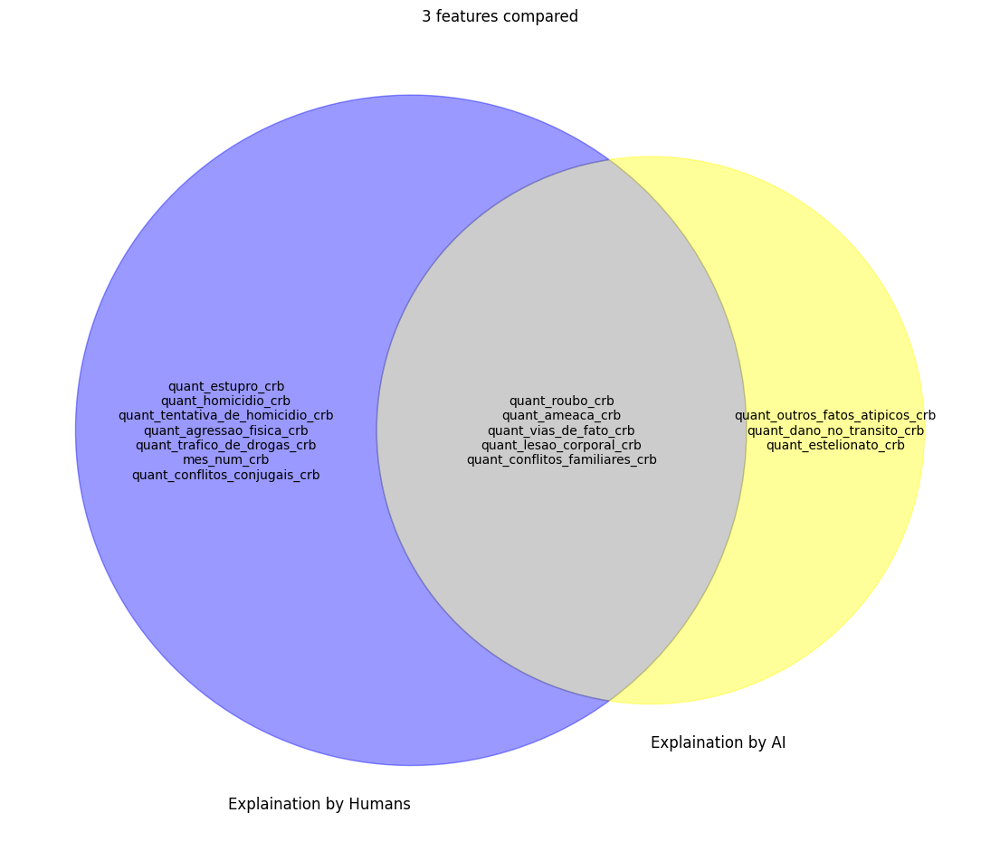

<Figure size 700x800 with 0 Axes>

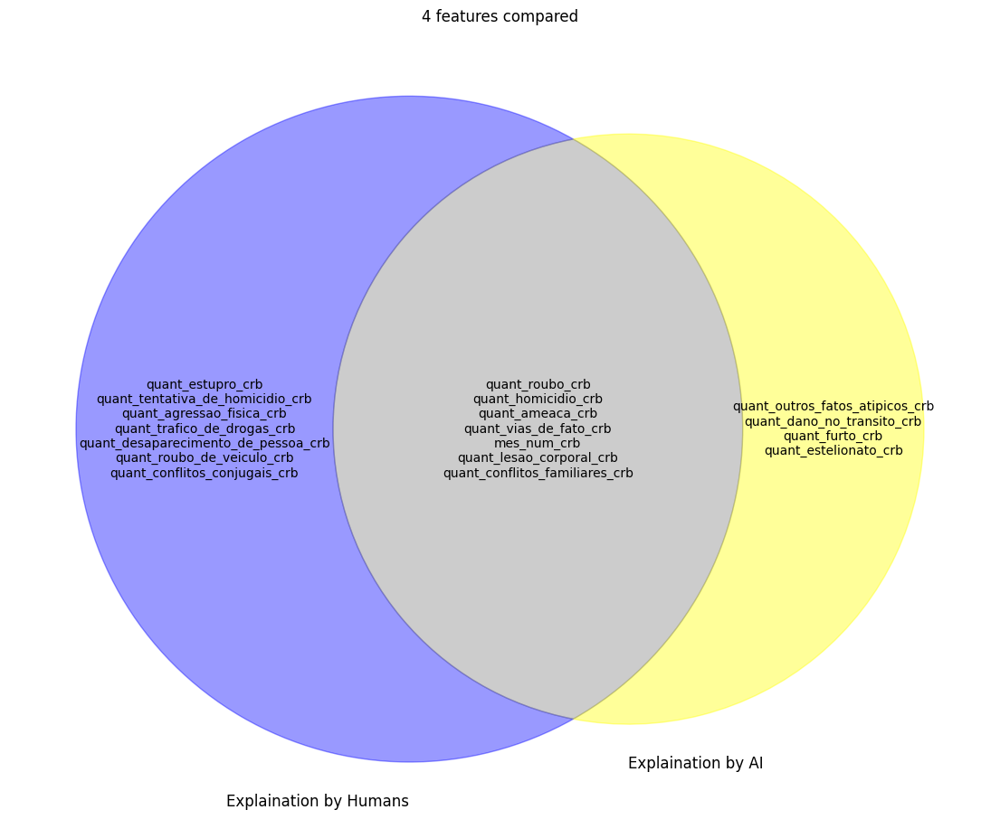

<Figure size 700x800 with 0 Axes>

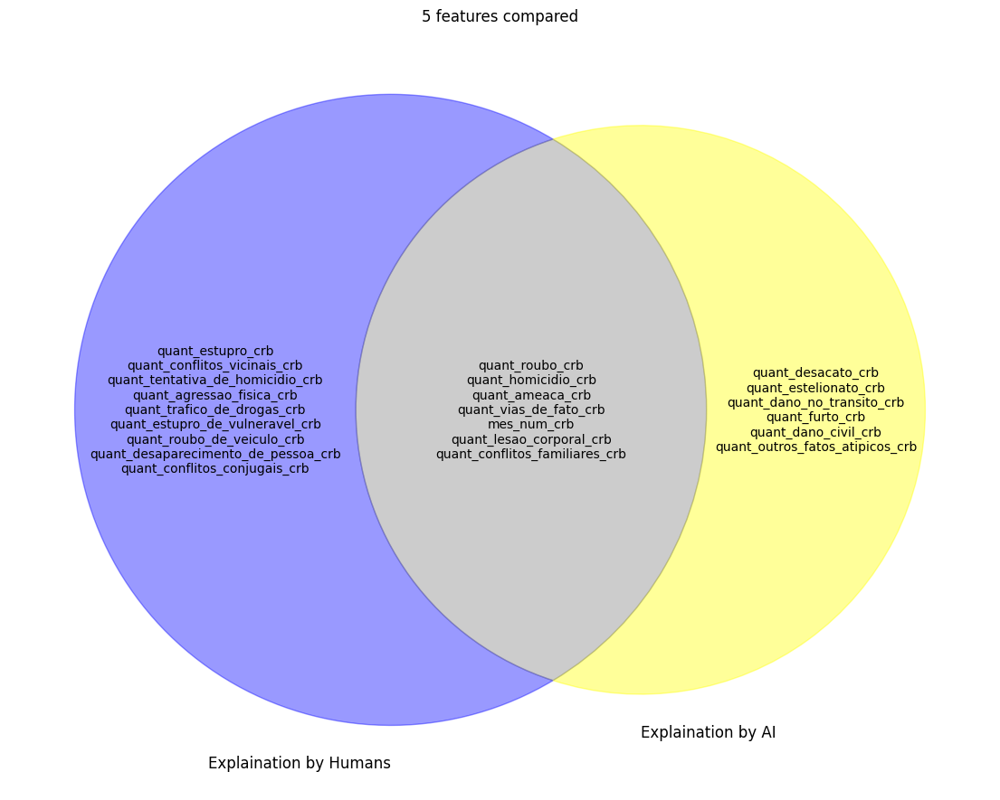

<Figure size 700x800 with 0 Axes>

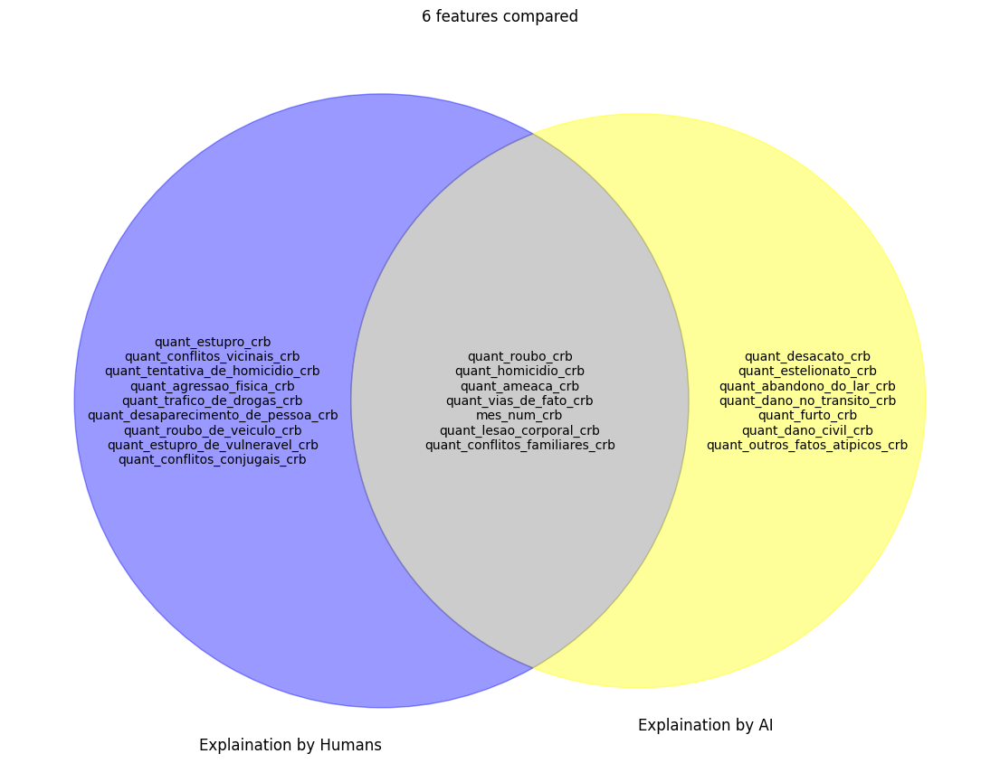

<Figure size 700x800 with 0 Axes>

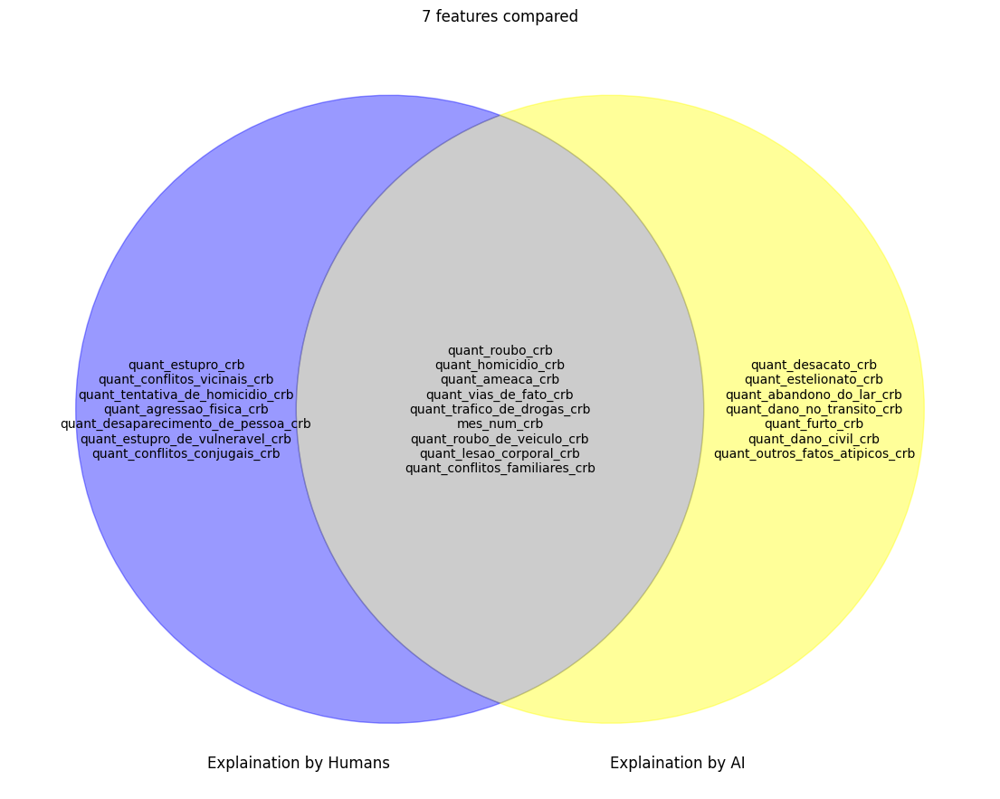

<Figure size 700x800 with 0 Axes>

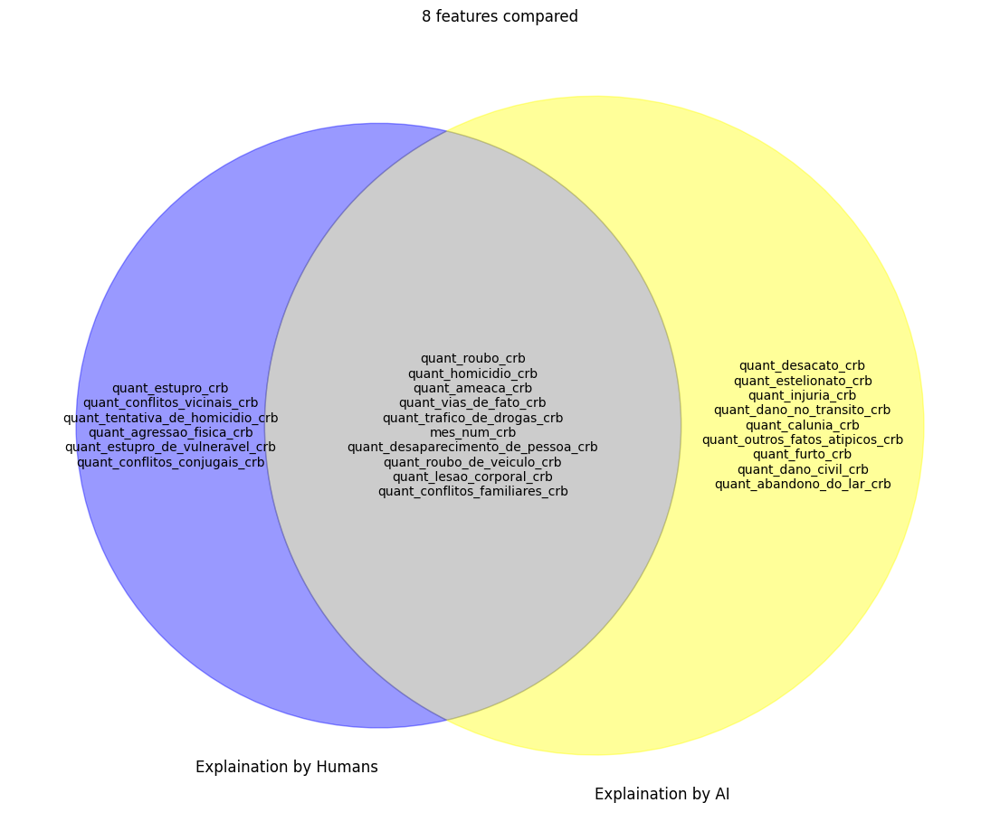

<Figure size 700x800 with 0 Axes>

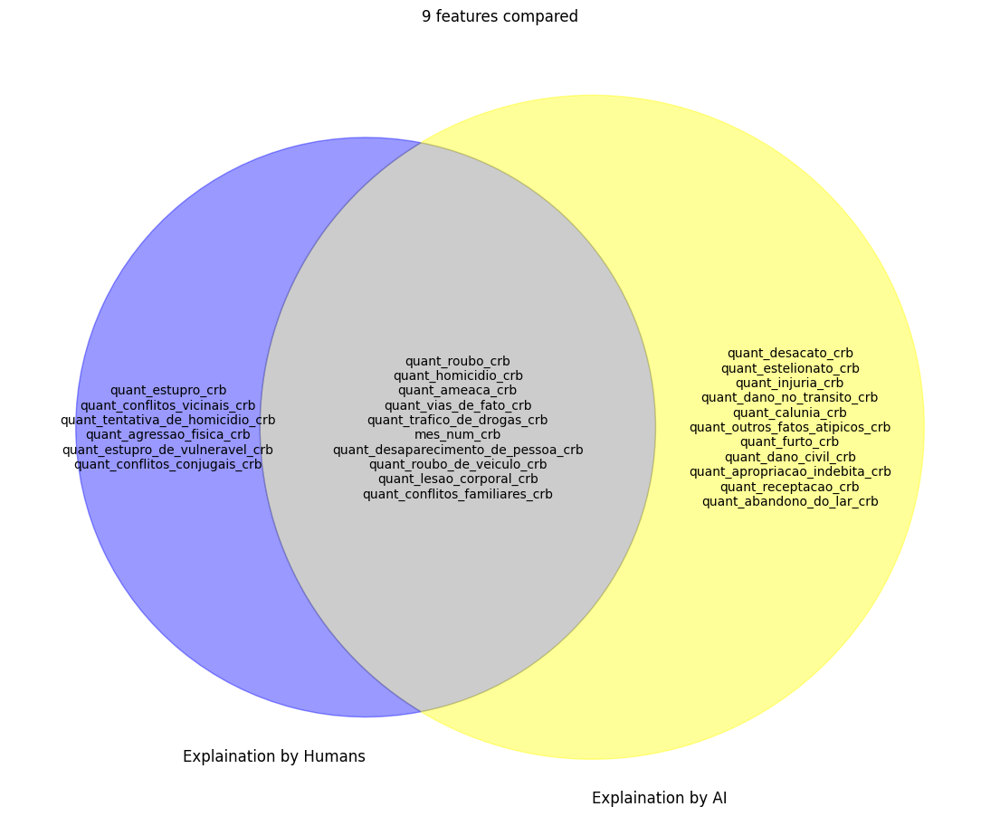

<Figure size 700x800 with 0 Axes>

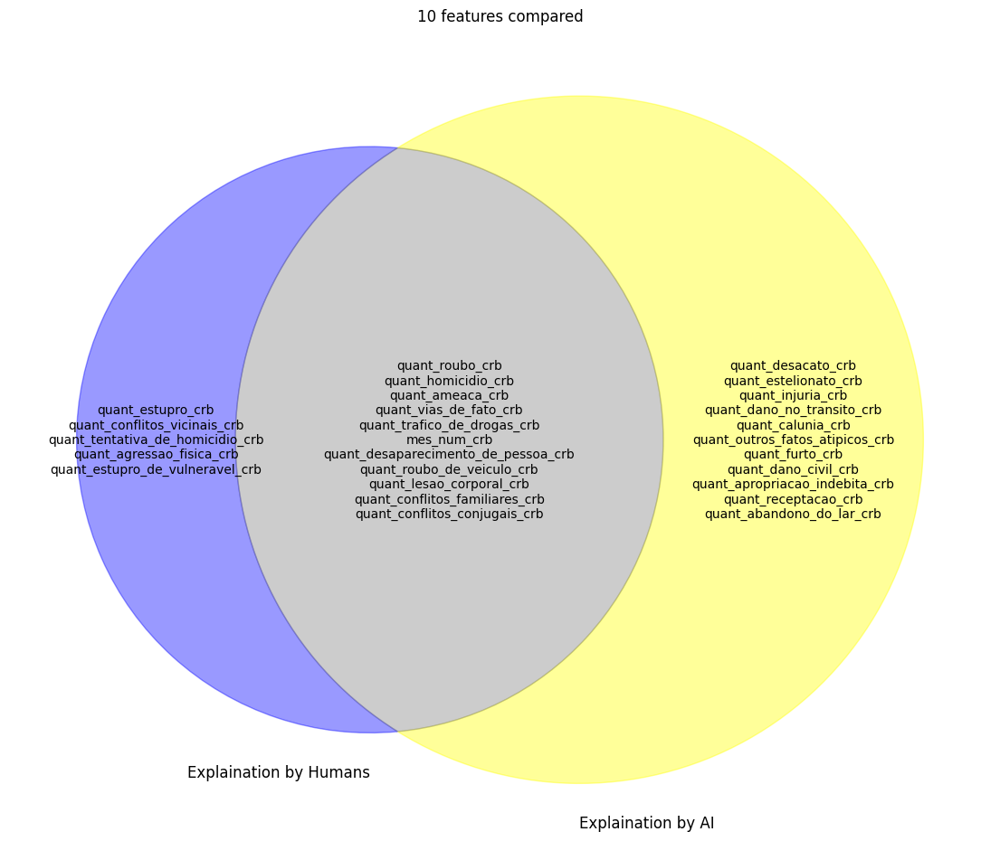




                                            S
att_original_names                           
quant_roubo_crb                          75.0
quant_ameaca_crb                         72.0
quant_lesao_corporal_crb                 69.0
quant_homicidio_crb                      66.0
quant_tentativa_de_homicidio_crb         35.0
quant_trafico_de_drogas_crb              29.0
quant_estupro_crb                        28.0
quant_conflitos_familiares_crb           28.0
quant_dano_no_transito_crb               25.0
quant_vias_de_fato_crb                   25.0
quant_outros_fatos_atipicos_crb          25.0
quant_roubo_de_veiculo_crb               19.0
mes_num_crb                              19.0
quant_desaparecimento_de_pessoa_crb      16.0
quant_agressao_fisica_crb                16.0
quant_furto_crb                          16.0
quant_conflitos_conjugais_crb            15.0
quant_conflitos_vicinais_crb             14.0
quant_estupro_de_vulneravel_crb          13.0
quant_estelionato_crb          

<Figure size 700x800 with 0 Axes>

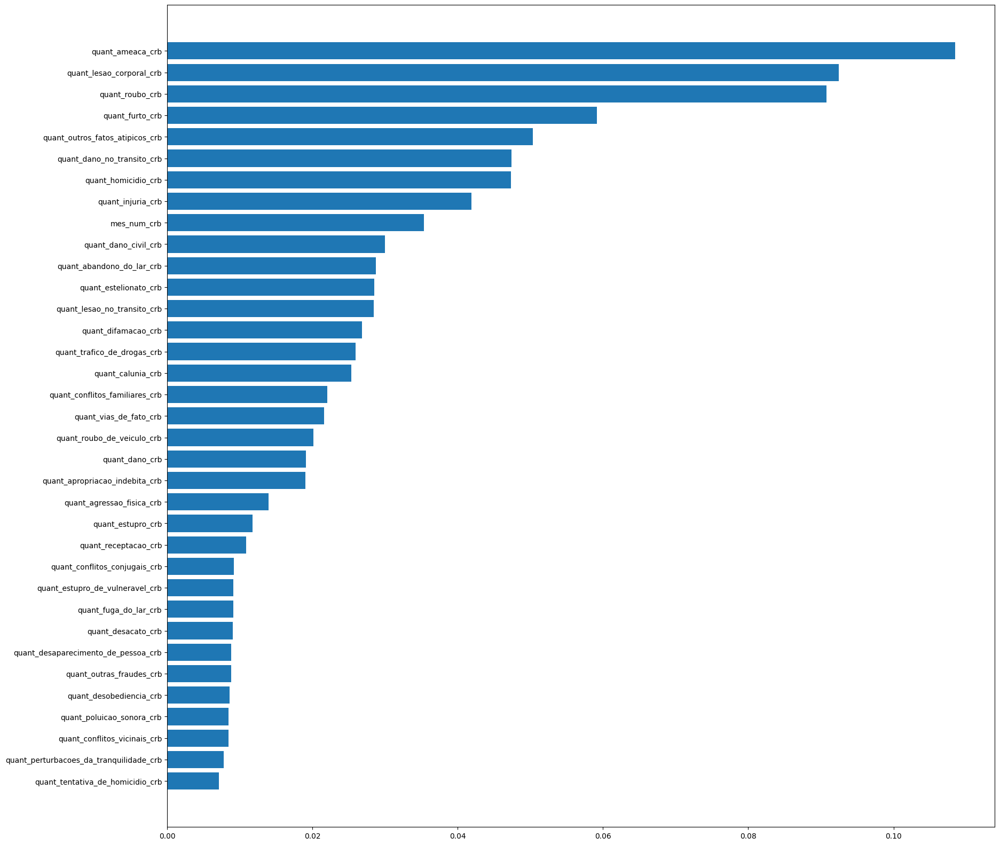

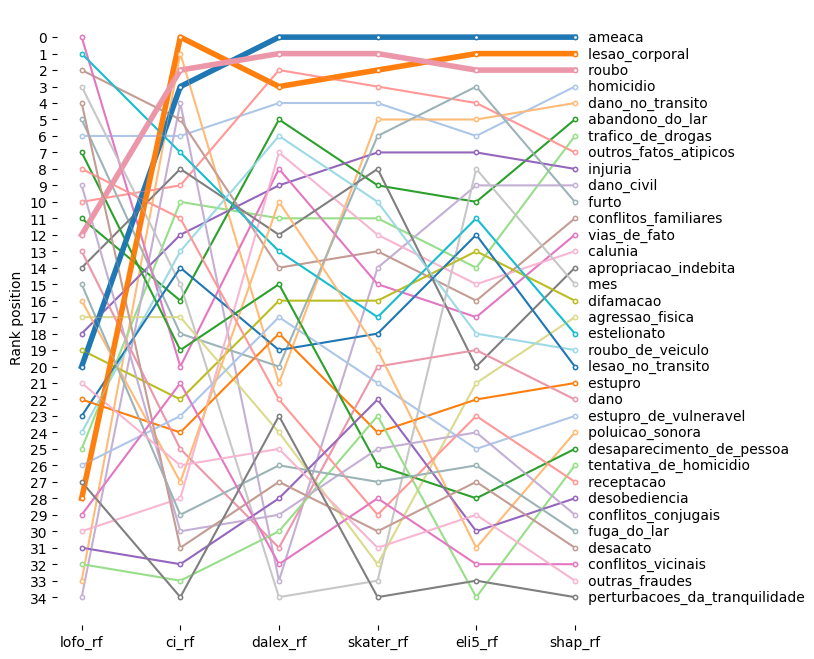

In [ ]:
# Main execution
fold=5
top_n_features = 10

X_train, X_test, y_train, y_test = Util.train_test_split_by_stratified_k_fold(fold,X, Y, skf) # 4 folds index 0,1,2,3
df_feature_rank, model_rf, df_models_info = calcRanks(X_train, X_test, y_train, y_test, X, Y, fold)

main_analysis_by_top(top_n_features)
Util.plotVenn(df_feature_rank,fold)
Util.plotVenns(df_feature_rank,fold)
Util.plotFeatureImportance(model_rf)
Util.saveFigs(df_models_info,fold)

# ConeXi execution
df_features_rank_copy = df_feature_rank.copy()
df_features_rank_copy['weights'] = 1
c = combine.ConeXi(top_n_features)
rank_final, data = c.ExecuteConeXi(df_features_rank_copy)
print(rank_final)
print()
print(data)
# Bump Chart
df_features_rank_copy = df_features_rank_copy.drop(columns=['weights'])
Util.plotBumpChart(df_features_rank_copy,fold)
data.to_csv('rank_intermediante_conexi_fold'+str(fold)+'_.csv')
rank_final.to_csv('rank_final_conexi_fold'+str(fold)+'_.csv')
df_features_rank_copy.to_csv('df_features_rank_fold'+str(fold)+'_.csv')

### Fold 7

Fold selected 6:
     mes_num_crb  quant_lesao_corporal_crb  quant_ameaca_crb  quant_roubo_crb  \
0       0.000000                  0.000000          0.048193         0.002433   
1       0.000000                  0.081633          0.084337         0.124088   
2       0.000000                  0.000000          0.132530         0.063260   
3       0.000000                  0.183673          0.168675         0.141119   
4       0.000000                  0.040816          0.012048         0.017032   
..           ...                       ...               ...              ...   
133     0.090909                  0.122449          0.240964         0.197080   
134     0.090909                  0.102041          0.024096         0.099757   
135     0.090909                  0.367347          0.385542         0.635036   
136     0.090909                  0.163265          0.204819         0.484185   
137     0.090909                  0.000000          0.012048         0.002433   

     quant

  0%|          | 0/35 [00:00<?, ?it/s]

Explanation by Human 1....
Explanation by Human 2....
Explanation by Human 3....
Explanation by Human 4....
Explanation by Human 5....
Explanation by Human 6....


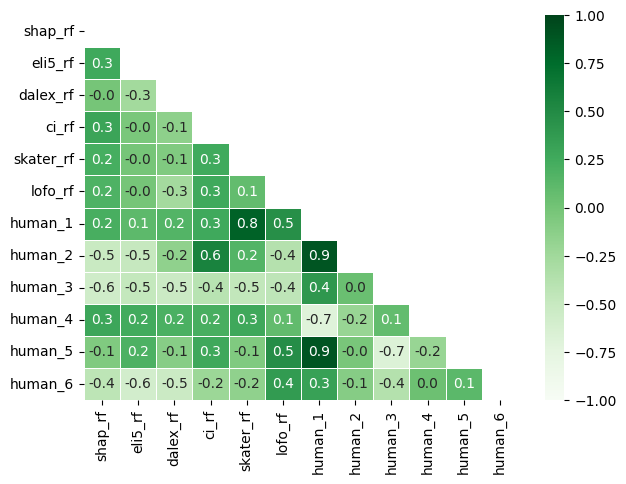

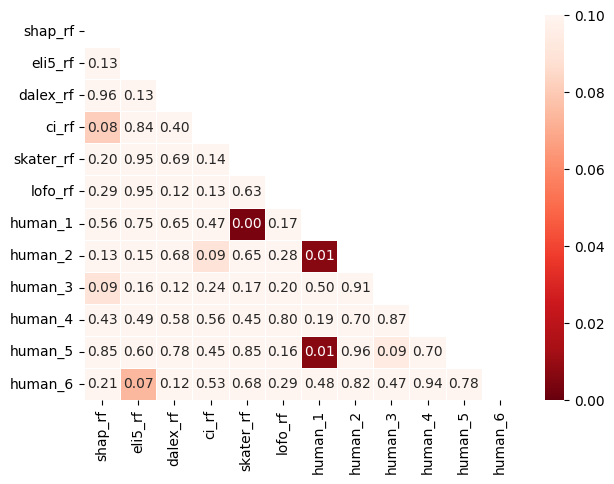

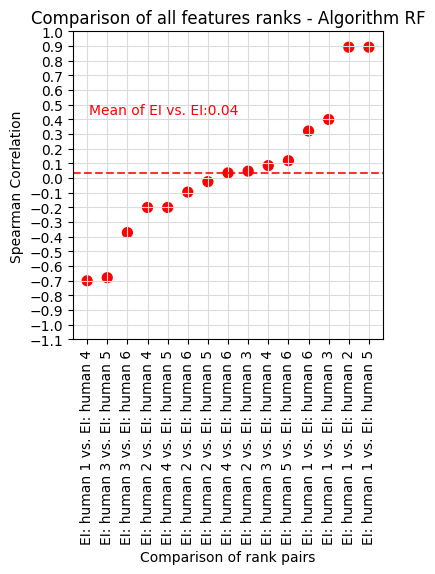

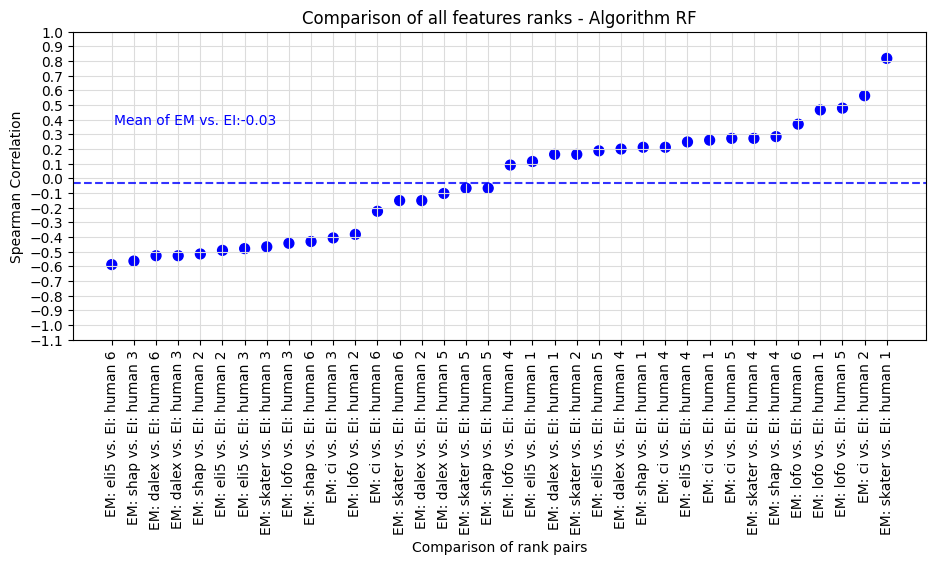

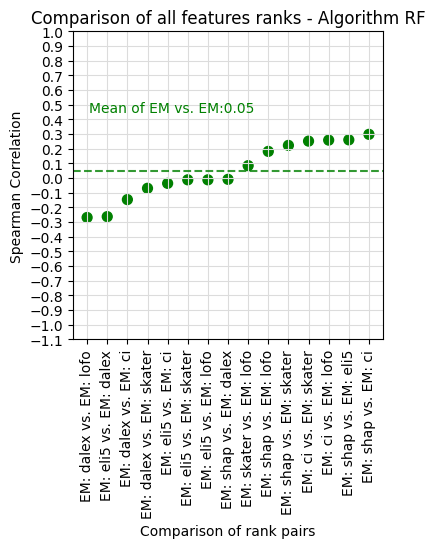

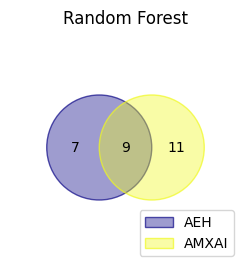

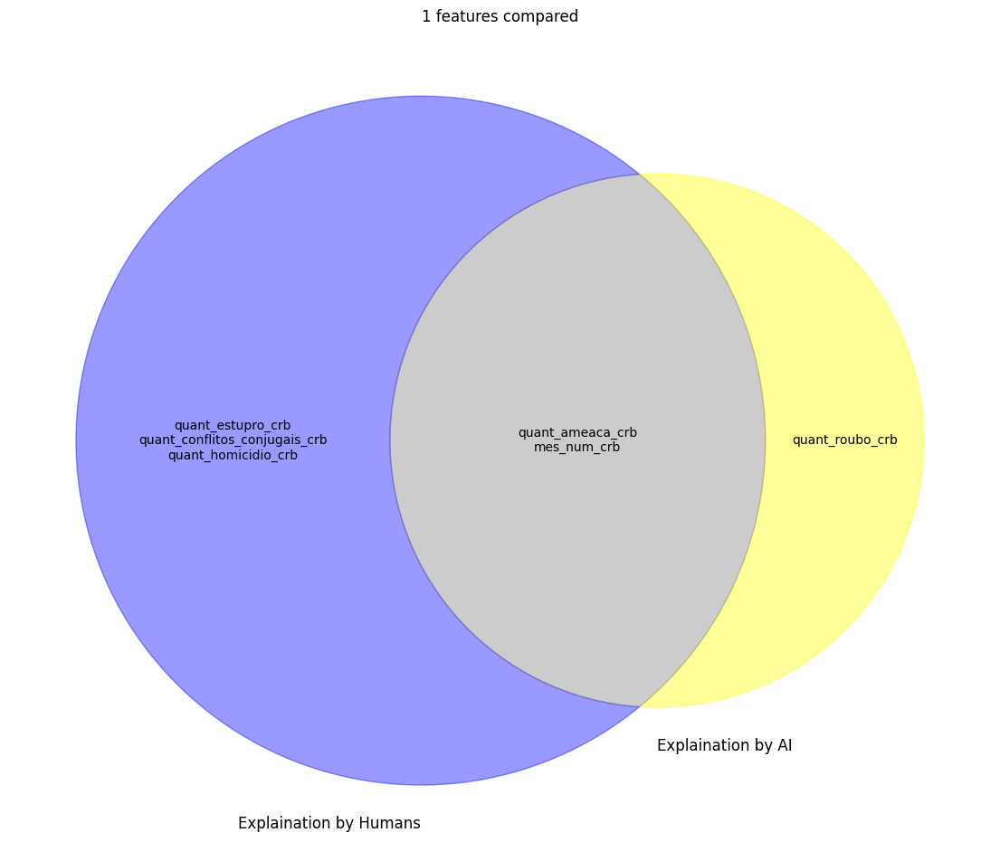

<Figure size 700x800 with 0 Axes>

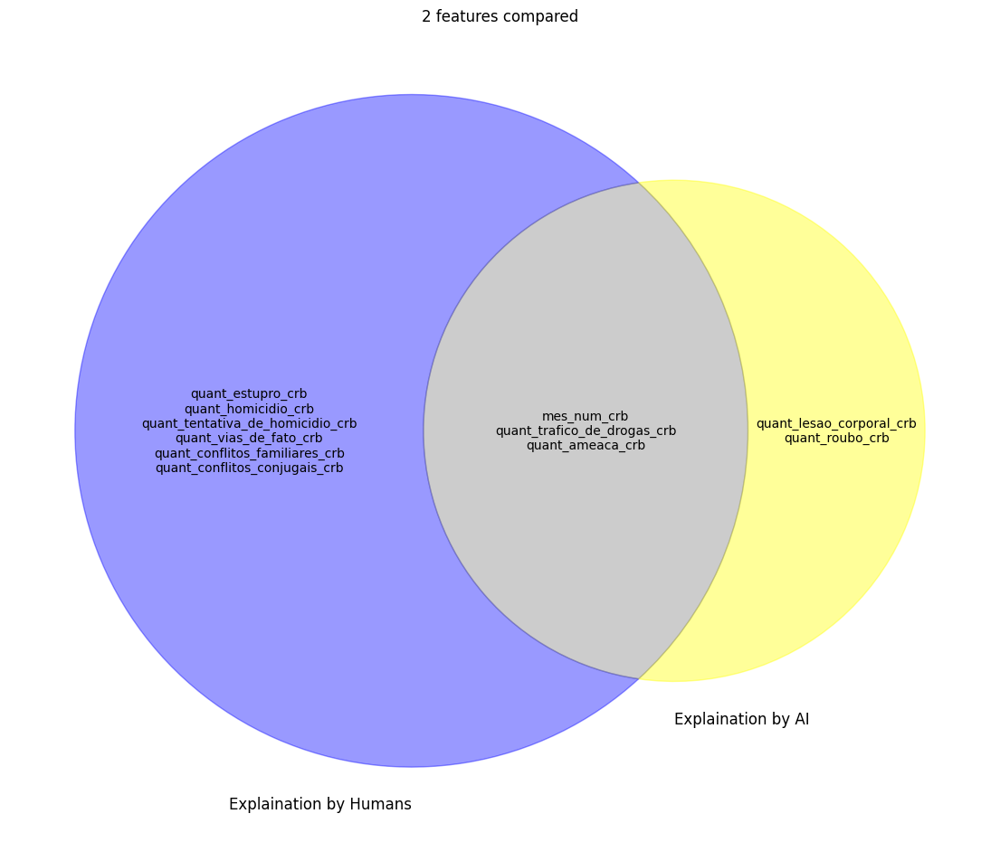

<Figure size 700x800 with 0 Axes>

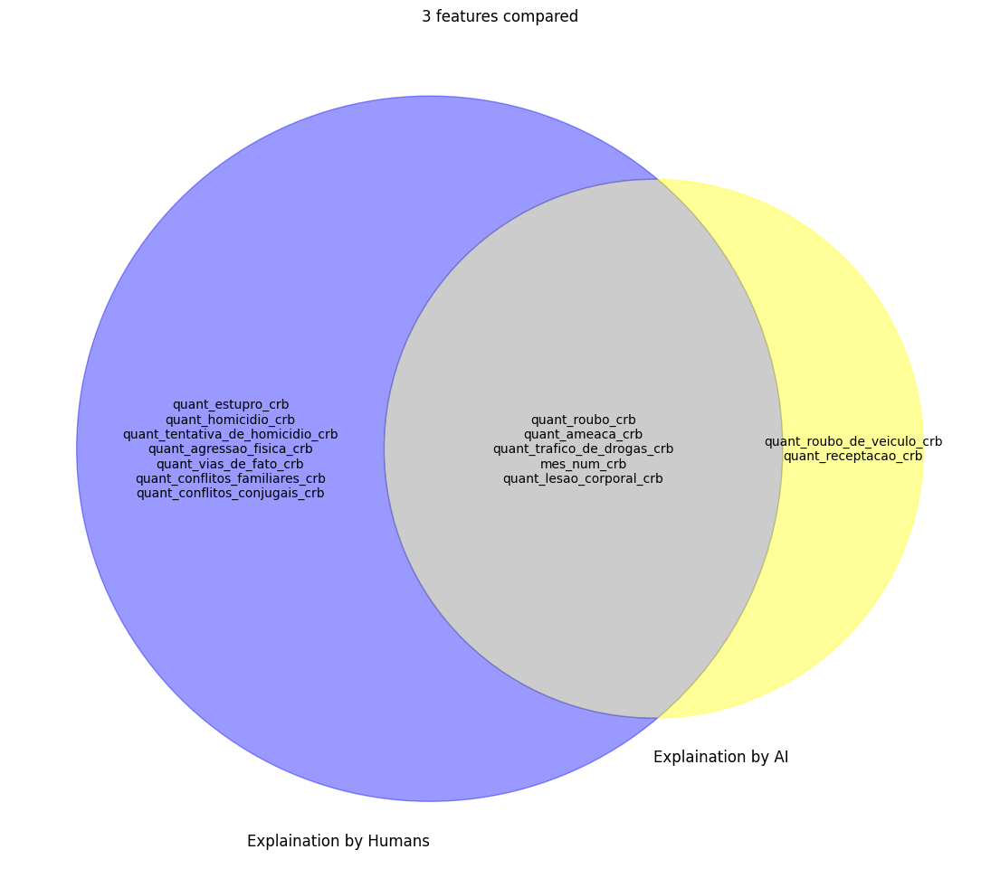

<Figure size 700x800 with 0 Axes>

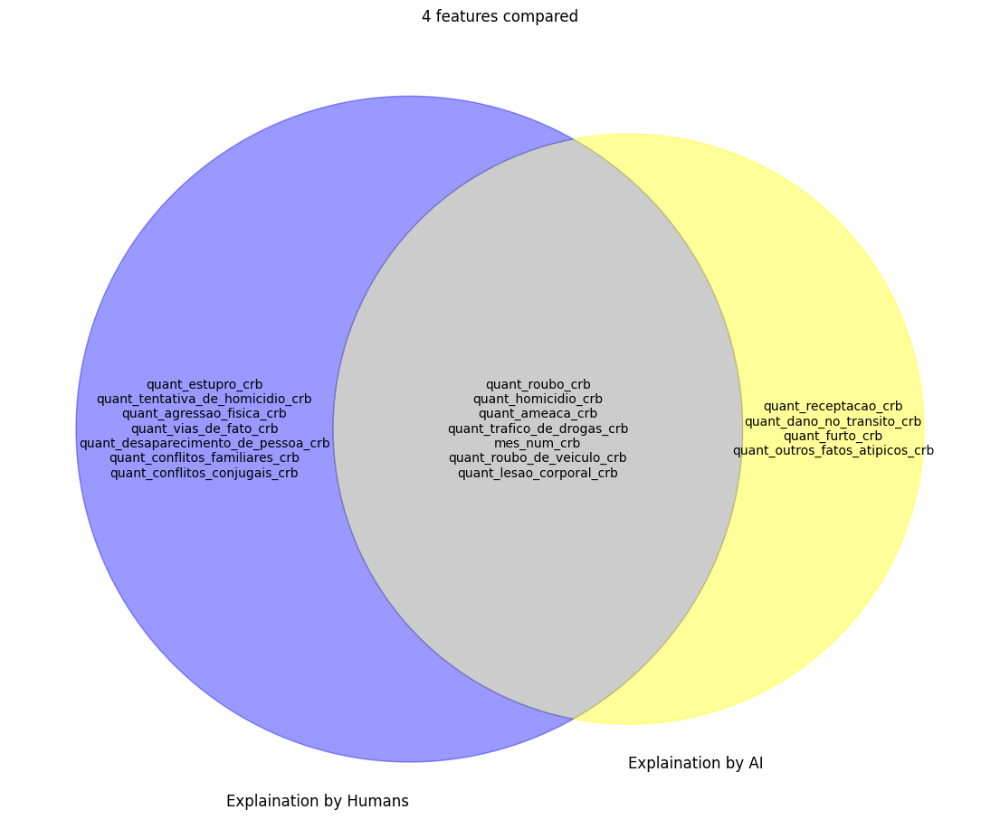

<Figure size 700x800 with 0 Axes>

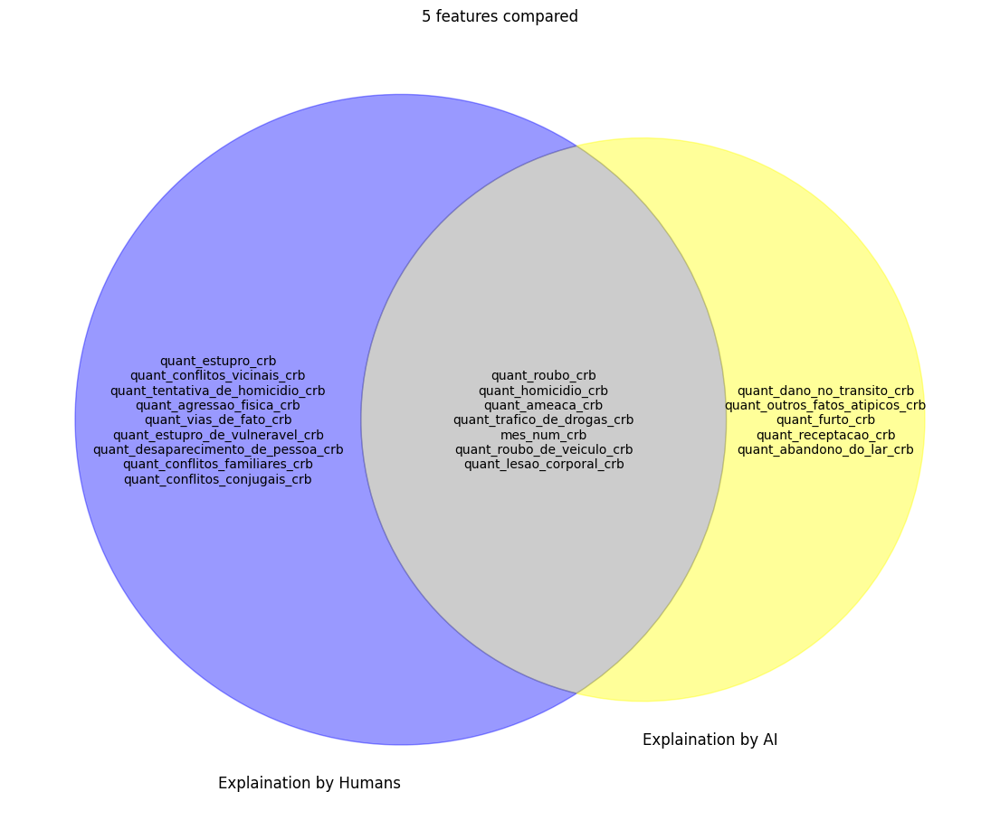

<Figure size 700x800 with 0 Axes>

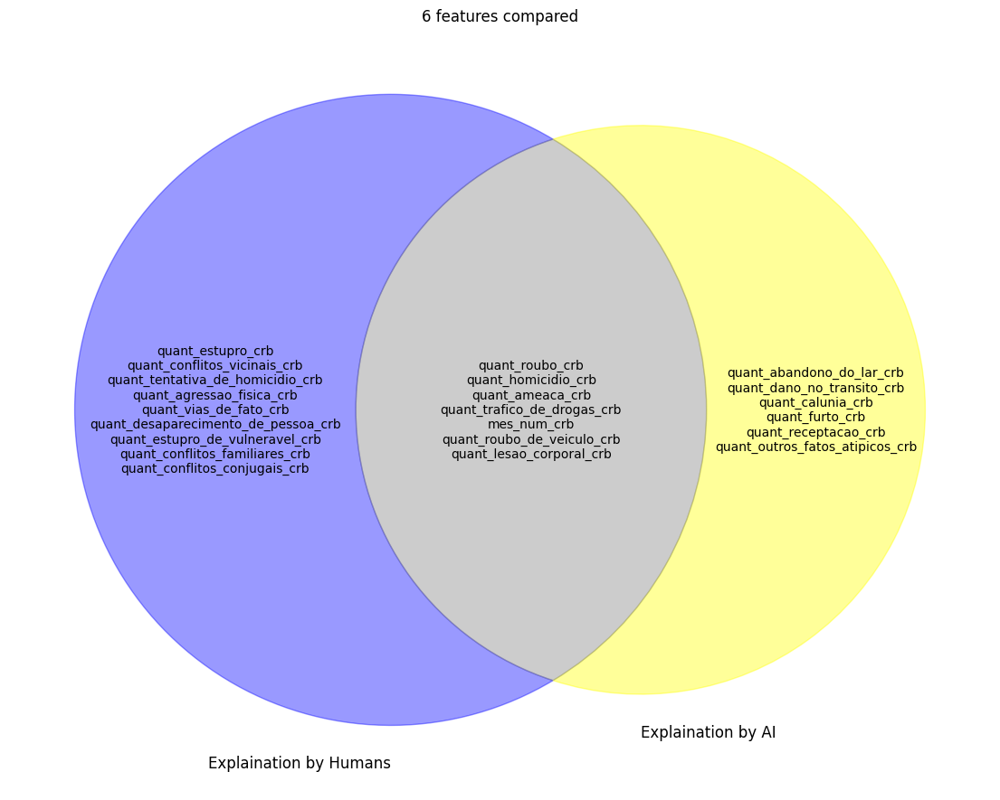

<Figure size 700x800 with 0 Axes>

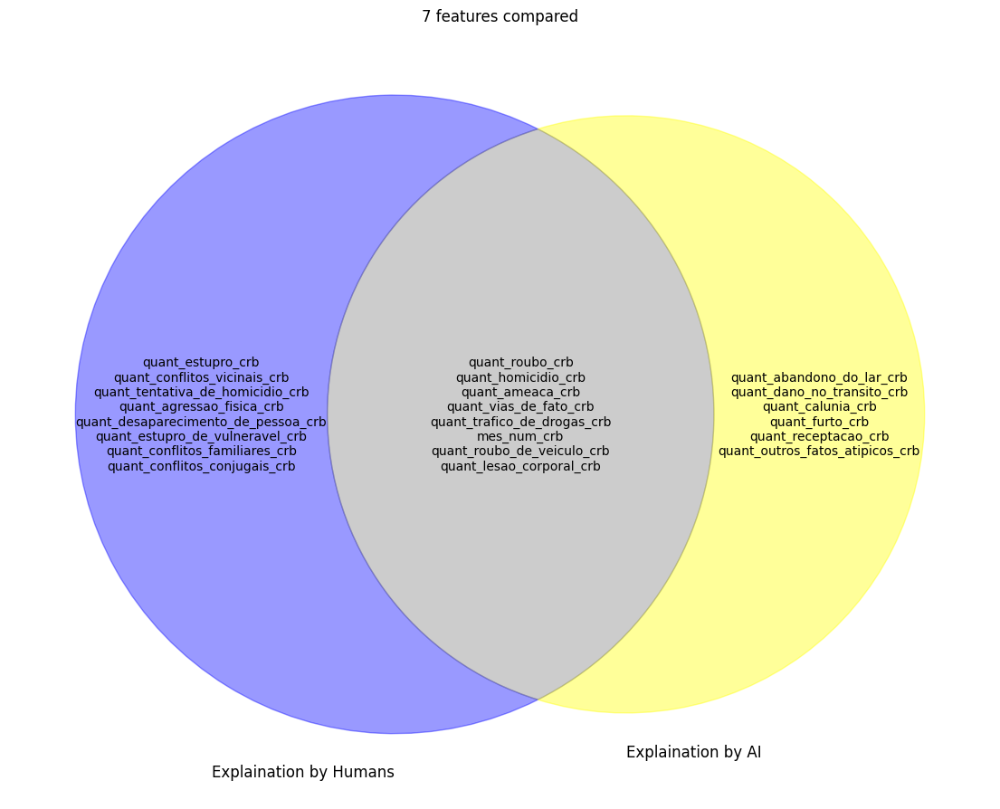

<Figure size 700x800 with 0 Axes>

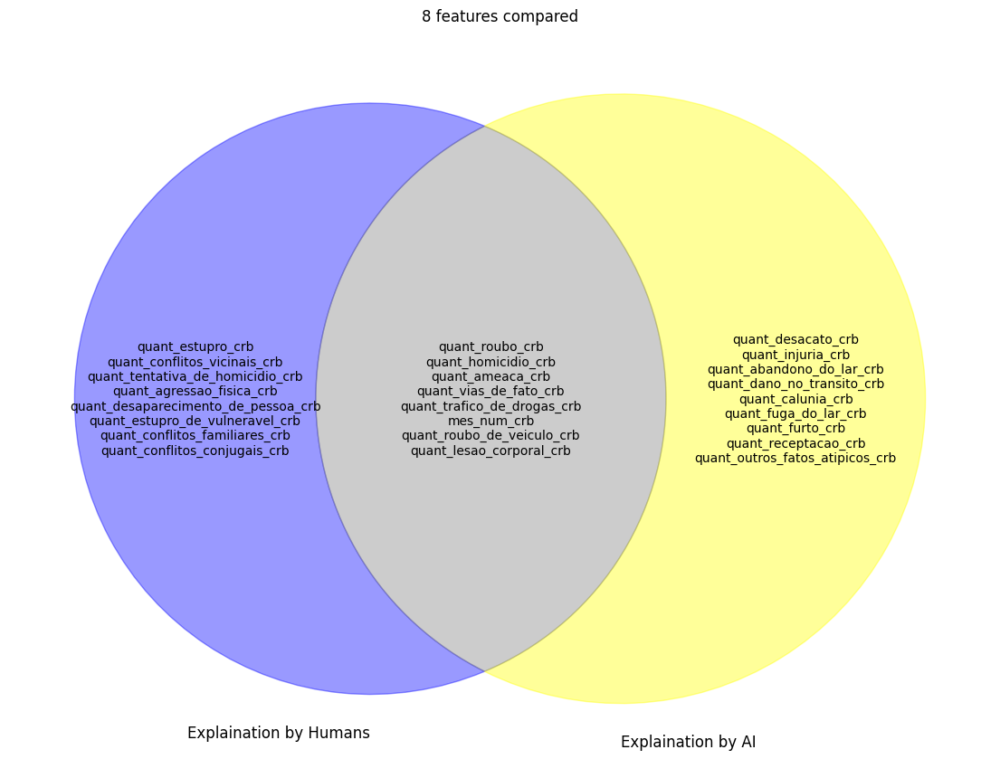

<Figure size 700x800 with 0 Axes>

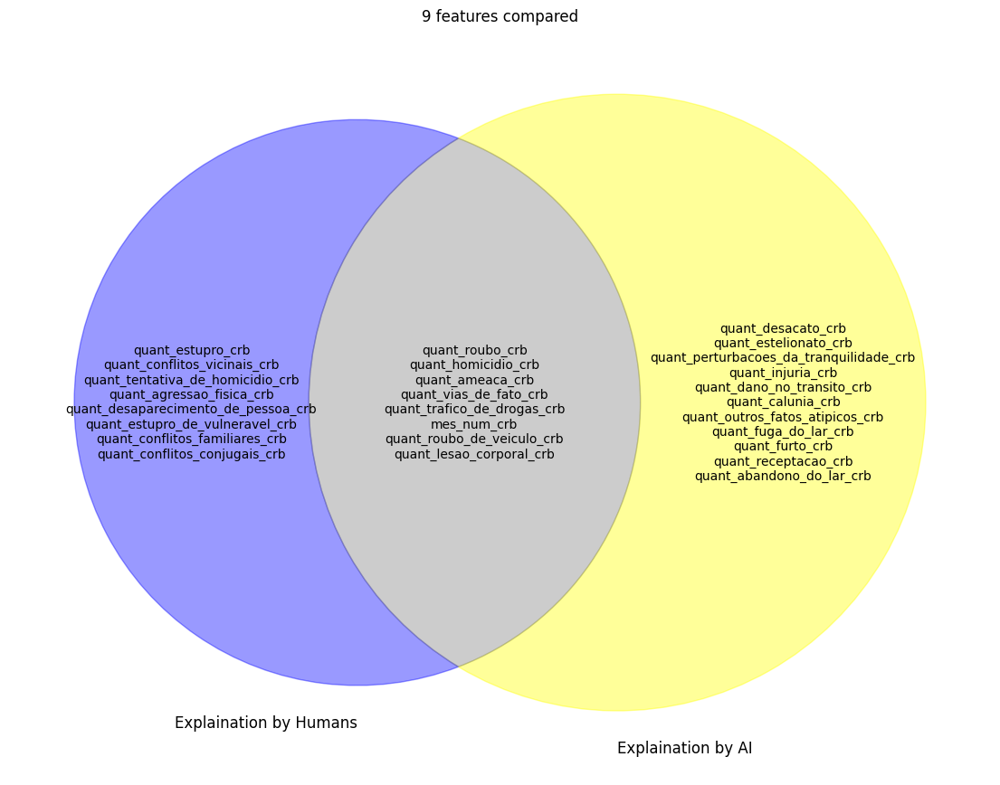

<Figure size 700x800 with 0 Axes>

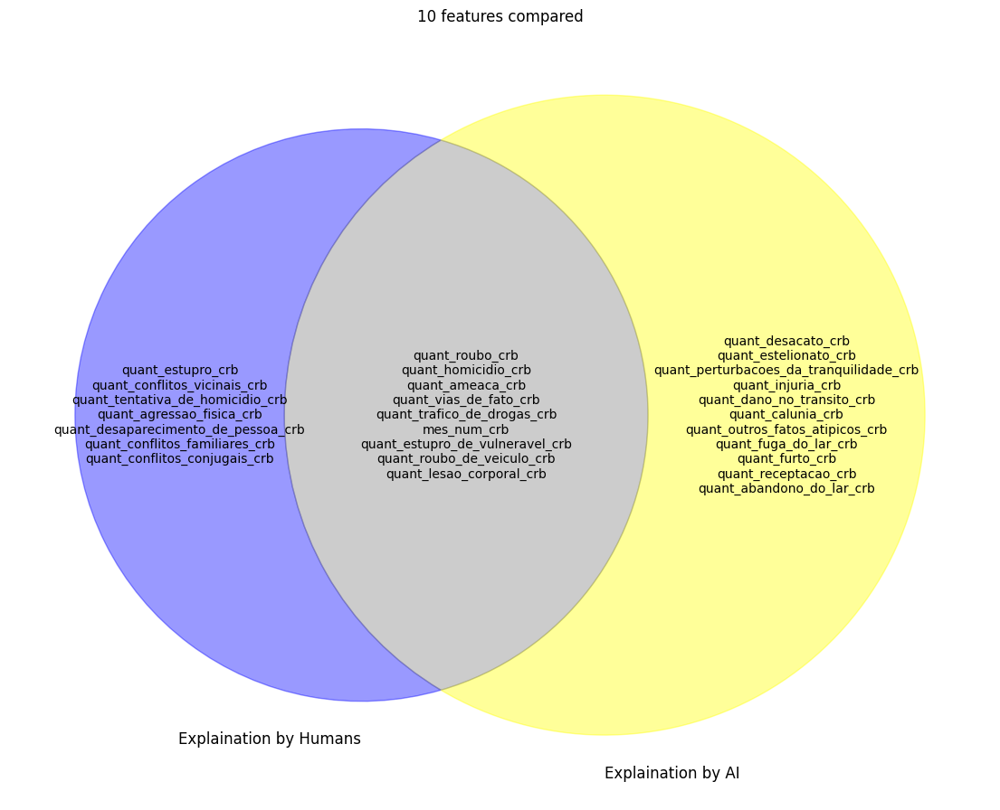




                                            S
att_original_names                           
quant_roubo_crb                          78.0
quant_ameaca_crb                         74.0
quant_lesao_corporal_crb                 73.0
quant_homicidio_crb                      67.0
quant_trafico_de_drogas_crb              40.0
quant_tentativa_de_homicidio_crb         35.0
quant_roubo_de_veiculo_crb               29.0
quant_estupro_crb                        28.0
quant_outros_fatos_atipicos_crb          27.0
quant_vias_de_fato_crb                   22.0
quant_dano_no_transito_crb               22.0
mes_num_crb                              20.0
quant_abandono_do_lar_crb                16.0
quant_agressao_fisica_crb                16.0
quant_conflitos_familiares_crb           15.0
quant_conflitos_conjugais_crb            14.0
quant_estupro_de_vulneravel_crb          14.0
quant_conflitos_vicinais_crb             14.0
quant_desaparecimento_de_pessoa_crb      13.0
quant_furto_crb                

<Figure size 700x800 with 0 Axes>

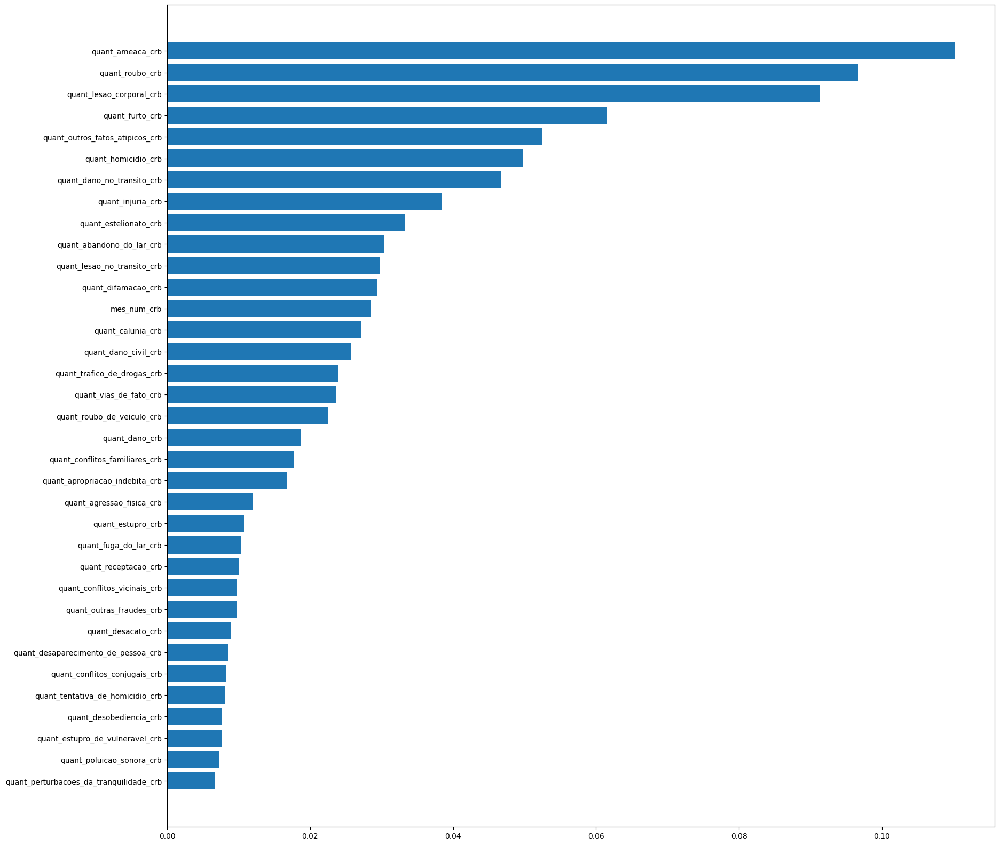

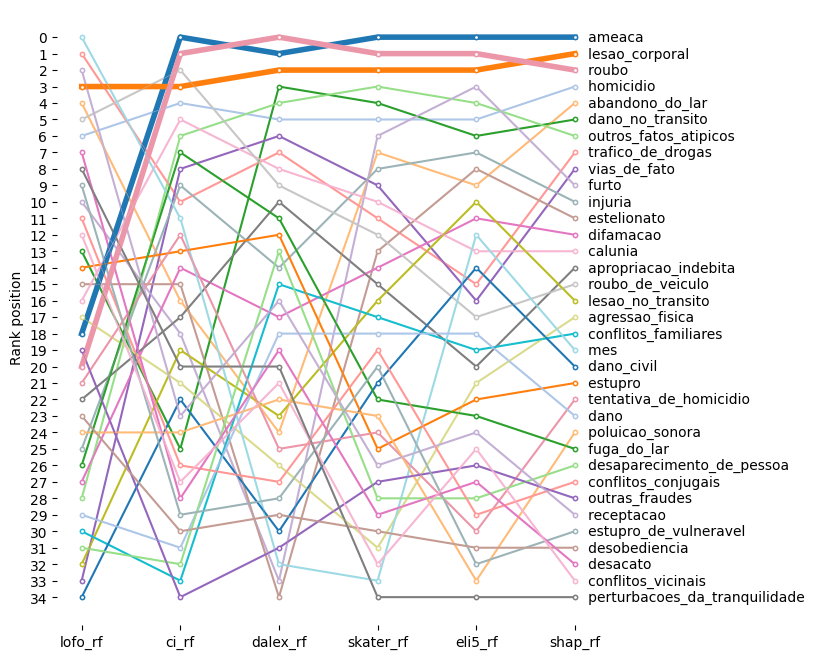

In [ ]:
# Main execution
fold=6
top_n_features = 10

X_train, X_test, y_train, y_test = Util.train_test_split_by_stratified_k_fold(fold,X, Y, skf) # 4 folds index 0,1,2,3
df_feature_rank, model_rf, df_models_info = calcRanks(X_train, X_test, y_train, y_test, X, Y, fold)

main_analysis_by_top(top_n_features)
Util.plotVenn(df_feature_rank,fold)
Util.plotVenns(df_feature_rank,fold)
Util.plotFeatureImportance(model_rf)
Util.saveFigs(df_models_info,fold)

# ConeXi execution
df_features_rank_copy = df_feature_rank.copy()
df_features_rank_copy['weights'] = 1
c = combine.ConeXi(top_n_features)
rank_final, data = c.ExecuteConeXi(df_features_rank_copy)
print(rank_final)
print()
print(data)
# Bump Chart
df_features_rank_copy = df_features_rank_copy.drop(columns=['weights'])
Util.plotBumpChart(df_features_rank_copy,fold)
data.to_csv('rank_intermediante_conexi_fold'+str(fold)+'_.csv')
rank_final.to_csv('rank_final_conexi_fold'+str(fold)+'_.csv')
df_features_rank_copy.to_csv('df_features_rank_fold'+str(fold)+'_.csv')

# Download workspace

In [ ]:
!zip -r '/content/workspace_xai_pred2town.zip' /content
if do_download_files:
  files.download('/content/workspace_xai_pred2town.zip')

  adding: content/ (stored 0%)
  adding: content/.config/ (stored 0%)
  adding: content/.config/.last_opt_in_prompt.yaml (stored 0%)
  adding: content/.config/gce (stored 0%)
  adding: content/.config/logs/ (stored 0%)
  adding: content/.config/logs/2023.09.21/ (stored 0%)
  adding: content/.config/logs/2023.09.21/13.49.01.549218.log (deflated 58%)
  adding: content/.config/logs/2023.09.21/13.49.10.454054.log (deflated 57%)
  adding: content/.config/logs/2023.09.21/13.48.20.358335.log (deflated 91%)
  adding: content/.config/logs/2023.09.21/13.48.54.318162.log (deflated 86%)
  adding: content/.config/logs/2023.09.21/13.49.11.211030.log (deflated 56%)
  adding: content/.config/logs/2023.09.21/13.48.45.393225.log (deflated 58%)
  adding: content/.config/.last_update_check.json (deflated 23%)
  adding: content/.config/configurations/ (stored 0%)
  adding: content/.config/configurations/config_default (deflated 15%)
  adding: content/.config/.last_survey_prompt.yaml (stored 0%)
  adding: c

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#clean workspace
#!rm *